# 1. Introduction

Voir le notebook de description

# 2. Démarche méthodologique

Voir le notebook de description

# 3. Exploration des données

## <a name="C31">3.1 Chargement<a>

### <a name="C2311">3.1.1 Importation des librairies utiles et options<a>

In [1]:
import os
from os import listdir

import random
from random import randint

import csv
import json
import time
import cv2
import numpy as np
import pandas as pd
import seaborn as sns
import dask.dataframe as dd # Pour l'ouverture des 2 fichiers JSON volumineux
import matplotlib.pyplot as plt
from matplotlib.image import imread


from PIL import ImageOps
from PIL import ImageFilter
from PIL import Image
from skimage.filters import median
from skimage.morphology import disk

from gql import Client
from gql import gql
from gql.transport.requests import RequestsHTTPTransport

import sqlite3
from sqlite3 import connect


import requests
from pandas.io.json import json_normalize
import openpyxl

from pyspark import StorageLevel

# NLP
import nltk
from nltk.stem import WordNetLemmatizer
from nltk.stem import  PorterStemmer
from nltk.tokenize import word_tokenize
from nltk.tokenize import wordpunct_tokenize
from nltk.corpus import words
from nltk.corpus import stopwords
from nltk.corpus import RegexpTokenizer

from wordcloud import WordCloud

from sklearn.decomposition import LatentDirichletAllocation
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import NMF
from sklearn import cluster
from sklearn import metrics
from sklearn.utils import class_weight as cw
from sklearn.utils.class_weight import compute_class_weight
from sklearn import decomposition
from sklearn import manifold

import spacy

import collections
from collections import Counter
from collections import OrderedDict

from keras.applications.vgg16 import VGG16
from keras.applications.vgg16 import preprocess_input
from keras.applications.vgg16 import decode_predictions
from keras.layers import Dense
from keras import Model
from keras.layers import Flatten
from keras.layers import Dropout
from keras.optimizers import Adam
from keras.preprocessing.image import ImageDataGenerator
from keras.utils.np_utils import to_categorical
from keras.callbacks import EarlyStopping
from keras.callbacks import ModelCheckpoint

from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.preprocessing.image import img_to_array

from gensim.corpora import Dictionary, MmCorpus
from gensim import models

import pyLDAvis.gensim as gensimvis
import pyLDAvis

In [2]:
# importation des librairies externes
"""
nltk.download('omw-1.4')
nltk.download('words')
"""
nltk.download('stopwords')
nltk.download('wordnet')



[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Utilisateur\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\Utilisateur\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [3]:
# Pour eviter de tronquer les listes affichées car le dataset est important en terme de taille
pd.set_option("display.max_columns", None)
pd.set_option("display.max_rows", None)

# Permet d'afficher tout le texte d'une colonne même très long
pd.set_option('max_colwidth', None)

### <a name="C312">3.1.2 Les fonctions</a>

#### <a name="C3121">3.1.2.1 Requête API YELP</a>

In [4]:
def query_yelp(offset) :

    # Création d'une application sur yelp et récupération de la clé API
    api_key='hj86hgvcZrllByg1ulAHzuwNrM38AFscBt2gnYoOFVh66qFFf42mlCyzxToN6SLHfEIUPgZNerc9FI6R388v_QF184wIuo6kACHIVKmKjaU1UbczgjGu3DUa478AZHYx'

    #Définition du process d'identification : entrée de la clé API + format des fichiers ciblés
    header = {'Authorization': 'bearer {}'.format(api_key),
              'Content-Type':"application/json"}

    # déclaration du framework de requête
    transport = RequestsHTTPTransport(url='https://api.yelp.com/v3/graphql', headers=header, use_json=True)

    # Création du client
    client = Client(transport=transport, fetch_schema_from_transport=True)
    
    # la nombre de restaurant max par requête est 50. On va donc utiliser un offset pour en avoir 200 au total
        
        
    if offset==0 :
    # définition de la requête offset = 0 : restaurants de 0 à 49
        query = gql('''
        {
            search(term: "restaurant", location: "los angeles", offset : 0, limit: 50) { 
                total
                    business {
                    name
                      reviews { #par défaut limite = 3 : on ne peut pas demander plus de review avec API YELP sinon il faut acheter la licence entreprise
                        text
                        rating
                        
                    }
                }
            }
        }
        ''')
    else :
        if offset==50:
            # définition de la requête offset = 50 : restaurants de 50 à 99
            query = gql('''
            {
                search(term: "restaurant", location: "los angeles", offset : 50, limit: 50) {
                    total
                        business {
                        name
                          reviews { #par défaut limite = 3 : on ne peut pas demander plus de review avec API YELP sinon il faut acheter la licence entreprise
                            text
                            rating
                            
                        }
                    }
                }
            }
            ''')
    
        else :
            if offset==100 :
    
              # définition de la requête offset =100 : restaurants de 100 à 149
                query = gql('''
                {
                    search(term: "restaurant", location: "los angeles", offset : 100, limit: 50) {
                        total
                            business {
                            name
                              reviews { #par défaut limite = 3 : on ne peut pas demander plus de review avec API YELP sinon il faut acheter la licence entreprise
                                text
                                rating
                                
                            }
                        }
                    }
                }
                ''')
    
            else :
                if offset==150 :
                    
                    # définition de la requête offset =150 : : restaurants de 150 à 199
                    query = gql('''
                    {
                        search(term: "restaurant", location: "los angeles", offset : 150, limit: 50) {
                            total
                                business {
                                name
                                  reviews { #par défaut limite = 3 : on ne peut pas demander plus de review avec API YELP sinon il faut acheter la licence entreprise
                                    text
                                    rating
                                    
                                }
                            }
                        }
                    }
                    ''')
    
    
    

    # execute and print this query
    print('-'*100)
    print("Récupérération des informations des 50 restaurants numérotés entre",offset,"et", offset+49,"effectuée")
    print('-'*100)
    query_result=client.execute(query)

    
    return query_result

#### <a name="C3122">3.1.2.2 Flatten</a>

In [5]:
def flatten_json(y):
    out = {}
    def flatten(x, name=''):
        if type(x) is dict:
            for a in x:
                flatten(x[a], name + a + '_')
        elif type(x) is list:
            i = 0
            for a in x:
                flatten(a, name + str(i) + '_')
                i += 1
        else:
            out[name[:-1]] = x
    flatten(y)
    return out

     

#### <a name="C3123">3.1.2.3 Mise en forme</a>

In [6]:
def mise_en_forme(df):
    
    # Création de nouvelles colonnes pertinentes
    df['RestNo'] = df.variable.str.extract(pat='business_(\d*)')
    df['Varformat'] = df.variable.str.extract(pat= 'search_business_*.*.*.*.*._reviews_*._(.*.)')
    df['variable2']= df.variable.str.extract(pat= '(.*.)_')
    
    
    
    # Création d'un dataframe ne contenant que le nom du resto
    df_resto=df[['variable','value','variable2']].copy()
    df_resto.head()
    #selection des lignes contenant "name"
    df_resto=df_resto.loc[df_resto['variable'].str.contains('name')]
    #Suppression de la colonne "variable" 
    df_resto.drop(axis=1, columns="variable", inplace=True)
    df_resto.reset_index(drop=True, inplace=True)
    #Création du numéro du restaurant
    df_resto['RestNo'] = df_resto.variable2.str.extract(pat='business_(\d*)')

    
    # Selection des variables pertinentes
    df = df[[ 'variable2','Varformat', 'value']].copy()
    #Suppresion des lignes ne correspondant ni à text ni à rating
    df = df.dropna(subset=['Varformat'])
    
    # Variables2 est unique, on peut pivoter la dataframe pour creer les colonnes rating et text
    df = df.pivot( index='variable2',columns='Varformat', values='value')
    df.reset_index(inplace=True)
    
    #récupération du numéro du resto
    df['RestNo'] = df.variable2.str.extract(pat='business_(\d*)')
    
    #Intégration du numéro de resto
    df = pd.merge(df, df_resto, left_on="RestNo", right_on="RestNo", how="left")
    
    # Selection des colonnes pertinentes et renommage
    df_final=df[['value','rating','text']]
    df_final.columns = ['name','rating','comment']
    

    return df_final
    
    

<>:4: DeprecationWarning: invalid escape sequence '\d'
<>:19: DeprecationWarning: invalid escape sequence '\d'
<>:32: DeprecationWarning: invalid escape sequence '\d'
<>:4: DeprecationWarning: invalid escape sequence '\d'
<>:19: DeprecationWarning: invalid escape sequence '\d'
<>:32: DeprecationWarning: invalid escape sequence '\d'
C:\Users\Utilisateur\AppData\Local\Temp\ipykernel_5988\2709784656.py:4: DeprecationWarning: invalid escape sequence '\d'
  df['RestNo'] = df.variable.str.extract(pat='business_(\d*)')
C:\Users\Utilisateur\AppData\Local\Temp\ipykernel_5988\2709784656.py:19: DeprecationWarning: invalid escape sequence '\d'
  df_resto['RestNo'] = df_resto.variable2.str.extract(pat='business_(\d*)')
C:\Users\Utilisateur\AppData\Local\Temp\ipykernel_5988\2709784656.py:32: DeprecationWarning: invalid escape sequence '\d'
  df['RestNo'] = df.variable2.str.extract(pat='business_(\d*)')


#### <a name="C3124">3.1.2.4 Affichage information des tokens</a>

In [7]:
def affichage_info_tokens(tokens):
    """affiche les informations du corpus"""
    print(f"nb tokens {len(tokens)}, nb token unique {len(set(tokens))}")
    print(tokens[:30]) # Affichage des 30 premiers élements de ma liste

#### <a name="C3125">3.1.2.5 Création du corpus final</a>

In [8]:
def process_raw_corpus(doc,
                   rejoin=False,
                   lemm_or_stemm=None,
                   freq_rare_words=None,
                   min_len_words=None,
                   force_is_alpha=True,
                   eng_words=None) :
    
    # list unique words
    #if not list_rare_words:
        #list_rare_words=[] #Si non on crée liste vide
        
    # forcer le document à etre en minuscule
    doc=doc.lower().strip() # Mise en minuscule et suppression des espaces avant et apres la chaine de caractère
    print("-----> Passage en minuscule effectué") 
    
    # tokenize
    tokenizer = RegexpTokenizer(r"\w+")
    raw_token_list=tokenizer.tokenize(doc)
    print("-----> Passage en token effectué") 
    
    # stopwords : suppresion des stop_words de la liste
    cleaned_tokens_list = [w for w in  raw_token_list if w not in stop_words]
    print("-----> Suppression des stopwords effectué") 
    
    # création de la liste des mots rares
    tmp=pd.Series(cleaned_tokens_list).value_counts()
    list_rare_words=tmp[tmp==freq_rare_words]
    list_rare_words=list(list_rare_words.index) #transformation du vecteur en une liste
    print("-----> Liste des mots rares qui apparaissent", freq_rare_words, "fois effectuée. Il y a", len(list_rare_words) ,"mots différents")
    
    
    #no rare token : suppression des tokens appartenant à la liste des mots rares
    non_rare_tokens = [w for w in  cleaned_tokens_list if w not in list_rare_words]
    print("-----> Suppression des mots rares effectué")
    
    # no more len words : selection des token ayant une longueur min
    more_than_N= [w for w in non_rare_tokens if len(w) >= min_len_words]
    print("-----> Suppression des mots ayant moins de", min_len_words,"lettres effectué")
    
    #On garde ou non les tokens 100% alphabétiques
    if force_is_alpha :
        alpha_tokens= [w for w in more_than_N if w.isalpha()]
        print("-----> Conservation des mots 100% alphabétiques effectué")
    else : 
            alpha_tokens =  more_than_N
        
        
    #lem or stem
    if lemm_or_stemm=="lem":
        trans=WordNetLemmatizer()
        trans_text=[trans.lemmatize(i) for i in alpha_tokens]
        print("-----> Lemmatisation effectué")
    else :
        trans=PorterStemmer()
        trans_text=[trans.stem(i) for i in alpha_tokens]
        print("-----> Racinisation effectué")
        
    # in english
    if eng_words :
        engl_text=[i for i in trans_text if i in eng_words]
        print("-----> Conservation des mots anglais effectué")
    else :
        engl_text=trans_text
        
        
        
    #renvoi d'une liste de token ou une chaine de caractère
      
    if rejoin :
        return " ".join( engl_text)
    
    print("-> Corpus ready <-")
    return  engl_text, list_rare_words


#### <a name="C3126">3.1.2.6 Affichage des sujets pour LDA et NMF</a>

In [9]:
# affichage des mots/sujets qui ont le plus de poids

def display_topics(model, feature_names, no_top_words):
    for topic_idx, topic in enumerate(model.components_):
        print("Topic {}:".format(topic_idx))
        print(" ".join([feature_names[i] for i in topic.argsort()[:-no_top_words - 1:-1]]))

#### <a name="C3127">3.1.2.7 Création de row_corpus</a>

In [10]:
def creation_raw_corpus(df,n):
    
    # Prise en compte de l'échantillion n à prélever
    df_ech=df.sample(n=n,random_state=55)
        
    # Rassemblement des documents ensemble
    raw_corpus = " ".join(df_ech.comment.values)
    print("Affichage des 1000 premiers mots :")
    print(raw_corpus[:1_000])
    
    return raw_corpus, df_ech

#### <a name="C3128">3.1.2.8  Affichage des manquants   </a>

In [11]:
def affichage_manquants(df):
    nb_na = df.isnull().sum()
    nb_na = nb_na[nb_na > 0]

    # Création d'un dataframe avec les manquants
    df_miss = pd.DataFrame(nb_na).reset_index()
    df_miss.columns = ["colonne", "quantite_manquante"]
    df_miss.sort_values("quantite_manquante", ascending=False, inplace=True)

    # Ajout du % de manquants
    df_miss["% manquant"] = round(
        (df_miss["quantite_manquante"] / df.shape[0]) * 100, 2
    )
    df_miss.reset_index(drop=True, inplace=True)
    display(df_miss)

### <a name="C313">3.1.3 Chargement des données "dataset" fournis</a>

#### <a name="C3131">3.1.3.1 Textes</a>

In [12]:
# Fichier de taille <300Mo
df_business=pd.read_json("data/text/yelp_academic_dataset_business.json", lines=True)
df_checkin=pd.read_json("data/text/yelp_academic_dataset_checkin.json", lines=True)
df_tip=pd.read_json("data/text/yelp_academic_dataset_tip.json", lines=True)

# Fichier de taille >3 Go : utilisation de DASK
df_review_dask = dd.read_json("data/text/yelp_academic_dataset_review.json", lines=True, blocksize=13e7) # Le fichier qui nous interesse : note + avis textuelle
df_user_dask = dd.read_json("data/text/yelp_academic_dataset_user.json", lines=True, blocksize=13e7)

#### <a name="C3132">3.1.3.2 Images</a>

In [13]:
df_images=pd.read_json("data/images/photos.json", lines=True)
df_images.head()

,photo_id,business_id,caption,label
0,zsvj7vloL4L5jhYyPIuVwg,Nk-SJhPlDBkAZvfsADtccA,Nice rock artwork everywhere and craploads of taps.,inside
1,HCUdRJHHm_e0OCTlZetGLg,yVZtL5MmrpiivyCIrVkGgA,,outside
2,vkr8T0scuJmGVvN2HJelEA,_ab50qdWOk0DdB6XOrBitw,oyster shooter,drink
3,pve7D6NUrafHW3EAORubyw,SZU9c8V2GuREDN5KgyHFJw,Shrimp scampi,food
4,H52Er-uBg6rNrHcReWTD2w,Gzur0f0XMkrVxIwYJvOt2g,,food


In [14]:
df_images.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200100 entries, 0 to 200099
Data columns (total 4 columns):
 #   Column       Non-Null Count   Dtype 
---  ------       --------------   ----- 
 0   photo_id     200100 non-null  object
 1   business_id  200100 non-null  object
 2   caption      200100 non-null  object
 3   label        200100 non-null  object
dtypes: object(4)
memory usage: 6.1+ MB


In [15]:
#Chargement de toutes les photos
path = "data/images/photos/"
list_images = [file for file in listdir(path)]
print(len(list_images))

200098


### <a name="C314">3.1.4 Chargement des données via API Yelp</a>

In [16]:
# Appel de la fonction query_yep qui prend en entrée un offset pour palier à la limite de 50 restaurants par requête (contrainte API YELP)
query0=query_yelp(0)
query1=query_yelp(50)
query2=query_yelp(100)
query3=query_yelp(150)

----------------------------------------------------------------------------------------------------
Récupérération des informations des 50 restaurants numérotés entre 0 et 49 effectuée
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
Récupérération des informations des 50 restaurants numérotés entre 50 et 99 effectuée
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
Récupérération des informations des 50 restaurants numérotés entre 100 et 149 effectuée
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
Récupérération des informations de

In [17]:
# Mise en forme de la sortie qui est au format JSON pour transformation en dataframe ensuite

flat0 = flatten_json(query0)
flat1 = flatten_json(query1)
flat2 = flatten_json(query2)
flat3 = flatten_json(query3)

df_data0 = pd.json_normalize(flat0)
df_data1 = pd.json_normalize(flat1)
df_data2 = pd.json_normalize(flat2)
df_data3 = pd.json_normalize(flat3)


df0 = pd.DataFrame(df_data0)
df1 = pd.DataFrame(df_data1)
df2 = pd.DataFrame(df_data2)
df3 = pd.DataFrame(df_data3)

In [18]:
# dépivotage des dataframes
df0 = pd.melt(df0)
df1 = pd.melt(df1)
df2 = pd.melt(df2)
df3 = pd.melt(df3)


In [19]:
df0.head()

,variable,value
0,search_total,11049
1,search_business_0_name,GRANVILLE
2,search_business_0_reviews_0_text,I've been wanting to come to Granville for a while and will definitely be back! The best service-Shout out to the greatest server Ridg! He was super...
3,search_business_0_reviews_0_rating,5
4,search_business_0_reviews_1_text,Decent prices for the food. There was not long of a waiting time. Parking is a little bit of a pain


In [20]:
df1.head()

,variable,value
0,search_total,11049
1,search_business_0_name,OUI MELROSE
2,search_business_0_reviews_0_text,Overall: 4.8/5 (delivery) \n\nBBQ Burger ($14.99): We usually don't go for BBQ but this BBQ burger was delicious! Everything was fresh & full of flavors. The...
3,search_business_0_reviews_0_rating,5
4,search_business_0_reviews_1_text,We love Oui! \n\nThe Khachapuri is insane. The laffa wraps are divine! \nYou really can't go wrong with anything you order here. ESPECIALLY the donuts. The...


In [21]:
df2.head()

,variable,value
0,search_total,11049
1,search_business_0_name,Ggor Ghap Kimbob
2,search_business_0_reviews_0_text,"Stopped by here after visiting one of the other shops in the plaza, and its a restaurant specializing in kimbob and serving rice cakes and udon. \nI ordered..."
3,search_business_0_reviews_0_rating,5
4,search_business_0_reviews_1_text,"The food here is incredible! If you're looking for Korean kimbap rolls, this is the spot for you! The rolls are made beautifully and loaded with fresh..."


In [22]:
df3.head()

,variable,value
0,search_total,11049
1,search_business_0_name,Barra Santos
2,search_business_0_reviews_0_text,"Freaking delicious! Had an opportunity to sample the goods at Barra Santos and even though I had no idea what I was in for, it was definitely a treat. Food..."
3,search_business_0_reviews_0_rating,5
4,search_business_0_reviews_1_text,We were able to visit Barra Santos opening night. Everything we tried was fantastic and brimming with the flavor. As novice sherry drinkers were blown away...


In [23]:
# Création de la liste des restaurants pour compter combien de restaurants uniques sont pris en compte


df_resto_tmp=df0.loc[df0['variable'].str.contains('name')]
list_resto0=df_resto_tmp['value'].to_list()


df_resto_tmp=df1.loc[df1['variable'].str.contains('name')]
list_resto1=df_resto_tmp['value'].to_list()


df_resto_tmp=df2.loc[df2['variable'].str.contains('name')]
list_resto2=df_resto_tmp['value'].to_list()


df_resto_tmp=df3.loc[df3['variable'].str.contains('name')]
list_resto3=df_resto_tmp['value'].to_list()


#Création de la liste complète
list_resto=list_resto0+list_resto1+list_resto2+list_resto3


# Affichage des valeurs uniques et occurences par restaurant
print(len(np.unique(list_resto)))
print(Counter(list_resto))

199
Counter({'Sun Nong Dan': 2, 'GRANVILLE': 1, 'Running Goose': 1, "L'Antica Pizzeria Da Michele": 1, 'Republique': 1, 'Hangari Kalguksu': 1, "Ka'teen": 1, 'Great White': 1, 'King Chang - LA': 1, 'Met Him At A Bar': 1, 'Hui Tou Xiang': 1, 'HanEuem': 1, 'Gunsmoke': 1, 'The Highlight Room Grill': 1, 'Beauty & Essex': 1, 'Toca Madera - Los Angeles': 1, 'Mother Tongue': 1, 'Osteria Mamma': 1, 'Met Her At A Bar': 1, 'TOKKI - Korean Tapas': 1, 'Olivia': 1, 'LAON': 1, 'Mother Wolf': 1, 'The Edmon': 1, 'Osteria La Buca': 1, 'The Front Yard': 1, 'Girl & The Goat': 1, 'Yuko Kitchen - Wilshire': 1, 'Bottega Louie': 1, "BROKEN MOUTH | Lee's Homestyle": 1, 'Openaire': 1, 'Pine & Crane': 1, 'Tonchin LA': 1, 'Sparrow': 1, 'Marlou Koreatown': 1, "Saffy's": 1, 'Han Bat Sul Lung Tang': 1, 'Seoul Night by Chef Kang': 1, 'Cara Cara': 1, 'Maccheroni Republic': 1, 'Louders': 1, 'Good Goose Cafe': 1, 'Marlou DTLA': 1, 'Lolo': 1, 'Fixins Soul Kitchen - Los Angeles': 1, 'Pixiu Mala Hongtang': 1, 'OSTE': 1, 'C

In [24]:
# Création des dataframes finales
df0_final=mise_en_forme(df0)
df1_final=mise_en_forme(df1)
df2_final=mise_en_forme(df2)
df3_final=mise_en_forme(df3)


In [25]:
df_final_api=pd.concat([df0_final, df1_final,df2_final,df3_final], ignore_index=True)
df_final_api.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 600 entries, 0 to 599
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   name     600 non-null    object
 1   rating   600 non-null    object
 2   comment  600 non-null    object
dtypes: object(3)
memory usage: 14.2+ KB


In [26]:
df_final_api.head()

,name,rating,comment
0,GRANVILLE,5,I've been wanting to come to Granville for a while and will definitely be back! The best service-Shout out to the greatest server Ridg! He was super...
1,GRANVILLE,4,Decent prices for the food. There was not long of a waiting time. Parking is a little bit of a pain
2,GRANVILLE,5,TLDR: Come to this place for the greatest vibes and the best people. \n\nI've only ever had take-out or sat at the bar. Never dined in at a table. But here is...
3,HanEuem,5,OmG. Unbelievable food. I'm in love with this place. I can eat here everyday. Service is great and food is great. Beyond 5-Stars.
4,HanEuem,5,Wow! A+\n\nTook my mom to her appointment nearby and we had a couple of hours to kill so we dropped in. \n\nGlad we did.\n\nOrdered the LA Galbi and Bulgogi...


In [27]:
# Vérification du nombre unique de restaurant
df_final_api['name'].nunique()

199

In [28]:
# Enregistrement de la dataframe finale dans un fichier csv
df_final_api.to_csv("Renard_Anthony_1_csv_022023.csv", sep=",", index= False)
df_final_api.to_excel("Renard_Anthony_1_xlsx_022023.xlsx", index= False)

## 3.2 Présentation de la structure

### <a name="C321">3.2.1 Textes : Nombre de lignes/colonnes et types</a>

#### <a name="C3211">3.2.1.1 df_business</a>

In [29]:
print("df_business")
df_business.info()
display(df_business.head())

df_business
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 150346 entries, 0 to 150345
Data columns (total 14 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   business_id   150346 non-null  object 
 1   name          150346 non-null  object 
 2   address       150346 non-null  object 
 3   city          150346 non-null  object 
 4   state         150346 non-null  object 
 5   postal_code   150346 non-null  object 
 6   latitude      150346 non-null  float64
 7   longitude     150346 non-null  float64
 8   stars         150346 non-null  float64
 9   review_count  150346 non-null  int64  
 10  is_open       150346 non-null  int64  
 11  attributes    136602 non-null  object 
 12  categories    150243 non-null  object 
 13  hours         127123 non-null  object 
dtypes: float64(3), int64(2), object(9)
memory usage: 16.1+ MB


,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours
0,Pns2l4eNsfO8kk83dixA6A,"Abby Rappoport, LAC, CMQ","1616 Chapala St, Ste 2",Santa Barbara,CA,93101,34.426679,-119.711197,5.0,7,0,{'ByAppointmentOnly': 'True'},"Doctors, Traditional Chinese Medicine, Naturopathic/Holistic, Acupuncture, Health & Medical, Nutritionists",None
1,mpf3x-BjTdTEA3yCZrAYPw,The UPS Store,87 Grasso Plaza Shopping Center,Affton,MO,63123,38.551126,-90.335695,3.0,15,1,{'BusinessAcceptsCreditCards': 'True'},"Shipping Centers, Local Services, Notaries, Mailbox Centers, Printing Services","{'Monday': '0:0-0:0', 'Tuesday': '8:0-18:30', 'Wednesday': '8:0-18:30', 'Thursday': '8:0-18:30', 'Friday': '8:0-18:30', 'Saturday': '8:0-14:0'}"
2,tUFrWirKiKi_TAnsVWINQQ,Target,5255 E Broadway Blvd,Tucson,AZ,85711,32.223236,-110.880452,3.5,22,0,"{'BikeParking': 'True', 'BusinessAcceptsCreditCards': 'True', 'RestaurantsPriceRange2': '2', 'CoatCheck': 'False', 'RestaurantsTakeOut': 'False', 'RestaurantsDelivery': 'False', 'Caters': 'False', 'WiFi': 'u'no'', 'BusinessParking': '{'garage': False, 'street': False, 'validated': False, 'lot': True, 'valet': False}', 'WheelchairAccessible': 'True', 'HappyHour': 'False', 'OutdoorSeating': 'False', 'HasTV': 'False', 'RestaurantsReservations': 'False', 'DogsAllowed': 'False', 'ByAppointmentOnly': 'False'}","Department Stores, Shopping, Fashion, Home & Garden, Electronics, Furniture Stores","{'Monday': '8:0-22:0', 'Tuesday': '8:0-22:0', 'Wednesday': '8:0-22:0', 'Thursday': '8:0-22:0', 'Friday': '8:0-23:0', 'Saturday': '8:0-23:0', 'Sunday': '8:0-22:0'}"
3,MTSW4McQd7CbVtyjqoe9mw,St Honore Pastries,935 Race St,Philadelphia,PA,19107,39.955505,-75.155564,4.0,80,1,"{'RestaurantsDelivery': 'False', 'OutdoorSeating': 'False', 'BusinessAcceptsCreditCards': 'False', 'BusinessParking': '{'garage': False, 'street': True, 'validated': False, 'lot': False, 'valet': False}', 'BikeParking': 'True', 'RestaurantsPriceRange2': '1', 'RestaurantsTakeOut': 'True', 'ByAppointmentOnly': 'False', 'WiFi': 'u'free'', 'Alcohol': 'u'none'', 'Caters': 'True'}","Restaurants, Food, Bubble Tea, Coffee & Tea, Bakeries","{'Monday': '7:0-20:0', 'Tuesday': '7:0-20:0', 'Wednesday': '7:0-20:0', 'Thursday': '7:0-20:0', 'Friday': '7:0-21:0', 'Saturday': '7:0-21:0', 'Sunday': '7:0-21:0'}"
4,mWMc6_wTdE0EUBKIGXDVfA,Perkiomen Valley Brewery,101 Walnut St,Green Lane,PA,18054,40.338183,-75.471659,4.5,13,1,"{'BusinessAcceptsCreditCards': 'True', 'WheelchairAccessible': 'True', 'RestaurantsTakeOut': 'True', 'BusinessParking': '{'garage': None, 'street': None, 'validated': None, 'lot': True, 'valet': False}', 'BikeParking': 'True', 'GoodForKids': 'True', 'Caters': 'False'}","Brewpubs, Breweries, Food","{'Wednesday': '14:0-22:0', 'Thursday': '16:0-22:0', 'Friday': '12:0-22:0', 'Saturday': '12:0-22:0', 'Sunday': '12:0-18:0'}"


#### <a name="C3212">3.2.1.2 df_review_dask</a>

In [30]:
print("df_review_dask")
df_review_dask.info()
display(df_review_dask.head())

df_review_dask
<class 'dask.dataframe.core.DataFrame'>
Columns: 9 entries, review_id to date
dtypes: datetime64[ns](1), object(4), int64(4)

,review_id,user_id,business_id,stars,useful,funny,cool,text,date
0,KU_O5udG6zpxOg-VcAEodg,mh_-eMZ6K5RLWhZyISBhwA,XQfwVwDr-v0ZS3_CbbE5Xw,3,0,0,0,"If you decide to eat here, just be aware it is going to take about 2 hours from beginning to end. We have tried it multiple times, because I want to like it! I have been to it's other locations in NJ and never had a bad experience. \n\nThe food is good, but it takes a very long time to come out. The waitstaff is very young, but usually pleasant. We have just had too many experiences where we spent way too long waiting. We usually opt for another diner or restaurant on the weekends, in order to be done quicker.",2018-07-07 22:09:11
1,BiTunyQ73aT9WBnpR9DZGw,OyoGAe7OKpv6SyGZT5g77Q,7ATYjTIgM3jUlt4UM3IypQ,5,1,0,1,"I've taken a lot of spin classes over the years, and nothing compares to the classes at Body Cycle. From the nice, clean space and amazing bikes, to the welcoming and motivating instructors, every class is a top notch work out.\n\nFor anyone who struggles to fit workouts in, the online scheduling system makes it easy to plan ahead (and there's no need to line up way in advanced like many gyms make you do).\n\nThere is no way I can write this review without giving Russell, the owner of Body Cycle, a shout out. Russell's passion for fitness and cycling is so evident, as is his desire for all of his clients to succeed. He is always dropping in to classes to check in/provide encouragement, and is open to ideas and recommendations from anyone. Russell always wears a smile on his face, even when he's kicking your butt in class!",2012-01-03 15:28:18
2,saUsX_uimxRlCVr67Z4Jig,8g_iMtfSiwikVnbP2etR0A,YjUWPpI6HXG530lwP-fb2A,3,0,0,0,"Family diner. Had the buffet. Eclectic assortment: a large chicken leg, fried jalapeño, tamale, two rolled grape leaves, fresh melon. All good. Lots of Mexican choices there. Also has a menu with breakfast served all day long. Friendly, attentive staff. Good place for a casual relaxed meal with no expectations. Next to the Clarion Hotel.",2014-02-05 20:30:30
3,AqPFMleE6RsU23_auESxiA,_7bHUi9Uuf5__HHc_Q8guQ,kxX2SOes4o-D3ZQBkiMRfA,5,1,0,1,"Wow! Yummy, different, delicious. Our favorite is the lamb curry and korma. With 10 different kinds of naan!!! Don't let the outside deter you (because we almost changed our minds)...go in and try something new! You'll be glad you did!",2015-01-04 00:01:03
4,Sx8TMOWLNuJBWer-0pcmoA,bcjbaE6dDog4jkNY91ncLQ,e4Vwtrqf-wpJfwesgvdgxQ,4,1,0,1,"Cute interior and owner (?) gave us tour of upcoming patio/rooftop area which will be great on beautiful days like today. Cheese curds were very good and very filling. Really like that sandwiches come w salad, esp after eating too many curds! Had the onion, gruyere, tomato sandwich. Wasn't too much cheese which I liked. Needed something else...pepper jelly maybe. Would like to see more menu options added such as salads w fun cheeses. Lots of beer and wine as well as limited cocktails. Next time I will try one of the draft wines.",2017-01-14 20:54:15


In [31]:
display(df_review_dask.tail())

,review_id,user_id,business_id,stars,useful,funny,cool,text,date
160812,H0RIamZu0B0Ei0P4aeh3sQ,qskILQ3k0I_qcCMI-k6_QQ,jals67o91gcrD4DC81Vk6w,5,1,2,1,"Latest addition to services from ICCU is Apple Pay for ICCU debit and Credit cards. Of course, you will need an iPhone 6, 6Plus, iPad Air 2 or iPad Mini 3 to pay within apps, iOS 8.1 or later, Touch ID or passcode on your device and an iCloud account.\n\nNow does anyone know what merchants in the Boise area have Apple Pay?",2014-12-17 21:45:20
160813,shTPgbgdwTHSuU67mGCmZQ,Zo0th2m8Ez4gLSbHftiQvg,2vLksaMmSEcGbjI5gywpZA,5,2,1,2,"This spot offers a great, affordable east weekend paddle. They hooked us up quickly and sent us and the dog on our way in our canoe with a map that looks like it was drawn by a 5 year old but that's OK since the route is basically foolproof. \n\nWe saw gators (eek!), tons of birds and turtles of all sizes. Pro tip: bring a cooler with booze for the paddle and lunch for the picnic table rest stop!",2021-03-31 16:55:10
160814,YNfNhgZlaaCO5Q_YJR4rEw,mm6E4FbCMwJmb7kPDZ5v2Q,R1khUUxidqfaJmcpmGd4aw,4,1,0,0,"This Home Depot won me over when I needed to get a lot of demential lumber. It seems that the warped, bowed, and cracked ones are taken out often enough, and put into the cull lumber pile. It matters when each piece you need is $20! \n\nI am more prone to buy because returns have been relatively quick, and easy for me. Customer service is awake and alert!\n\nThis store is good in most departments, but not all. I go here before stopping at it's neighboring competitor.",2019-12-30 03:56:30
160815,i-I4ZOhoX70Nw5H0FwrQUA,YwAMC-jvZ1fvEUum6QkEkw,Rr9kKArrMhSLVE9a53q-aA,5,1,0,0,"For when I'm feeling like ignoring my calorie-counting, and indulging in a flavor blowout, Sauce On the Side has become one of my favorite DoorDash delights. \n\nSo! These are the best calzones, hands down, t hat I've ever eaten. Crust is flavorful and baked to that golden-brown, crispy-chewy perfection that satisfies the soul. And there isn't *too much* of it -- it's always perfectly filled, to every single corner, with melty, gooey, cheesy goodness. It comes with a variety of truly homemade-tasting sauces, all of which I'd be proud to have made myself, from the simple garlic butter to the roasted-tomato smoky goodness of the thick red sauce. \n\nBut the standout, here, is the fillings. Creative and epic combinations, combining sweet and savory, spicy and creamy, rich and fresh and smoky... again, these are characteristics I seek in my own kitchen, my own recipes, which I take a great deal of pride in. \n\nSo! Last night His Goatness and I binged on the Carmen, the Figgy Piggy, and the Garden. \n\nThe Carmen: Prosciutto, Capicola, Spinach, Parmesan, Fontina, Ricotta, Garlic Oil. So much flavor, even from the various cheeses, and the garlic oil wasn't buried... it allowed a perfect melding of flavor, with a bit of freshness from the spinach. Warm and creamy. Served with garlicky garlic butter. \n\nThe Figgy Piggy: Applewood Smoked Bacon, Figs, Balsamic Onions, Garlic Herb Cheese, Mozzarella, Ricotta, Garlic Honey Oil. Dear gods, I love the combination of figs, balsamic onions, and bacon. The perfect blend of sweet and savory... this was far and away my favorite, and will be a treat I savor many times in the future. It was served, again, with simple garlic butter, allowing the ingredients to shine -- I didn't use it. It wasn't necessary. There wasn't too much crust. \n\nThe Garden: Balsamic Eggplant, Spinach, Zucchini, Roasted Garlic, White Onions, Snow Peas, Mozzarella, Ricotta, Garlic Oil. I substituted artichoke hearts for snow peas -- the snow peas (which I do love) didn't seem quite in harmony with the Mediterranean ingredients. They were generous with the artichoke hearts, and the whole thing came together flawlessly. It was served with their smoky, thick ""House Red"" sauce, which complemented the calzone marvelously. \n\nA blowout binge that was worth. Every. Calorie. Every single one.",

#### <a name="C3213">3.2.1.3 df_final_api</a>

In [32]:
print("df_final_api")
df_final_api.info()
display(df_final_api.head())

df_final_api
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 600 entries, 0 to 599
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   name     600 non-null    object
 1   rating   600 non-null    object
 2   comment  600 non-null    object
dtypes: object(3)
memory usage: 14.2+ KB


,name,rating,comment
0,GRANVILLE,5,I've been wanting to come to Granville for a while and will definitely be back! The best service-Shout out to the greatest server Ridg! He was super...
1,GRANVILLE,4,Decent prices for the food. There was not long of a waiting time. Parking is a little bit of a pain
2,GRANVILLE,5,TLDR: Come to this place for the greatest vibes and the best people. \n\nI've only ever had take-out or sat at the bar. Never dined in at a table. But here is...
3,HanEuem,5,OmG. Unbelievable food. I'm in love with this place. I can eat here everyday. Service is great and food is great. Beyond 5-Stars.
4,HanEuem,5,Wow! A+\n\nTook my mom to her appointment nearby and we had a couple of hours to kill so we dropped in. \n\nGlad we did.\n\nOrdered the LA Galbi and Bulgogi...


### <a name="C322">3.2.2 Images : Nombre de lignes/colonnes et types</a>

#### <a name="C3221">3.2.2.1 df_images</a>

In [33]:
df_images.info()
display(df_images.head())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200100 entries, 0 to 200099
Data columns (total 4 columns):
 #   Column       Non-Null Count   Dtype 
---  ------       --------------   ----- 
 0   photo_id     200100 non-null  object
 1   business_id  200100 non-null  object
 2   caption      200100 non-null  object
 3   label        200100 non-null  object
dtypes: object(4)
memory usage: 6.1+ MB


,photo_id,business_id,caption,label
0,zsvj7vloL4L5jhYyPIuVwg,Nk-SJhPlDBkAZvfsADtccA,Nice rock artwork everywhere and craploads of taps.,inside
1,HCUdRJHHm_e0OCTlZetGLg,yVZtL5MmrpiivyCIrVkGgA,,outside
2,vkr8T0scuJmGVvN2HJelEA,_ab50qdWOk0DdB6XOrBitw,oyster shooter,drink
3,pve7D6NUrafHW3EAORubyw,SZU9c8V2GuREDN5KgyHFJw,Shrimp scampi,food
4,H52Er-uBg6rNrHcReWTD2w,Gzur0f0XMkrVxIwYJvOt2g,,food


#### <a name="C3222">3.2.2.2 list_images</a>

In [34]:
print(len(list_images))

200098


## 3.3 Nettoyage

### <a name="C331"> 3.3.1 Textes</a> 

#### <a name="C3311"> 3.3.1.1 Sélection des colonnes/lignes d'un point de vu métier</a> 

##### <a name="C33111"> 3.3.1.1.1 df_business</a> 

In [35]:
df_business_full=df_business[['business_id','name','categories']]
df_business_full.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 150346 entries, 0 to 150345
Data columns (total 3 columns):
 #   Column       Non-Null Count   Dtype 
---  ------       --------------   ----- 
 0   business_id  150346 non-null  object
 1   name         150346 non-null  object
 2   categories   150243 non-null  object
dtypes: object(3)
memory usage: 3.4+ MB


##### <a name="C33112"> 3.3.1.1.2 df_review</a> 

In [36]:
#Extraction des 2 colonnes interessantes de review
df_review_dask_stars_text=df_review_dask[["business_id","stars", "text"]].copy()
df_review_dask_stars_text.head()

,business_id,stars,text
0,XQfwVwDr-v0ZS3_CbbE5Xw,3,"If you decide to eat here, just be aware it is going to take about 2 hours from beginning to end. We have tried it multiple times, because I want to like it! I have been to it's other locations in NJ and never had a bad experience. \n\nThe food is good, but it takes a very long time to come out. The waitstaff is very young, but usually pleasant. We have just had too many experiences where we spent way too long waiting. We usually opt for another diner or restaurant on the weekends, in order to be done quicker."
1,7ATYjTIgM3jUlt4UM3IypQ,5,"I've taken a lot of spin classes over the years, and nothing compares to the classes at Body Cycle. From the nice, clean space and amazing bikes, to the welcoming and motivating instructors, every class is a top notch work out.\n\nFor anyone who struggles to fit workouts in, the online scheduling system makes it easy to plan ahead (and there's no need to line up way in advanced like many gyms make you do).\n\nThere is no way I can write this review without giving Russell, the owner of Body Cycle, a shout out. Russell's passion for fitness and cycling is so evident, as is his desire for all of his clients to succeed. He is always dropping in to classes to check in/provide encouragement, and is open to ideas and recommendations from anyone. Russell always wears a smile on his face, even when he's kicking your butt in class!"
2,YjUWPpI6HXG530lwP-fb2A,3,"Family diner. Had the buffet. Eclectic assortment: a large chicken leg, fried jalapeño, tamale, two rolled grape leaves, fresh melon. All good. Lots of Mexican choices there. Also has a menu with breakfast served all day long. Friendly, attentive staff. Good place for a casual relaxed meal with no expectations. Next to the Clarion Hotel."
3,kxX2SOes4o-D3ZQBkiMRfA,5,"Wow! Yummy, different, delicious. Our favorite is the lamb curry and korma. With 10 different kinds of naan!!! Don't let the outside deter you (because we almost changed our minds)...go in and try something new! You'll be glad you did!"
4,e4Vwtrqf-wpJfwesgvdgxQ,4,"Cute interior and owner (?) gave us tour of upcoming patio/rooftop area which will be great on beautiful days like today. Cheese curds were very good and very filling. Really like that sandwiches come w salad, esp after eating too many curds! Had the onion, gruyere, tomato sandwich. Wasn't too much cheese which I liked. Needed something else...pepper jelly maybe. Would like to see more menu options added such as salads w fun cheeses. Lots of beer and wine as well as limited cocktails. Next time I will try one of the draft wines."


In [37]:
# Récupération que des notes négatives
df_review_dask_stars_text_br=df_review_dask_stars_text.loc[df_review_dask_stars_text['stars']<3]
df_review_dask_stars_text_br.head()

,business_id,stars,text
5,04UD14gamNjLY0IDYVhHJg,1,I am a long term frequent customer of this establishment. I just went in to order take out (3 apps) and was told they're too busy to do it. Really? The place is maybe half full at best. Does your dick reach your ass? Yes? Go fuck yourself! I'm a frequent customer AND great tipper. Glad that Kanella just opened. NEVER going back to dmitris!
29,ltBBYdNzkeKdCNPDAsxwAA,2,"I at least have to give this restaurant two stars due to the decent food. But while on a dinner meeting and after spending $100 on entrées and appetizers, I had to flag down the assistant cook, (the guy in bright red baggy pants watching TV), to see if I could get more avocado for my tuna entrée. He made it very apparent and direct that he could not help me with that situation and I would have to flag down my waitress so she could bill me for the four dollar avocado."
41,A2q7d-CBM2-81tVkmS4JMw,2,"Straight to the point, it's cheap, it tastes and feels cheap\n\nThe good: price, location, dessert (edible food items are: baked chicken, fried chicken, mashed potatoes, Salad bar lol, meat and cheese bar, ravioli, pizza) also our waitress was bomb af\n\nThe meh: behind counter meat slicing station, shrimp (not even deveined), Mexican station\n\nThe bad: breakfast -worst eggs ever, actually worst, eggs. Le Benedict can't even cut through ham or English muffin (tried on all 3 occasions), steak, shrimp again, hell breaded items can't even, don't even. Decor it's the 1970 nightmare you can imagine\n\nTried 3 times and failed"
46,j8JOZvfeHEfUWq3gEz6ABQ,2,"NEVER AGAIN. This is a so called restaurant that does nothing that a restaurant should other than prepare food, because the rest is done by the patron. Want water? Get up and go across the yard to get it. Want a drink, walk up a flight of stairs and pay cash. Want to sit in a dirty yard in dirty lawn chairs, enjoy yourself. The wait staff is mildy helpful in that they bring you your food after you go to the window and pay cash for it...kind of like New Orleans Hamburger and Seafood, but dirty and with live music (which is nice). It's a one in a lifetime experience for me...just once."
47,jNL5KUPz2-tHUJM__ysSaw,1,"If you want to pay for everything a la carte this is the place for you. \nFood wasn't terrible not impressive.\nThey brought a basket of chips and some tomato sauce which I asked politely for something spicier and some pico de gallo. She brought them happily to me and the salsa was much better. When asked what we would like to drink I asked for a coke and she brought out a bottle which I stated I wanted the fountain drink. She said ""oh that's only Pepsi"". Never mentioned that they only had bottle drinks for coke. \nWe ordered our food which was reasonably priced, asked for sour cream and also to put cheese on the taco. She let us know cheese was extra. \nIt was $2.50 extra for another basket of chips. \nWhen I received the bill we paid more for the condiments then the actual food. Side of sour cream 2.00, pico de gallo 2.50, salsa 2.00, chips 2.50, cheese 1.00 and the bottled coke that we didn't want 5.00. \nJust a suggestion...when you order anything make sure to ask if there is an extra charge."


In [38]:
# utilisation de persist pour stockage mémoire de la dataframe dask
df_review_dask_stars_text_br = df_review_dask_stars_text_br.persist()

In [39]:
# Transformation d'un dataframe dask en dataframe pandas
df_review_br=df_review_dask_stars_text_br.compute()
df_review_br.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1613801 entries, 5 to 160808
Data columns (total 3 columns):
 #   Column       Non-Null Count    Dtype 
---  ------       --------------    ----- 
 0   business_id  1613801 non-null  object
 1   stars        1613801 non-null  int64 
 2   text         1613801 non-null  object
dtypes: int64(1), object(2)
memory usage: 49.2+ MB


##### <a name="C33113"> 3.3.1.1.3 df_final API</a> 

In [40]:
# Suppression des notes supérieurs à 2

df_final_api=df_final_api.loc[df_final_api['rating']<=2]
df_final_api.head()

,name,rating,comment
23,Osteria Mamma,2,I went with a group to celebrate a friend's birthday. Our party organizer called ahead of time to see if the restaurant could accommodate my vegan diet....
73,Pine & Crane,2,I LOVE P&C. Please make your clamshell bun hot. Last three times I ordered them they were all cold. Please someone let the owner or manager know. One...
80,Sparrow,2,"When you walk in, it's beautiful. The hostesses are attractive, all smiles, and very polite. But the tables are really packed in so you have to maneuver..."
83,Marlou Koreatown,2,Honestly... was pretty disappointed! I was expecting so much just because it's decorated SO well and the ambiance of the place is beautiful! I loved the...
91,Seoul Night by Chef Kang,1,i have been wanting to come here since they opened bc i loved their pop up chef kang. went there monday and got the kimchi pasta and volcano popcorn chicken...


In [41]:
# Vérification du nombre unique de restaurant
df_final_api['name'].nunique()

34

In [42]:
df_final_api.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 40 entries, 23 to 568
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   name     40 non-null     object
 1   rating   40 non-null     object
 2   comment  40 non-null     object
dtypes: object(3)
memory usage: 1.2+ KB


#### <a name="C3312"> 3.3.1.2 Les manquants</a> 

##### <a name="C33121"> 3.3.1.2.1 df_business</a> 

In [43]:
affichage_manquants(df_business_full)

,colonne,quantite_manquante,% manquant
0,categories,103,0.07


In [44]:
#Suppresion des lignes contenant NA sur categorie pour lancer string contains
df_business_full=df_business_full.dropna(subset=['categories'])
df_business_full.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 150243 entries, 0 to 150345
Data columns (total 3 columns):
 #   Column       Non-Null Count   Dtype 
---  ------       --------------   ----- 
 0   business_id  150243 non-null  object
 1   name         150243 non-null  object
 2   categories   150243 non-null  object
dtypes: object(3)
memory usage: 4.6+ MB


In [45]:
# Selection des business "restaurant"
df_business_resto=df_business_full.loc[df_business_full['categories'].str.contains('Restaurant')]
df_business_resto.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 52286 entries, 3 to 150340
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   business_id  52286 non-null  object
 1   name         52286 non-null  object
 2   categories   52286 non-null  object
dtypes: object(3)
memory usage: 1.6+ MB


In [46]:
# cette fonction me permet de vérifier que j'ai un business_id par ligne :c'est le cas
df_business_resto["business_id"].nunique() 

52286

##### <a name="C33122"> 3.3.1.2.2 df_review</a> 

In [47]:
affichage_manquants(df_review_br) 

,colonne,quantite_manquante,% manquant


##### <a name="C33123"> 3.3.1.2.3 df_final_api</a> 

In [48]:
affichage_manquants(df_final_api)

,colonne,quantite_manquante,% manquant


#### <a name="C3313"> 3.3.1.3 Les types</a> 

##### <a name="C33131"> 3.3.1.3.1 df_business</a> 

In [49]:
df_business_resto.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 52286 entries, 3 to 150340
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   business_id  52286 non-null  object
 1   name         52286 non-null  object
 2   categories   52286 non-null  object
dtypes: object(3)
memory usage: 1.6+ MB


Pas besoin de conversion

##### <a name="C33132"> 3.3.1.3.2 df_review_dask</a> 

In [50]:
df_review_br.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1613801 entries, 5 to 160808
Data columns (total 3 columns):
 #   Column       Non-Null Count    Dtype 
---  ------       --------------    ----- 
 0   business_id  1613801 non-null  object
 1   stars        1613801 non-null  int64 
 2   text         1613801 non-null  object
dtypes: int64(1), object(2)
memory usage: 49.2+ MB


Pas besoin de conversion

##### <a name="C33133"> 3.3.1.3.3 df_final_api</a> 

In [51]:
df_final_api.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 40 entries, 23 to 568
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   name     40 non-null     object
 1   rating   40 non-null     object
 2   comment  40 non-null     object
dtypes: object(3)
memory usage: 1.2+ KB


In [52]:
df_final_api["rating"] = df_final_api["rating"].astype("int64")
df_final_api.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 40 entries, 23 to 568
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   name     40 non-null     object
 1   rating   40 non-null     int64 
 2   comment  40 non-null     object
dtypes: int64(1), object(2)
memory usage: 1.2+ KB


#### <a name="C3314">3.3.1.4 Les doublons </a>

##### <a name="C33141">3.3.1.4.1 Détection </a>

In [53]:
df_tmp = df_business_resto[df_business_resto.duplicated()]
df_tmp.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 0 entries
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   business_id  0 non-null      object
 1   name         0 non-null      object
 2   categories   0 non-null      object
dtypes: object(3)
memory usage: 0.0+ bytes


In [54]:
df_tmp = df_review_br[df_review_br.duplicated()]
df_tmp.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2599 entries, 19616 to 159787
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   business_id  2599 non-null   object
 1   stars        2599 non-null   int64 
 2   text         2599 non-null   object
dtypes: int64(1), object(2)
memory usage: 81.2+ KB


In [55]:
df_tmp = df_final_api[df_final_api.duplicated()]
df_tmp.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 0 entries
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   name     0 non-null      object
 1   rating   0 non-null      int64 
 2   comment  0 non-null      object
dtypes: int64(1), object(2)
memory usage: 0.0+ bytes


In [56]:
# Détection des valeurs uniques sur chaque dataframe

In [57]:
df_business_resto.select_dtypes("object").apply(pd.Series.nunique, axis=0)

business_id    52286
name           36744
categories     31698
dtype: int64

In [58]:
df_review_br.select_dtypes("object").apply(pd.Series.nunique, axis=0)

business_id     129491
text           1609623
dtype: int64

In [59]:
df_review_br.select_dtypes("int64").apply(pd.Series.nunique, axis=0)

stars    2
dtype: int64

In [60]:
df_final_api.select_dtypes("object").apply(pd.Series.nunique, axis=0)

name       34
comment    40
dtype: int64

In [61]:
df_final_api.select_dtypes("int64").apply(pd.Series.nunique, axis=0)

rating    2
dtype: int64

##### <a name="C33142">3.3.1.4.2 Opération sur les doublons </a>

###### <a name="C331421">3.3.1.4.2.1 df_review_br </a>

In [62]:
# Suppression des lignes 100% identiques 
df_review_br = df_review_br.drop_duplicates()
df_review_br.info()
print("Il reste", df_review_br.shape[0], " dans df_review_br")

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1611202 entries, 5 to 160808
Data columns (total 3 columns):
 #   Column       Non-Null Count    Dtype 
---  ------       --------------    ----- 
 0   business_id  1611202 non-null  object
 1   stars        1611202 non-null  int64 
 2   text         1611202 non-null  object
dtypes: int64(1), object(2)
memory usage: 49.2+ MB
Il reste 1611202  dans df_review_br


#### <a name="C3315">3.3.1.5 Outliers </a>

##### <a name="C33151">3.3.1.5.1 df_business_resto </a>

In [63]:
df_business_resto.describe(include="object")

,business_id,name,categories
count,52286,52286,52286
unique,52286,36744,31698
top,MTSW4McQd7CbVtyjqoe9mw,McDonald's,"Restaurants, Pizza"
freq,1,703,935


##### <a name="C33152">3.3.1.5.2 df_review_br </a>

In [64]:
df_review_br.describe(include="int64")

,stars
count,1.611202e+06
mean,1.337385e+00
std,4.728177e-01
min,1.000000e+00
25%,1.000000e+00
50%,1.000000e+00
75%,2.000000e+00
max,2.000000e+00


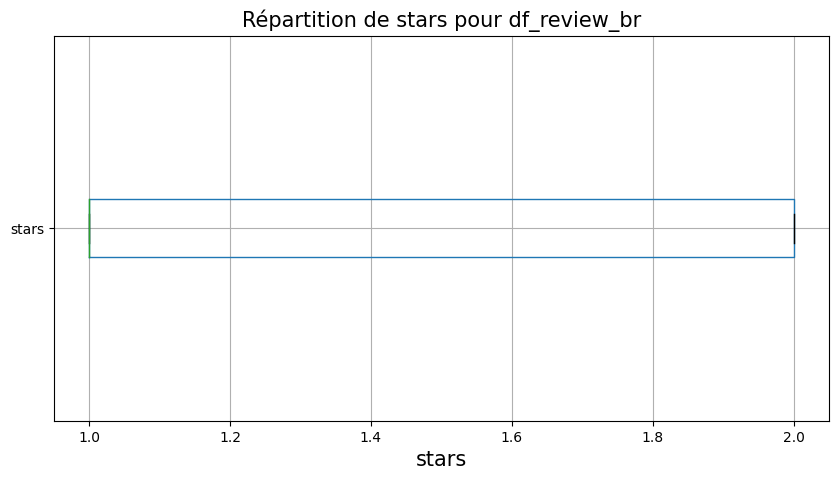

In [65]:
# Affichage de la répartition avec boxplot
plt.figure(figsize=(10, 5))
plt.title("Répartition de stars pour df_review_br", fontsize=15)
df_review_br.boxplot(column="stars", vert=False, notch=False)
plt.xlabel("stars", fontsize=15)
plt.show()

In [66]:
df_review_br.describe(include="object")

,business_id,text
count,1611202,1611202
unique,129491,1609623
top,IkY2ticzHEn4QFn8hQLSWg,"DO NOT PARK HERE!\nthey are too quick to boot you!\n$144 to remove a boot.\nIf you lose track of time (a normal affair in New Orleans, having fun) and even if (like I did) you add time, they get you in between!!!!\nAVOID ALL PREMIUM PARKING LOTS!!\nThere are so many other options near by!\nTrust me!"
freq,1807,18


##### <a name="C33153">3.3.1.5.3 df_final_api </a>

In [67]:
df_final_api.describe(include="object")

,name,comment
count,40,40
unique,34,40
top,Grandmaster Recorders,I went with a group to celebrate a friend's birthday. Our party organizer called ahead of time to see if the restaurant could accommodate my vegan diet....
freq,2,1


In [68]:
df_final_api.describe(include="int64")

,rating
count,40.000000
mean,1.600000
std,0.496139
min,1.000000
25%,1.000000
50%,2.000000
75%,2.000000
max,2.000000


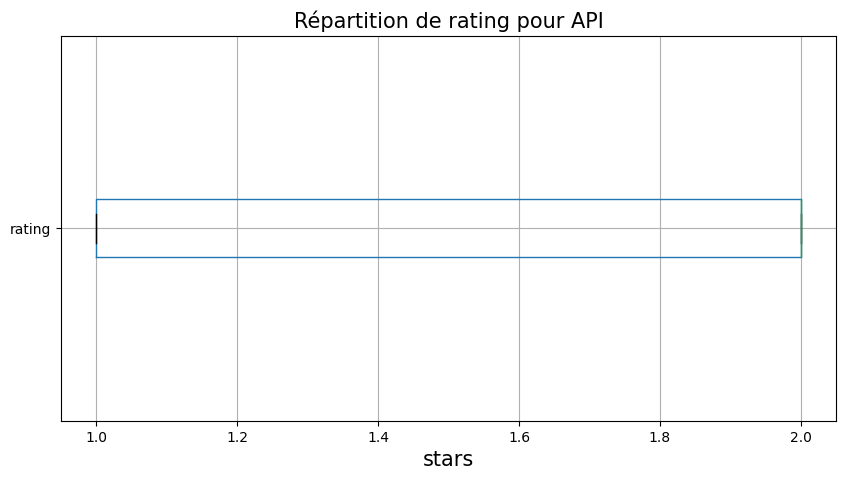

In [69]:
# Affichage de la répartition avec boxplot
plt.figure(figsize=(10, 5))
plt.title("Répartition de rating pour API", fontsize=15)
df_final_api.boxplot(column="rating", vert=False, notch=False)
plt.xlabel("stars", fontsize=15)
plt.show()

#### <a name="C3316"> 3.3.1.6 Rassemblement des 3 dataframes</a> 

##### <a name="C33161"> 3.3.1.6.1 Rassemblement df_business et df_review -> df_dataset</a> 

In [70]:
# Selectionner que les id restaurant trouvés dans business
df_review_br_named=pd.merge(df_review_br,df_business_resto[['business_id','name']], how='left', left_on='business_id', right_on='business_id')
df_review_br_named.head()

,business_id,stars,text,name
0,04UD14gamNjLY0IDYVhHJg,1,I am a long term frequent customer of this establishment. I just went in to order take out (3 apps) and was told they're too busy to do it. Really? The place is maybe half full at best. Does your dick reach your ass? Yes? Go fuck yourself! I'm a frequent customer AND great tipper. Glad that Kanella just opened. NEVER going back to dmitris!,Dmitri's
1,ltBBYdNzkeKdCNPDAsxwAA,2,"I at least have to give this restaurant two stars due to the decent food. But while on a dinner meeting and after spending $100 on entrées and appetizers, I had to flag down the assistant cook, (the guy in bright red baggy pants watching TV), to see if I could get more avocado for my tuna entrée. He made it very apparent and direct that he could not help me with that situation and I would have to flag down my waitress so she could bill me for the four dollar avocado.",Tavern
2,A2q7d-CBM2-81tVkmS4JMw,2,"Straight to the point, it's cheap, it tastes and feels cheap\n\nThe good: price, location, dessert (edible food items are: baked chicken, fried chicken, mashed potatoes, Salad bar lol, meat and cheese bar, ravioli, pizza) also our waitress was bomb af\n\nThe meh: behind counter meat slicing station, shrimp (not even deveined), Mexican station\n\nThe bad: breakfast -worst eggs ever, actually worst, eggs. Le Benedict can't even cut through ham or English muffin (tried on all 3 occasions), steak, shrimp again, hell breaded items can't even, don't even. Decor it's the 1970 nightmare you can imagine\n\nTried 3 times and failed",The Buffet
3,j8JOZvfeHEfUWq3gEz6ABQ,2,"NEVER AGAIN. This is a so called restaurant that does nothing that a restaurant should other than prepare food, because the rest is done by the patron. Want water? Get up and go across the yard to get it. Want a drink, walk up a flight of stairs and pay cash. Want to sit in a dirty yard in dirty lawn chairs, enjoy yourself. The wait staff is mildy helpful in that they bring you your food after you go to the window and pay cash for it...kind of like New Orleans Hamburger and Seafood, but dirty and with live music (which is nice). It's a one in a lifetime experience for me...just once.",NaN
4,jNL5KUPz2-tHUJM__ysSaw,1,"If you want to pay for everything a la carte this is the place for you. \nFood wasn't terrible not impressive.\nThey brought a basket of chips and some tomato sauce which I asked politely for something spicier and some pico de gallo. She brought them happily to me and the salsa was much better. When asked what we would like to drink I asked for a coke and she brought out a bottle which I stated I wanted the fountain drink. She said ""oh that's only Pepsi"". Never mentioned that they only had bottle drinks for coke. \nWe ordered our food which was reasonably priced, asked for sour cream and also to put cheese on the taco. She let us know cheese was extra. \nIt was $2.50 extra for another basket of chips. \nWhen I received the bill we paid more for the condiments then the actual food. Side of sour cream 2.00, pico de gallo 2.50, salsa 2.00, chips 2.50, cheese 1.00 and the bottled coke that we didn't want 5.00. \nJust a suggestion...when you order anything make sure to ask if there is an extra charge.",El Chicanito Mexican Restaurant


In [71]:
df_review_br_named.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1611202 entries, 0 to 1611201
Data columns (total 4 columns):
 #   Column       Non-Null Count    Dtype 
---  ------       --------------    ----- 
 0   business_id  1611202 non-null  object
 1   stars        1611202 non-null  int64 
 2   text         1611202 non-null  object
 3   name         970190 non-null   object
dtypes: int64(1), object(3)
memory usage: 61.5+ MB


In [72]:
#Suppression des lignes contenant NaN dans "name" (=suppression des lignes qui ne sont pas des restaurants)
df_review_br_named=df_review_br_named.dropna(subset=['name'])
df_review_br_named.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 970190 entries, 0 to 1611200
Data columns (total 4 columns):
 #   Column       Non-Null Count   Dtype 
---  ------       --------------   ----- 
 0   business_id  970190 non-null  object
 1   stars        970190 non-null  int64 
 2   text         970190 non-null  object
 3   name         970190 non-null  object
dtypes: int64(1), object(3)
memory usage: 37.0+ MB


In [73]:
df_review_br_named["name"].nunique()

33885

In [74]:
df_review_br_named.head()

,business_id,stars,text,name
0,04UD14gamNjLY0IDYVhHJg,1,I am a long term frequent customer of this establishment. I just went in to order take out (3 apps) and was told they're too busy to do it. Really? The place is maybe half full at best. Does your dick reach your ass? Yes? Go fuck yourself! I'm a frequent customer AND great tipper. Glad that Kanella just opened. NEVER going back to dmitris!,Dmitri's
1,ltBBYdNzkeKdCNPDAsxwAA,2,"I at least have to give this restaurant two stars due to the decent food. But while on a dinner meeting and after spending $100 on entrées and appetizers, I had to flag down the assistant cook, (the guy in bright red baggy pants watching TV), to see if I could get more avocado for my tuna entrée. He made it very apparent and direct that he could not help me with that situation and I would have to flag down my waitress so she could bill me for the four dollar avocado.",Tavern
2,A2q7d-CBM2-81tVkmS4JMw,2,"Straight to the point, it's cheap, it tastes and feels cheap\n\nThe good: price, location, dessert (edible food items are: baked chicken, fried chicken, mashed potatoes, Salad bar lol, meat and cheese bar, ravioli, pizza) also our waitress was bomb af\n\nThe meh: behind counter meat slicing station, shrimp (not even deveined), Mexican station\n\nThe bad: breakfast -worst eggs ever, actually worst, eggs. Le Benedict can't even cut through ham or English muffin (tried on all 3 occasions), steak, shrimp again, hell breaded items can't even, don't even. Decor it's the 1970 nightmare you can imagine\n\nTried 3 times and failed",The Buffet
4,jNL5KUPz2-tHUJM__ysSaw,1,"If you want to pay for everything a la carte this is the place for you. \nFood wasn't terrible not impressive.\nThey brought a basket of chips and some tomato sauce which I asked politely for something spicier and some pico de gallo. She brought them happily to me and the salsa was much better. When asked what we would like to drink I asked for a coke and she brought out a bottle which I stated I wanted the fountain drink. She said ""oh that's only Pepsi"". Never mentioned that they only had bottle drinks for coke. \nWe ordered our food which was reasonably priced, asked for sour cream and also to put cheese on the taco. She let us know cheese was extra. \nIt was $2.50 extra for another basket of chips. \nWhen I received the bill we paid more for the condiments then the actual food. Side of sour cream 2.00, pico de gallo 2.50, salsa 2.00, chips 2.50, cheese 1.00 and the bottled coke that we didn't want 5.00. \nJust a suggestion...when you order anything make sure to ask if there is an extra charge.",El Chicanito Mexican Restaurant
5,SSZDGl2J-CEyIzuIbEiYNQ,2,"We started with the artichoke dip, big mistake. It was cold and the chips were stale. Mentioned to our waitress, but nothing came of it. We ordered a large pizza, thin crust which after adding toppings it was a bit pricey for pizza. Pizza was ok, not great. Except for not being our advocate our server was good. I have been here before for Cardinals game, it was better then. Will try another venue next time.",Caleco's Bar & Grill


In [75]:
# Récupération des colonnes utilies
df_review_br_named=df_review_br_named[['name','stars','text']]

#renommage des colonnes
df_review_br_named.columns = ['name','rating','comment']
df_review_br_named.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 970190 entries, 0 to 1611200
Data columns (total 3 columns):
 #   Column   Non-Null Count   Dtype 
---  ------   --------------   ----- 
 0   name     970190 non-null  object
 1   rating   970190 non-null  int64 
 2   comment  970190 non-null  object
dtypes: int64(1), object(2)
memory usage: 29.6+ MB


In [76]:
df_final_dataset=df_review_br_named.copy()
df_final_dataset.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 970190 entries, 0 to 1611200
Data columns (total 3 columns):
 #   Column   Non-Null Count   Dtype 
---  ------   --------------   ----- 
 0   name     970190 non-null  object
 1   rating   970190 non-null  int64 
 2   comment  970190 non-null  object
dtypes: int64(1), object(2)
memory usage: 29.6+ MB


In [77]:
df_final_dataset["name"].nunique()

33885

In [78]:
# Détection des doublons suite à rassemblement
df_tmp = df_final_dataset[df_final_dataset.duplicated()]
df_tmp.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 145 entries, 56201 to 1608653
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   name     145 non-null    object
 1   rating   145 non-null    int64 
 2   comment  145 non-null    object
dtypes: int64(1), object(2)
memory usage: 4.5+ KB


In [79]:
# Suppression des lignes 100% identiques 
df_final_dataset = df_final_dataset.drop_duplicates()
df_final_dataset.reset_index(drop=True,inplace=True)
df_final_dataset.info()
print("Il reste", df_final_dataset.shape[0], " dans df_final_dataset")

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 970045 entries, 0 to 970044
Data columns (total 3 columns):
 #   Column   Non-Null Count   Dtype 
---  ------   --------------   ----- 
 0   name     970045 non-null  object
 1   rating   970045 non-null  int64 
 2   comment  970045 non-null  object
dtypes: int64(1), object(2)
memory usage: 22.2+ MB
Il reste 970045  dans df_final_dataset


In [80]:
df_final_dataset["name"].nunique()

33885

##### <a name="C33162"> 3.3.1.6.2 Rassemblement df_final_api et df_dataset</a> 

In [81]:
df_final_dataset.head()

,name,rating,comment
0,Dmitri's,1,I am a long term frequent customer of this establishment. I just went in to order take out (3 apps) and was told they're too busy to do it. Really? The place is maybe half full at best. Does your dick reach your ass? Yes? Go fuck yourself! I'm a frequent customer AND great tipper. Glad that Kanella just opened. NEVER going back to dmitris!
1,Tavern,2,"I at least have to give this restaurant two stars due to the decent food. But while on a dinner meeting and after spending $100 on entrées and appetizers, I had to flag down the assistant cook, (the guy in bright red baggy pants watching TV), to see if I could get more avocado for my tuna entrée. He made it very apparent and direct that he could not help me with that situation and I would have to flag down my waitress so she could bill me for the four dollar avocado."
2,The Buffet,2,"Straight to the point, it's cheap, it tastes and feels cheap\n\nThe good: price, location, dessert (edible food items are: baked chicken, fried chicken, mashed potatoes, Salad bar lol, meat and cheese bar, ravioli, pizza) also our waitress was bomb af\n\nThe meh: behind counter meat slicing station, shrimp (not even deveined), Mexican station\n\nThe bad: breakfast -worst eggs ever, actually worst, eggs. Le Benedict can't even cut through ham or English muffin (tried on all 3 occasions), steak, shrimp again, hell breaded items can't even, don't even. Decor it's the 1970 nightmare you can imagine\n\nTried 3 times and failed"
3,El Chicanito Mexican Restaurant,1,"If you want to pay for everything a la carte this is the place for you. \nFood wasn't terrible not impressive.\nThey brought a basket of chips and some tomato sauce which I asked politely for something spicier and some pico de gallo. She brought them happily to me and the salsa was much better. When asked what we would like to drink I asked for a coke and she brought out a bottle which I stated I wanted the fountain drink. She said ""oh that's only Pepsi"". Never mentioned that they only had bottle drinks for coke. \nWe ordered our food which was reasonably priced, asked for sour cream and also to put cheese on the taco. She let us know cheese was extra. \nIt was $2.50 extra for another basket of chips. \nWhen I received the bill we paid more for the condiments then the actual food. Side of sour cream 2.00, pico de gallo 2.50, salsa 2.00, chips 2.50, cheese 1.00 and the bottled coke that we didn't want 5.00. \nJust a suggestion...when you order anything make sure to ask if there is an extra charge."
4,Caleco's Bar & Grill,2,"We started with the artichoke dip, big mistake. It was cold and the chips were stale. Mentioned to our waitress, but nothing came of it. We ordered a large pizza, thin crust which after adding toppings it was a bit pricey for pizza. Pizza was ok, not great. Except for not being our advocate our server was good. I have been here before for Cardinals game, it was better then. Will try another venue next time."


In [82]:
df_final_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 970045 entries, 0 to 970044
Data columns (total 3 columns):
 #   Column   Non-Null Count   Dtype 
---  ------   --------------   ----- 
 0   name     970045 non-null  object
 1   rating   970045 non-null  int64 
 2   comment  970045 non-null  object
dtypes: int64(1), object(2)
memory usage: 22.2+ MB


In [83]:
df_final_api.head()

,name,rating,comment
23,Osteria Mamma,2,I went with a group to celebrate a friend's birthday. Our party organizer called ahead of time to see if the restaurant could accommodate my vegan diet....
73,Pine & Crane,2,I LOVE P&C. Please make your clamshell bun hot. Last three times I ordered them they were all cold. Please someone let the owner or manager know. One...
80,Sparrow,2,"When you walk in, it's beautiful. The hostesses are attractive, all smiles, and very polite. But the tables are really packed in so you have to maneuver..."
83,Marlou Koreatown,2,Honestly... was pretty disappointed! I was expecting so much just because it's decorated SO well and the ambiance of the place is beautiful! I loved the...
91,Seoul Night by Chef Kang,1,i have been wanting to come here since they opened bc i loved their pop up chef kang. went there monday and got the kimchi pasta and volcano popcorn chicken...


In [84]:
df_final_api.reset_index(drop=True,inplace=True)
df_final_api.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40 entries, 0 to 39
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   name     40 non-null     object
 1   rating   40 non-null     int64 
 2   comment  40 non-null     object
dtypes: int64(1), object(2)
memory usage: 1.1+ KB


In [85]:
# Rassemblement des 2 dataframes

df_final=pd.concat([df_final_dataset, df_final_api], ignore_index=True)
df_final.head()

,name,rating,comment
0,Dmitri's,1,I am a long term frequent customer of this establishment. I just went in to order take out (3 apps) and was told they're too busy to do it. Really? The place is maybe half full at best. Does your dick reach your ass? Yes? Go fuck yourself! I'm a frequent customer AND great tipper. Glad that Kanella just opened. NEVER going back to dmitris!
1,Tavern,2,"I at least have to give this restaurant two stars due to the decent food. But while on a dinner meeting and after spending $100 on entrées and appetizers, I had to flag down the assistant cook, (the guy in bright red baggy pants watching TV), to see if I could get more avocado for my tuna entrée. He made it very apparent and direct that he could not help me with that situation and I would have to flag down my waitress so she could bill me for the four dollar avocado."
2,The Buffet,2,"Straight to the point, it's cheap, it tastes and feels cheap\n\nThe good: price, location, dessert (edible food items are: baked chicken, fried chicken, mashed potatoes, Salad bar lol, meat and cheese bar, ravioli, pizza) also our waitress was bomb af\n\nThe meh: behind counter meat slicing station, shrimp (not even deveined), Mexican station\n\nThe bad: breakfast -worst eggs ever, actually worst, eggs. Le Benedict can't even cut through ham or English muffin (tried on all 3 occasions), steak, shrimp again, hell breaded items can't even, don't even. Decor it's the 1970 nightmare you can imagine\n\nTried 3 times and failed"
3,El Chicanito Mexican Restaurant,1,"If you want to pay for everything a la carte this is the place for you. \nFood wasn't terrible not impressive.\nThey brought a basket of chips and some tomato sauce which I asked politely for something spicier and some pico de gallo. She brought them happily to me and the salsa was much better. When asked what we would like to drink I asked for a coke and she brought out a bottle which I stated I wanted the fountain drink. She said ""oh that's only Pepsi"". Never mentioned that they only had bottle drinks for coke. \nWe ordered our food which was reasonably priced, asked for sour cream and also to put cheese on the taco. She let us know cheese was extra. \nIt was $2.50 extra for another basket of chips. \nWhen I received the bill we paid more for the condiments then the actual food. Side of sour cream 2.00, pico de gallo 2.50, salsa 2.00, chips 2.50, cheese 1.00 and the bottled coke that we didn't want 5.00. \nJust a suggestion...when you order anything make sure to ask if there is an extra charge."
4,Caleco's Bar & Grill,2,"We started with the artichoke dip, big mistake. It was cold and the chips were stale. Mentioned to our waitress, but nothing came of it. We ordered a large pizza, thin crust which after adding toppings it was a bit pricey for pizza. Pizza was ok, not great. Except for not being our advocate our server was good. I have been here before for Cardinals game, it was better then. Will try another venue next time."


In [86]:
df_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 970085 entries, 0 to 970084
Data columns (total 3 columns):
 #   Column   Non-Null Count   Dtype 
---  ------   --------------   ----- 
 0   name     970085 non-null  object
 1   rating   970085 non-null  int64 
 2   comment  970085 non-null  object
dtypes: int64(1), object(2)
memory usage: 22.2+ MB


In [87]:
df_final["name"].nunique()

33918

In [88]:
# Détection des doublons suite à rassemblement
df_tmp = df_final[df_final.duplicated()]
df_tmp.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 0 entries
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   name     0 non-null      object
 1   rating   0 non-null      int64 
 2   comment  0 non-null      object
dtypes: int64(1), object(2)
memory usage: 0.0+ bytes


#### <a name="C3317"> 3.3.1.7 Bilan du nettoyage</a> 

In [89]:
df_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 970085 entries, 0 to 970084
Data columns (total 3 columns):
 #   Column   Non-Null Count   Dtype 
---  ------   --------------   ----- 
 0   name     970085 non-null  object
 1   rating   970085 non-null  int64 
 2   comment  970085 non-null  object
dtypes: int64(1), object(2)
memory usage: 22.2+ MB


### <a name="C332"> 3.3.2 Images</a> 

In [90]:
df_images.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200100 entries, 0 to 200099
Data columns (total 4 columns):
 #   Column       Non-Null Count   Dtype 
---  ------       --------------   ----- 
 0   photo_id     200100 non-null  object
 1   business_id  200100 non-null  object
 2   caption      200100 non-null  object
 3   label        200100 non-null  object
dtypes: object(4)
memory usage: 6.1+ MB


#### <a name="C3321"> 3.3.2.1 Sélection des colonnes/lignes d'un point de vu métier</a> 

In [91]:
df_images=df_images[['photo_id','label']]
df_images.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200100 entries, 0 to 200099
Data columns (total 2 columns):
 #   Column    Non-Null Count   Dtype 
---  ------    --------------   ----- 
 0   photo_id  200100 non-null  object
 1   label     200100 non-null  object
dtypes: object(2)
memory usage: 3.1+ MB


#### <a name="C3322"> 3.3.2.2 Les manquants</a> 

Pas de manquants dans la df_images

#### <a name="C3323"> 3.3.2.3 Les types</a> 

Les types sont bien affectés dans la dataframe

#### <a name="C3324">3.3.2.4 Les doublons </a>

##### <a name="C33241">3.3.2.4.1 df_images </a>

In [92]:
df_tmp = df_images[df_images.duplicated()]
df_tmp.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 0 entries
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   photo_id  0 non-null      object
 1   label     0 non-null      object
dtypes: object(2)
memory usage: 0.0+ bytes


Pas de doublons dans la dataframe si l'on considère toutes les lignes

In [93]:
df_tmp = df_images[df_images["photo_id"].duplicated()]
df_tmp.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2 entries, 174504 to 188850
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   photo_id  2 non-null      object
 1   label     2 non-null      object
dtypes: object(2)
memory usage: 48.0+ bytes


In [94]:
#Identification des 2 photos_id
df_tmp.head()

,photo_id,label
174504,_CYoxbCIKuAwpq4crHCPWg,drink
188850,qtl5YDIc2q0yelW_e9FfqQ,food


In [95]:
df_tmp=df_images.loc[df_images['photo_id']=="_CYoxbCIKuAwpq4crHCPWg"]
df_tmp.head()

,photo_id,label
29695,_CYoxbCIKuAwpq4crHCPWg,inside
174504,_CYoxbCIKuAwpq4crHCPWg,drink


In [96]:
df_tmp=df_images.loc[df_images['photo_id']=="qtl5YDIc2q0yelW_e9FfqQ"]
df_tmp.head()

,photo_id,label
173977,qtl5YDIc2q0yelW_e9FfqQ,inside
188850,qtl5YDIc2q0yelW_e9FfqQ,food


On constate ici 2 fois la même photo. En vérifiant chaque photo, les 2 labels sont plutôt sur drink et food au lieu de inside. Je vais donc garder les 2 derniers élements.

In [97]:
df_images = df_images.drop_duplicates(subset=['photo_id'],keep='last')
df_images.reset_index(inplace=True, drop=True)
df_images.info()
print("Il reste", df_images.shape[0], " dans df_images")

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200098 entries, 0 to 200097
Data columns (total 2 columns):
 #   Column    Non-Null Count   Dtype 
---  ------    --------------   ----- 
 0   photo_id  200098 non-null  object
 1   label     200098 non-null  object
dtypes: object(2)
memory usage: 3.1+ MB
Il reste 200098  dans df_images


##### <a name="C33242">3.3.2.4.2 list_images </a>

In [98]:
len(list_images)

200098

In [99]:
list_images_cc=set(list_images)
len(list_images_cc)

200098

Pas de doublons à constater dans la liste d'images.

#### <a name="C3325">3.3.2.5 Outliers </a>

In [100]:
df_images.describe(include="object")

,photo_id,label
count,200098,200098
unique,200098,5
top,zsvj7vloL4L5jhYyPIuVwg,food
freq,1,108152


Pas de défaut à constater

#### <a name="C3326">3.3.2.6 Alignement de la liste d'images et le dataframe </a>

On va vérifier que les photos présentes dans la liste d'images sont bien toutes dans la df_images

##### <a name="C33261">3.3.2.6.1 Vérification du contenus de la liste vs photo_id</a>

In [101]:
filtered_df = df_images[df_images.photo_id.isin(list_images)]
filtered_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 0 entries
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   photo_id  0 non-null      object
 1   label     0 non-null      object
dtypes: object(2)
memory usage: 0.0+ bytes


Nous constatons le même nombre de lignes ce qui signifie que toutes les photos dans "df_images" sont nommées dans "list_images".

##### <a name="C33262">3.3.2.6.2 Trie dans l'ordre croissant/alphabétique</a>

On va trier la liste d'images et les photo_id pour pouvoir avoir le même ordre et faire correspondre les indices au moment de l'affichage

In [102]:
df_images=df_images.sort_values(by=['photo_id'], ascending=True)
df_images.reset_index(inplace=True, drop=True)
df_images.head()

,photo_id,label
0,--0h6FMC0V8aMtKQylojEg,inside
1,--3JQ4MlO-jHT9xbo7liug,food
2,--3P3fjPrScy06XVLi4vhg,inside
3,--4DfhW2sJvjeC90KEDX3g,inside
4,--5V3mRlhb3zqE5yF4Gpaw,inside


In [103]:
list_images.sort(reverse=False)
list_images[:5]

['--0h6FMC0V8aMtKQylojEg.jpg',
 '--3JQ4MlO-jHT9xbo7liug.jpg',
 '--3P3fjPrScy06XVLi4vhg.jpg',
 '--4DfhW2sJvjeC90KEDX3g.jpg',
 '--5V3mRlhb3zqE5yF4Gpaw.jpg']

In [104]:
list_images[:5]

['--0h6FMC0V8aMtKQylojEg.jpg',
 '--3JQ4MlO-jHT9xbo7liug.jpg',
 '--3P3fjPrScy06XVLi4vhg.jpg',
 '--4DfhW2sJvjeC90KEDX3g.jpg',
 '--5V3mRlhb3zqE5yF4Gpaw.jpg']

#### <a name="C3327">3.3.2.7 Bilan du nettoyage </a>

In [105]:
df_images.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200098 entries, 0 to 200097
Data columns (total 2 columns):
 #   Column    Non-Null Count   Dtype 
---  ------    --------------   ----- 
 0   photo_id  200098 non-null  object
 1   label     200098 non-null  object
dtypes: object(2)
memory usage: 3.1+ MB


In [106]:
len(list_images)

200098

# <a name="C4"> 4. Analyse</a> 

## <a name="C4.1"> 4.1 Textes</a> 

Analyse sur "df_final_dataset" (sans les quelques lignes API pour garder une stabilité dans l'analyse); en effet à chaque requête via l'API, le nombre de commentaires et la notation peuvent évoluer.

In [107]:
df_final_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 970045 entries, 0 to 970044
Data columns (total 3 columns):
 #   Column   Non-Null Count   Dtype 
---  ------   --------------   ----- 
 0   name     970045 non-null  object
 1   rating   970045 non-null  int64 
 2   comment  970045 non-null  object
dtypes: int64(1), object(2)
memory usage: 22.2+ MB


### <a name="C411"> 4.1.1 Analyses univariées</a> 

#### <a name="C4111"> 4.1.1.1 Notations</a> 

In [108]:
df_final_dataset.describe()

,rating
count,970045.000000
mean,1.416443
std,0.492969
min,1.000000
25%,1.000000
50%,1.000000
75%,2.000000
max,2.000000


In [109]:
df_final_dataset.rating.value_counts()

1    566077
2    403968
Name: rating, dtype: int64

In [110]:
df_final_dataset.rating.value_counts(normalize=True)

1    0.583557
2    0.416443
Name: rating, dtype: float64

<Axes: ylabel='rating'>

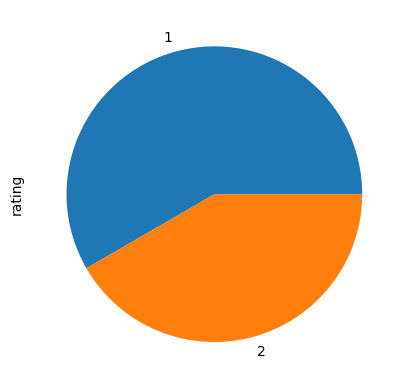

In [111]:
df_final_dataset.rating.value_counts().plot(kind="pie")

#### <a name="C4112"> 4.1.1.2 Les avis</a> 

In [112]:
df_final_dataset.describe(include="object")

,name,comment
count,970045,970045
unique,33885,969702
top,McDonald's,.
freq,14145,5


In [113]:
# Affichage des longueurs de chaque document
tmp=df_final_dataset.comment.apply(lambda i : len(i))
tmp.head()

0     341
1     473
2     621
3    1016
4     413
Name: comment, dtype: int64

<Axes: >

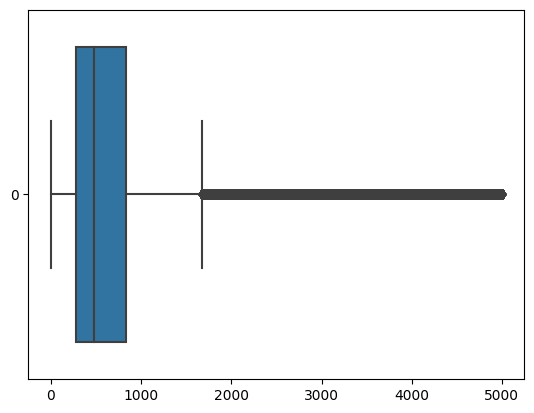

In [114]:
tmp = df_final_dataset.comment.str.len()
sns.boxplot(tmp, orient="h")

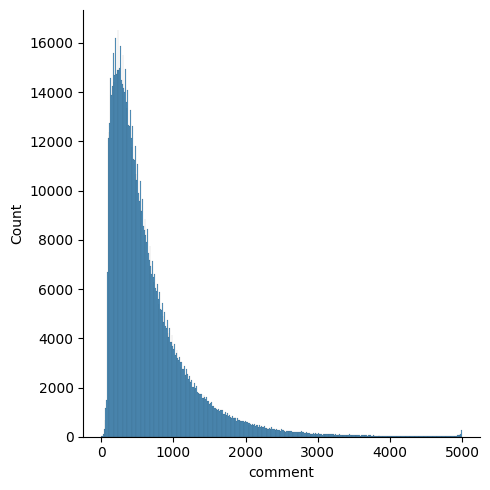

In [115]:
sns.displot(tmp)

In [116]:
tmp.describe()

count    970045.000000
mean        655.564888
std         583.320976
min           1.000000
25%         273.000000
50%         482.000000
75%         835.000000
max        5000.000000
Name: comment, dtype: float64

In [117]:
#Création d'une nouvelle colonne : feature ingeneering pour afficher le nombre de lettre dans le commentaire (espace et pontuation comprise)
df_final_dataset["_len_txt"]=tmp

In [118]:
df_final_dataset.head()

,name,rating,comment,_len_txt
0,Dmitri's,1,I am a long term frequent customer of this establishment. I just went in to order take out (3 apps) and was told they're too busy to do it. Really? The place is maybe half full at best. Does your dick reach your ass? Yes? Go fuck yourself! I'm a frequent customer AND great tipper. Glad that Kanella just opened. NEVER going back to dmitris!,341
1,Tavern,2,"I at least have to give this restaurant two stars due to the decent food. But while on a dinner meeting and after spending $100 on entrées and appetizers, I had to flag down the assistant cook, (the guy in bright red baggy pants watching TV), to see if I could get more avocado for my tuna entrée. He made it very apparent and direct that he could not help me with that situation and I would have to flag down my waitress so she could bill me for the four dollar avocado.",473
2,The Buffet,2,"Straight to the point, it's cheap, it tastes and feels cheap\n\nThe good: price, location, dessert (edible food items are: baked chicken, fried chicken, mashed potatoes, Salad bar lol, meat and cheese bar, ravioli, pizza) also our waitress was bomb af\n\nThe meh: behind counter meat slicing station, shrimp (not even deveined), Mexican station\n\nThe bad: breakfast -worst eggs ever, actually worst, eggs. Le Benedict can't even cut through ham or English muffin (tried on all 3 occasions), steak, shrimp again, hell breaded items can't even, don't even. Decor it's the 1970 nightmare you can imagine\n\nTried 3 times and failed",621
3,El Chicanito Mexican Restaurant,1,"If you want to pay for everything a la carte this is the place for you. \nFood wasn't terrible not impressive.\nThey brought a basket of chips and some tomato sauce which I asked politely for something spicier and some pico de gallo. She brought them happily to me and the salsa was much better. When asked what we would like to drink I asked for a coke and she brought out a bottle which I stated I wanted the fountain drink. She said ""oh that's only Pepsi"". Never mentioned that they only had bottle drinks for coke. \nWe ordered our food which was reasonably priced, asked for sour cream and also to put cheese on the taco. She let us know cheese was extra. \nIt was $2.50 extra for another basket of chips. \nWhen I received the bill we paid more for the condiments then the actual food. Side of sour cream 2.00, pico de gallo 2.50, salsa 2.00, chips 2.50, cheese 1.00 and the bottled coke that we didn't want 5.00. \nJust a suggestion...when you order anything make sure to ask if there is an extra charge.",1016
4,Caleco's Bar & Grill,2,"We started with the artichoke dip, big mistake. It was cold and the chips were stale. Mentioned to our waitress, but nothing came of it. We ordered a large pizza, thin crust which after adding toppings it was a bit pricey for pizza. Pizza was ok, not great. Except for not being our advocate our server was good. I have been here before for Cardinals game, it was better then. Will try another venue next time.",413


In [119]:
# Visuel sur le nombre d'avis :

In [120]:
df_tmp=df_final_dataset["name"].value_counts()
df_tmp=pd.DataFrame(df_tmp)
df_tmp.reset_index(inplace=True)
df_tmp.rename(columns={"index": "nom", "name": "qte"}, inplace=True)
df_tmp.head()

,nom,qte
0,McDonald's,14145
1,Taco Bell,5984
2,Chipotle Mexican Grill,5622
3,Wendy's,4663
4,Buffalo Wild Wings,4465


Text(0.5, 0, 'Nom restaurants')

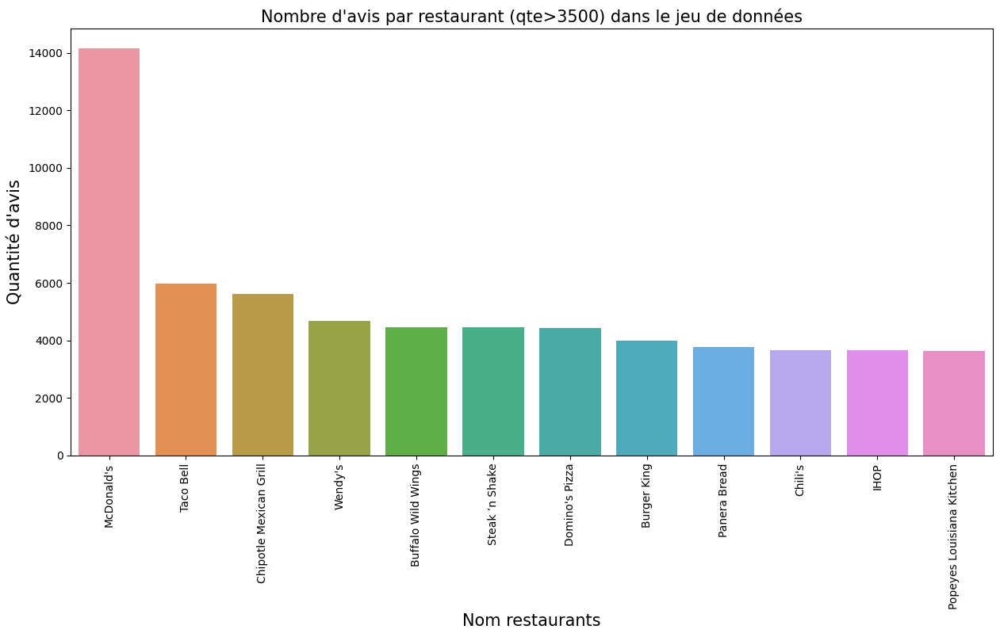

In [121]:
df_tmp2=df_tmp.loc[df_tmp['qte']>3500]
plt.figure(figsize=(15,7)) #taille de la fenetre pour le barplot
plt.xticks(rotation=90)#Rotation de 90°de l'axe des abscisses
sns.barplot(data=df_tmp2, x='nom', y='qte')#Création du barplot
plt.title("Nombre d'avis par restaurant (qte>3500) dans le jeu de données",fontsize=15)
plt.ylabel("Quantité d'avis", fontsize=15) #Titre de l'axe des ordonnées en taille 10
plt.xlabel("Nom restaurants", fontsize=15) #Titre de l'axe des abscisses en taille 10

Text(0.5, 1.0, "Nombre d'avis par restaurant (qte>500) dans le jeu de données")

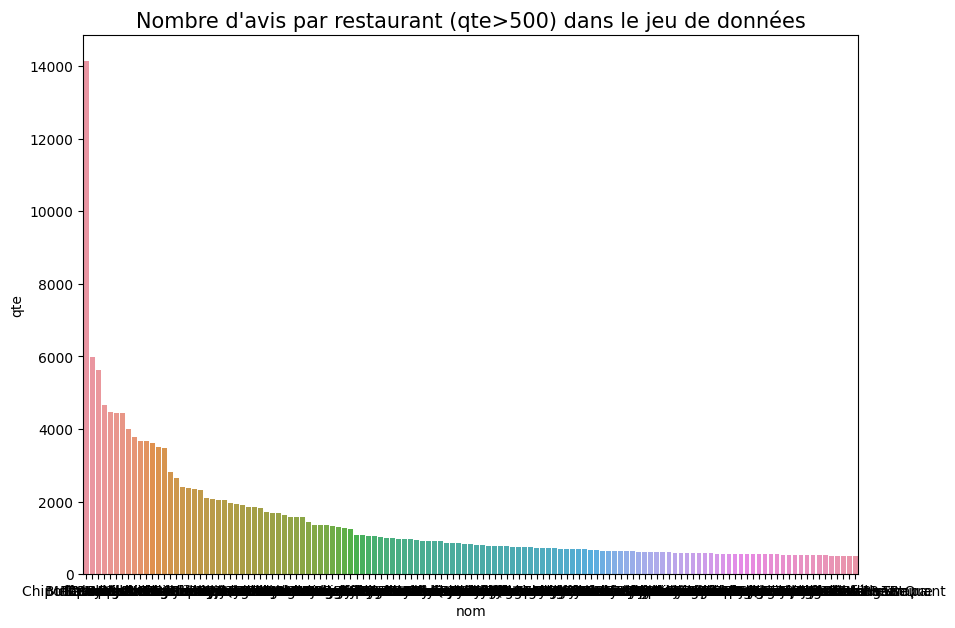

In [122]:
df_tmp3=df_tmp.loc[df_tmp['qte']>500]
plt.figure(figsize=(10,7)) #taille de la fenetre pour le barplot
sns.barplot(data=df_tmp3, x='nom', y='qte')#Création du barplot
plt.title("Nombre d'avis par restaurant (qte>500) dans le jeu de données",fontsize=15)

In [123]:
df_tmp2=df_final_dataset["name"].value_counts(normalize=True)
df_tmp2.head(10)

McDonald's                0.014582
Taco Bell                 0.006169
Chipotle Mexican Grill    0.005796
Wendy's                   0.004807
Buffalo Wild Wings        0.004603
Steak ’n Shake            0.004587
Domino's Pizza            0.004576
Burger King               0.004119
Panera Bread              0.003895
Chili's                   0.003780
Name: name, dtype: float64

### <a name="C412"> 4.1.2 Analyse multivariée</a> 

In [124]:
corr=df_final_dataset.corr()
corr

C:\Users\Utilisateur\AppData\Local\Temp\ipykernel_5988\2584600850.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr=df_final_dataset.corr()


,rating,_len_txt
rating,1.000000,0.055584
_len_txt,0.055584,1.000000


<Axes: >

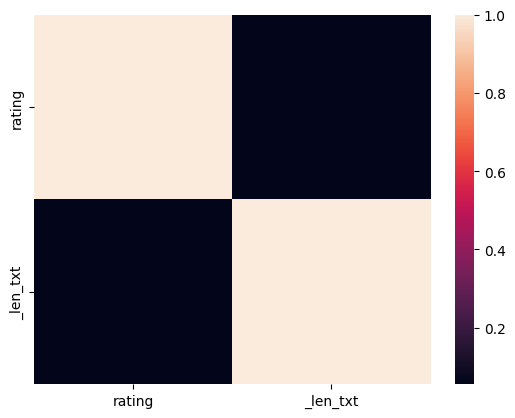

In [125]:
sns.heatmap(corr)

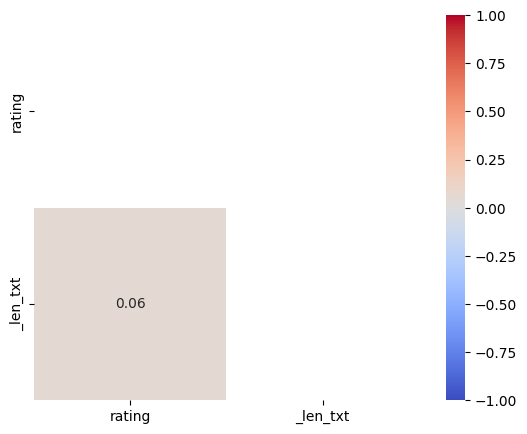

In [126]:
# affichage que de la diagonale
mask=np.zeros_like(corr)
mask[np.triu_indices_from(mask)]=True

fid, ax = plt.subplots(1,1, figsize=(7,5))
ax=sns.heatmap(corr, mask=mask, vmin=-1,vmax=1,cmap="coolwarm", annot=True, fmt=".2f", square=True)

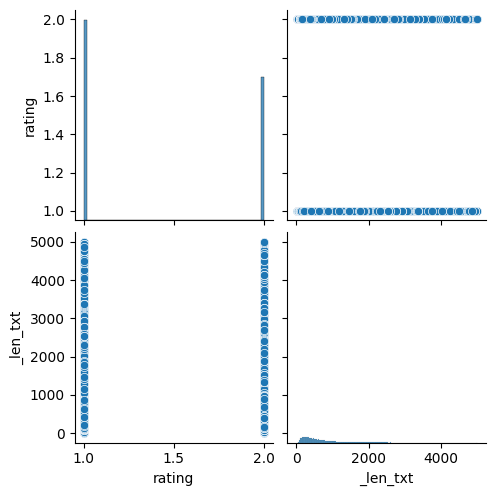

In [127]:
sns.pairplot(df_final_dataset)

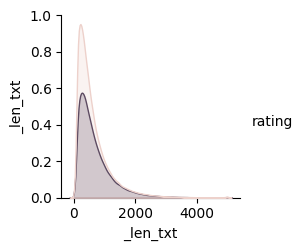

In [128]:
sns.pairplot(df_final_dataset, hue="rating")

In [129]:
df_final_dataset.sort_values("_len_txt").head(10)

,name,rating,comment,_len_txt
35996,Strange Donuts,1,.,1
342222,Fleming’s Prime Steakhouse & Wine Bar,2,*,1
427545,Le Pavillon Hotel,1,.,1
216305,Lily's Mexican Restaurant,1,.,1
308056,The Canadian Brewhouse,2,Y,1
369419,Eureka!,1,S,1
625212,Fuzzy's Taco Shop,1,O,1
822174,Germantown Cafe,1,D,1
212534,Three Brothers Pizza,2,.,1
619860,Texas Roadhouse,2,N,1


On voit ici que les commentaires en 1 seule lettre n'apportent pas d'information pertinente.

In [130]:
df_tmp=df_final_dataset.loc[df_final_dataset["_len_txt"]==9]
df_tmp.head(10)

,name,rating,comment,_len_txt
308291,Santa Barbara Brewing Co,1,Sorry bad,9
671908,Wendy's,1,Horrible!,9


In [131]:
df_tmp=df_final_dataset.loc[df_final_dataset["_len_txt"]==18]
df_tmp.head(10)

,name,rating,comment,_len_txt
127657,Subway,1,Crappy in general.,18
443473,Chancellors,1,Fail...'nuff said.,18
524917,Daisy Dukes - French Quarter,1,ehhh... was so so.,18
740733,la Madeleine French Bakery & Cafe,2,Needs improvement!,18


On observe quelques mots interessants

In [132]:
# Suppression de la colonne _len_txt car l'on va se concenter sur le rating et comment
df_final_dataset.drop(columns="_len_txt", inplace=True)
df_final_dataset.head()

,name,rating,comment
0,Dmitri's,1,I am a long term frequent customer of this establishment. I just went in to order take out (3 apps) and was told they're too busy to do it. Really? The place is maybe half full at best. Does your dick reach your ass? Yes? Go fuck yourself! I'm a frequent customer AND great tipper. Glad that Kanella just opened. NEVER going back to dmitris!
1,Tavern,2,"I at least have to give this restaurant two stars due to the decent food. But while on a dinner meeting and after spending $100 on entrées and appetizers, I had to flag down the assistant cook, (the guy in bright red baggy pants watching TV), to see if I could get more avocado for my tuna entrée. He made it very apparent and direct that he could not help me with that situation and I would have to flag down my waitress so she could bill me for the four dollar avocado."
2,The Buffet,2,"Straight to the point, it's cheap, it tastes and feels cheap\n\nThe good: price, location, dessert (edible food items are: baked chicken, fried chicken, mashed potatoes, Salad bar lol, meat and cheese bar, ravioli, pizza) also our waitress was bomb af\n\nThe meh: behind counter meat slicing station, shrimp (not even deveined), Mexican station\n\nThe bad: breakfast -worst eggs ever, actually worst, eggs. Le Benedict can't even cut through ham or English muffin (tried on all 3 occasions), steak, shrimp again, hell breaded items can't even, don't even. Decor it's the 1970 nightmare you can imagine\n\nTried 3 times and failed"
3,El Chicanito Mexican Restaurant,1,"If you want to pay for everything a la carte this is the place for you. \nFood wasn't terrible not impressive.\nThey brought a basket of chips and some tomato sauce which I asked politely for something spicier and some pico de gallo. She brought them happily to me and the salsa was much better. When asked what we would like to drink I asked for a coke and she brought out a bottle which I stated I wanted the fountain drink. She said ""oh that's only Pepsi"". Never mentioned that they only had bottle drinks for coke. \nWe ordered our food which was reasonably priced, asked for sour cream and also to put cheese on the taco. She let us know cheese was extra. \nIt was $2.50 extra for another basket of chips. \nWhen I received the bill we paid more for the condiments then the actual food. Side of sour cream 2.00, pico de gallo 2.50, salsa 2.00, chips 2.50, cheese 1.00 and the bottled coke that we didn't want 5.00. \nJust a suggestion...when you order anything make sure to ask if there is an extra charge."
4,Caleco's Bar & Grill,2,"We started with the artichoke dip, big mistake. It was cold and the chips were stale. Mentioned to our waitress, but nothing came of it. We ordered a large pizza, thin crust which after adding toppings it was a bit pricey for pizza. Pizza was ok, not great. Except for not being our advocate our server was good. I have been here before for Cardinals game, it was better then. Will try another venue next time."


In [133]:
df_final_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 970045 entries, 0 to 970044
Data columns (total 3 columns):
 #   Column   Non-Null Count   Dtype 
---  ------   --------------   ----- 
 0   name     970045 non-null  object
 1   rating   970045 non-null  int64 
 2   comment  970045 non-null  object
dtypes: int64(1), object(2)
memory usage: 22.2+ MB


### <a name="C413"> 4.1.3 Exploration du corpus</a> 

In [134]:
df_samp=df_final_dataset.sample(20)
df_samp

,name,rating,comment
743160,Sonic Drive-In,1,It irritates me to no end! The food? Fine. The people? Great. But the company doesn't give a crap about they're workers. Not allowing patrons to tip they're servers when paying with a card is BS! Every one else does. What's Sonic's excuse? Whatever it is ain't true. TAKE CARE OF YPUR WORKERS! Especially now.
540263,Antoine's Restaurant,1,I was so looking forward to going to this restaurant because of all of the great reviews and history that it had but ultimately it was very mediocre and extremely disappointing.\nMy son had the Filet St. Louis and the waiter forgot to bring his sauce on the side that he ordered it was nothing special. My daughter had the Lamb Noisettes and she said it was very mediocre also. My husband and I had the Pompano Pontchartrain. My husband said that it was okay he ate it cuz he was hungry.\nBut before we order the fish I had asked the waiter for a fish dish that was not too fishy and that had sauce and I had to send it back because it was too fishy and it had absolutely no sauce and was very plain. So I then ordered the Chicken Coq au Vin and it was not very flavorful very plain very mediocre. \nAlso the prices you pay and the quantity that you get makes it extremely expensive and not worth it.\nOur waiter was way too busy not very attentive and forgot several things that we had asked him to bring. At\nthis level of dining and prices you really expect more for four of us with tip it was almost $400.\nI was really really looking forward to having a great wonderful flavorful meal because of its history but I really would not recommend this restaurant I don't understand how it has such great reviews. it seems that all these people come to eat here because it's the oldest restaurant in New Orleans and it has a lot of history but it is by far not worth it.
600358,Jack's Firehouse,2,"This is more of a restaurant than a bar. We popped in at around 1130 on Friday and the whole back was dark, and they were taking in the outside tables. The place closest at 1. The beer list was small and unimpressive. \nThe bartender was really nice, although it took almost 10 minutes to wait for him to come back to the unmanned bar for us to order our first drinks."
266176,Friendly's,1,So again I get my ice cream to and what do you know they mess it up. I ask for no hot fudge only peanut butter sauce and the girl gives me only hot fudge and no peanut butter sauce. When I go to say something to her she gives me a attitude and mumbles something under her breath and tosses the ice cream in the trash and then when I get my new large sundae it's smaller then my other other I had and definitely smaller then the other two I have. I don't know what type of workers the manager has working here but he or she needs to do something about it because these is the third time this has happened to me within the last two weeks of coming here
405475,Cantina,1,Yuck the food here is not good at all. Had the chicken fajitas and there was no taste at all on my food. \n\n\nSo if you're looking for authentic Mexican food this is NOT the place to go. \n\nThe service wasn't that good either.
505047,Hilton Philadelphia City Avenue,2,"Had to stay for 2 nights w/ my mom due to an emergency at our home. Room only had one bed, it should of had two. I was tired and pre-occupied so I didn't complain. I ended up sleeping on the chair in the room. It was a comfortable chair, but no bed. Our room did have a view of the water reservoir, which impressed my mom...but not me. Now that I think about it, this place probably ruined Hilton hotels for me. Not because of the bed issue, but because for the price I really didn't get anything special."
633904,Holler & Dash Biscuit House,2,"Was excited about this being in my neighborhood, and have gone a few times. Disappointed in the recent changes: actual plates and silverware replaced with disposable paper and plastic, table service with ""enjoy your breakfast"" replaced with a 

In [135]:
# Pour chaque ligne extraction de l'index et le vecteur en imprimant uniquement la partie texte
for idx , ser in df_samp.iterrows():
    print(ser["comment"])

It irritates me to no end! The food? Fine. The people? Great. But the company doesn't give a crap about they're workers. Not allowing patrons to tip they're servers when paying with a card is BS! Every one else does. What's Sonic's excuse? Whatever it is ain't true. TAKE CARE OF YPUR WORKERS!  Especially now.
I was so looking forward to going to this restaurant because of all of the great reviews and history that it had but ultimately it was very mediocre and extremely disappointing.
My son had the Filet St. Louis and the waiter forgot to bring his sauce on the side that he ordered it was nothing special. My daughter had the Lamb Noisettes and she said it was very mediocre also. My husband and I had the Pompano Pontchartrain. My husband said that it was okay he ate it cuz he was hungry.
But before we order the fish I had asked the waiter for a fish dish that was not too fishy and that had sauce and I had to send it back because it was too fishy and it had absolutely no sauce and was ve

In [136]:
# Amélioration de la boucle for pour une meilleur lisibilité
for idx , ser in df_samp.iterrows():
    txt_1=f"rating : {ser['rating']}\n"
    print(txt_1 + ser['comment']+"..."+"\n\n")

rating : 1
It irritates me to no end! The food? Fine. The people? Great. But the company doesn't give a crap about they're workers. Not allowing patrons to tip they're servers when paying with a card is BS! Every one else does. What's Sonic's excuse? Whatever it is ain't true. TAKE CARE OF YPUR WORKERS!  Especially now....


rating : 1
I was so looking forward to going to this restaurant because of all of the great reviews and history that it had but ultimately it was very mediocre and extremely disappointing.
My son had the Filet St. Louis and the waiter forgot to bring his sauce on the side that he ordered it was nothing special. My daughter had the Lamb Noisettes and she said it was very mediocre also. My husband and I had the Pompano Pontchartrain. My husband said that it was okay he ate it cuz he was hungry.
But before we order the fish I had asked the waiter for a fish dish that was not too fishy and that had sauce and I had to send it back because it was too fishy and it had abs

## <a name="C4.2"> 4.2 Images</a> 

### <a name="C421"> 4.2.1 Analyses univariées</a> 

In [137]:
df_images.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200098 entries, 0 to 200097
Data columns (total 2 columns):
 #   Column    Non-Null Count   Dtype 
---  ------    --------------   ----- 
 0   photo_id  200098 non-null  object
 1   label     200098 non-null  object
dtypes: object(2)
memory usage: 3.1+ MB


In [138]:
df_images.head()

,photo_id,label
0,--0h6FMC0V8aMtKQylojEg,inside
1,--3JQ4MlO-jHT9xbo7liug,food
2,--3P3fjPrScy06XVLi4vhg,inside
3,--4DfhW2sJvjeC90KEDX3g,inside
4,--5V3mRlhb3zqE5yF4Gpaw,inside


#### <a name="C4211"> 4.2.1.1 Labels</a> 

In [139]:
df_images.groupby("label").count()

,photo_id
label,
drink,15670
food,108152
inside,56029
menu,1678
outside,18569


In [140]:
df_images.label.value_counts()

food       108152
inside      56029
outside     18569
drink       15670
menu         1678
Name: label, dtype: int64

In [141]:
df_images.label.value_counts(normalize=True)

food       0.540495
inside     0.280008
outside    0.092800
drink      0.078312
menu       0.008386
Name: label, dtype: float64

<Axes: ylabel='label'>

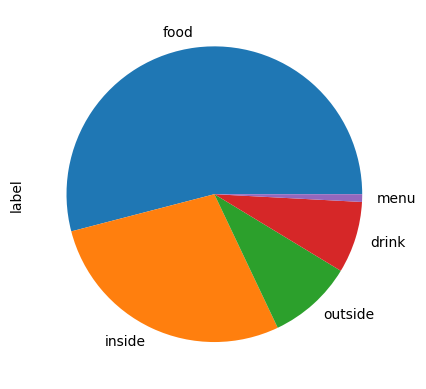

In [142]:
df_images.label.value_counts().plot(kind="pie")

### <a name="C422"> 4.2.2 Analyses multivariées</a> 

Quelques images par label :

inside


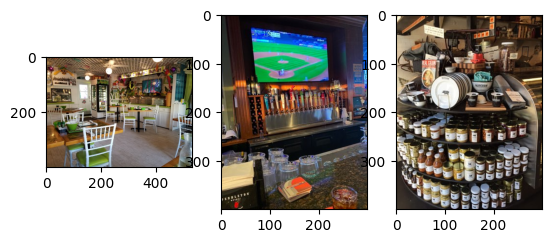

food


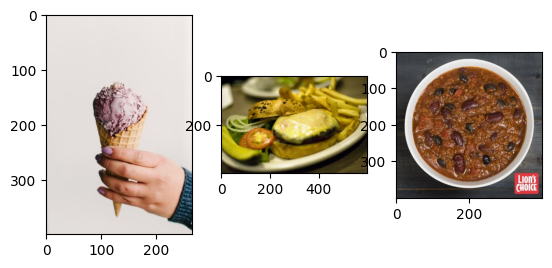

outside


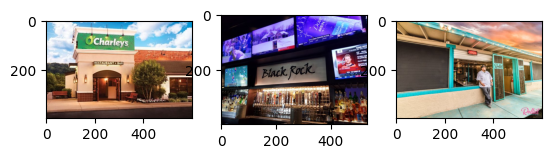

drink


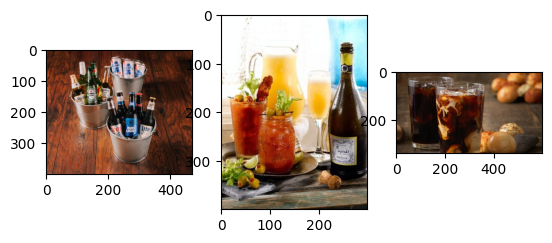

menu


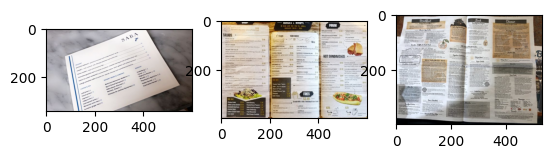

In [143]:
def list_fct(name) :
    list_image_name = [list_images[i] for i in range(len(df_images)) if df_images["label"][i]==name]
    return list_image_name


list_labels = df_images["label"].unique()
list_labels=list_labels.tolist() # conversion de array en list


list_drink=[list_images[i] for i in range(len(df_images)) if df_images["label"][i]=="drink"]
list_food=[list_images[i] for i in range(len(df_images)) if df_images["label"][i]=="food"]
list_inside=[list_images[i] for i in range(len(df_images)) if df_images["label"][i]=="inside"]
list_menu=[list_images[i] for i in range(len(df_images)) if df_images["label"][i]=="menu"]
list_outside=[list_images[i] for i in range(len(df_images)) if df_images["label"][i]=="outside"]

for name in list_labels :
    print(name)
    # print("-------")
    for i in range(3):
        plt.subplot(130 + 1 + i)
        filename = path + list_fct(name)[i+10]
        image = imread(filename)
        plt.imshow(image)
    plt.show()

Pour un échantillon, le label semble être aligné à l'image indiqué

food


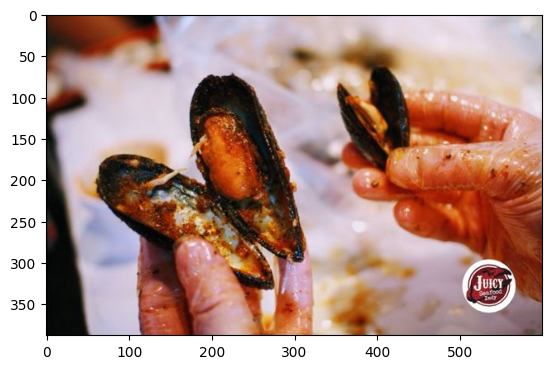

In [144]:
# -------Quelques vérifications aléatoires d'alignement label/images-----

# récupération d'une valeur aléatoire entre 0 et la taille de df_images
i=randint(0,len(df_images))

# récupération du nom de l'image
j=df_images['photo_id'].values[i]+".jpg"

# récupération du label et affichage
lab=df_images['label'].values[i]
print(lab)


# Récupération de la photo et affichage
filename = path +j
image = imread(filename)
plt.imshow(image)




# <a name="C5"> 5. Traitement des évaluations textuelles </a> 

## <a name="C51"> 5.1 Préparation avant traitements </a> 

### <a name="C511"> 5.1.1 Définition des stopwords</a> 

In [145]:
# stopwords : liste de mots trop génériques pour être informatif (ils sont très utilisés dans le langage)

stop_words=set(stopwords.words('english'))
print(stop_words)

{'further', 'during', 'aren', 'not', 'is', 'if', 'where', "wouldn't", 'how', 'isn', 'such', 'before', 'ain', 'again', 'ma', 'ourselves', 'when', 'himself', 'up', 'which', 'there', "mightn't", 'itself', 'm', 'it', 'were', 'o', 'to', 'ours', 'this', 'its', 'his', 'why', 'doesn', 'weren', "you'd", 'having', 'mustn', 'through', "needn't", 'whom', 'other', 'than', 'didn', 've', 'should', 'couldn', 'him', 'just', 'i', 'few', "that'll", 'for', 'will', 'from', 'too', 'don', "couldn't", 'doing', "mustn't", 'these', "don't", 'her', 'be', 'now', 'by', "hadn't", 'been', 'here', 'all', 'down', 'was', 'won', 'd', 're', 'shouldn', 'against', 'my', 'have', 'am', 'yours', "shan't", 'into', 'only', 'had', 'can', 'own', 'most', 'no', 'they', "aren't", 'same', 'until', 'while', "it's", 'some', "isn't", 'wouldn', 'more', 'in', 'needn', 's', "shouldn't", 'under', 'being', 'does', "hasn't", 'between', 'theirs', 'who', 'yourselves', 'because', 'll', "won't", 'she', 'did', 'over', 'below', 'me', 'a', 'then', '

### <a name="C512"> 5.1.2 Définition des mots anglais</a> 

In [146]:
# Conservation des mots anglais
# 30 mot au hasard en anglais selon NLTK
pd.Series(words.words()).sample(30)

10690         antisavage
101007      kaleidophone
63281          ephialtes
144916           Phoenix
202117              thin
44225        counterhaft
182423           skerret
102543       knockemdown
211681      unbefriended
196094            swimmy
56277           dividual
133980          outtease
36420        cineritious
113381         melanotic
194568    superhypocrite
167940    respectiveness
114179      merosomatous
217926         unigenous
22790       birefracting
17550           baculine
60698             Elissa
159440     Pterodactylus
41144          confiteor
70548        flagitation
42505       convivialize
108126        lonesomely
73014       fourteenfold
106504        ligamentum
47517           cyclosis
31236         Cassidinae
dtype: object

In [147]:
# Nombre total de mots
len(set(words.words()))

235892

In [148]:
# prise en compte que des mots lower
eng_words=[i.lower() for i in words.words()]
eng_words[:30]

['a',
 'a',
 'aa',
 'aal',
 'aalii',
 'aam',
 'aani',
 'aardvark',
 'aardwolf',
 'aaron',
 'aaronic',
 'aaronical',
 'aaronite',
 'aaronitic',
 'aaru',
 'ab',
 'aba',
 'ababdeh',
 'ababua',
 'abac',
 'abaca',
 'abacate',
 'abacay',
 'abacinate',
 'abacination',
 'abaciscus',
 'abacist',
 'aback',
 'abactinal',
 'abactinally']

In [149]:
len(set(eng_words))

234377

In [150]:
ps=PorterStemmer()
eng_words_stem=[ps.stem(i) for i in eng_words]
affichage_info_tokens(eng_words_stem)

nb tokens 236736, nb token unique 178311
['a', 'a', 'aa', 'aal', 'aalii', 'aam', 'aani', 'aardvark', 'aardwolf', 'aaron', 'aaron', 'aaron', 'aaronit', 'aaronit', 'aaru', 'ab', 'aba', 'ababdeh', 'ababua', 'abac', 'abaca', 'abac', 'abacay', 'abacin', 'abacin', 'abaciscu', 'abacist', 'aback', 'abactin', 'abactin']


In [151]:
len(set(eng_words_stem))

178311

In [152]:
lm=WordNetLemmatizer()
eng_words_lem=[lm.lemmatize(i) for i in eng_words]
affichage_info_tokens(eng_words_lem)

nb tokens 236736, nb token unique 233450
['a', 'a', 'aa', 'aal', 'aalii', 'aam', 'aani', 'aardvark', 'aardwolf', 'aaron', 'aaronic', 'aaronical', 'aaronite', 'aaronitic', 'aaru', 'ab', 'aba', 'ababdeh', 'ababua', 'abac', 'abaca', 'abacate', 'abacay', 'abacinate', 'abacination', 'abaciscus', 'abacist', 'aback', 'abactinal', 'abactinally']


In [153]:
len(set(eng_words_lem))

233450

### <a name="C513"> 5.1.3 Sélection d'un échantillon d'avis et création de raw corpus</a> 

In [154]:
# df_final API peut etre mis à jour chaque jour. Par conséquent, afin de stabiliser l'analyse textuel, je vais utiliser la dataset fourni par Yelp (sans prendre en compte les lignes APIs)
# pour prendre en compte les donnée API dans note dataframe finale, il suffit juste de mettre en commentaire la ligne suivante :

df_final=df_final_dataset.copy()
df_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 970045 entries, 0 to 970044
Data columns (total 3 columns):
 #   Column   Non-Null Count   Dtype 
---  ------   --------------   ----- 
 0   name     970045 non-null  object
 1   rating   970045 non-null  int64 
 2   comment  970045 non-null  object
dtypes: int64(1), object(2)
memory usage: 22.2+ MB


In [155]:
# Création du row_corpus

# dataframe final et nombre d'échantillions de la df_final à prendre en compte
raw_corpus, df_final_ech = creation_raw_corpus(df_final, 3000)

Affichage des 1000 premiers mots :
I would give this place zero stars if I could.... I went here with a group of 8 people. It took ten minutes for our waitress to come over and say hello. After we asked for water it was literally twenty minutes for water. By this point, two friends were so furious, they got up and left, leaving six of us. She finally took our orders about thirty minutes after we were seated. We waited for another thirty minutes before complaining about the wait... The waitress told us she would get the manager for us. 

When he came out we told him that we were all really angry because of the long wait. He responded with "everyone has to wait" we asked that he would waive our mandatory 20% tip and he told us that was not possible. When we told him that we would just leave the he responded with "be my guest." So that's exactly what we did. We were in darlings dinning for about an hour and a half and only received water, coffee, and an attitude. 

Let me just add that it

In [156]:
df_final_ech.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3000 entries, 503207 to 966172
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   name     3000 non-null   object
 1   rating   3000 non-null   int64 
 2   comment  3000 non-null   object
dtypes: int64(1), object(2)
memory usage: 93.8+ KB


In [157]:
df_final_ech.reset_index(drop=True, inplace=True)
df_final_ech.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3000 entries, 0 to 2999
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   name     3000 non-null   object
 1   rating   3000 non-null   int64 
 2   comment  3000 non-null   object
dtypes: int64(1), object(2)
memory usage: 70.4+ KB


In [158]:
df_final_ech["name"].nunique()

2252

In [159]:
#Nombre de caractères
len(raw_corpus)

1983409

### <a name="C514"> 5.1.4 Création de la liste des adjectifs et des adverbes</a> 

In [160]:
nlp = spacy.load("en_core_web_sm")

In [161]:
# Teste de l'extration de la famille de mot
doc = nlp("time second went money really visit horrible sure different cold")
 
# Iterate over the tokens
for token in doc:
    # Print the token and its part-of-speech tag
    print(token.text, "-->", token.pos_)

time --> NOUN
second --> ADV
went --> VERB
money --> NOUN
really --> ADV
visit --> VERB
horrible --> ADJ
sure --> ADJ
different --> ADJ
cold --> ADJ


In [162]:
# Création des listes des adjectifs et adverbes de mon échantillon


adv_list=[]
adj_list=[]

for i in df_final_ech.index:
    
    doc=nlp(df_final_ech["comment"][i])
    
    for token in doc:
        if token.pos_=="ADV":
            adv_list.append(token.text)
        else :
            if token.pos_=="ADJ":
                adj_list.append(token.text)



                
# Passage en minuscule et supppression des espaces sur les bords de chaine de caractères
for i in range(len(adv_list)):
    adv_list[i] = adv_list[i].lower().strip()

for i in range(len(adj_list)):
    adj_list[i] = adj_list[i].lower().strip()


# tokenize
tokenizer = RegexpTokenizer(r"\w+")
adv_list=tokenizer.tokenize(str(adv_list))
adj_list=tokenizer.tokenize(str(adj_list))

#On garde les tokens 100% alphabétiques
adv_list= [w for w in adv_list if w.isalpha()]
adj_list= [w for w in adj_list if w.isalpha()]


# Suppression des doublons
adv_list = list(OrderedDict.fromkeys(adv_list))
adj_list = list(OrderedDict.fromkeys(adj_list))

print("Quantité d'adverbes:")
affichage_info_tokens(adv_list)
print("-------------")
print("Quantité d'adjectifs :")
affichage_info_tokens(adj_list)


Quantité d'adverbes:
nb tokens 778, nb token unique 778
['here', 'over', 'literally', 'so', 'finally', 'about', 'all', 'really', 'just', 'exactly', 'only', 'definitely', 'that', 'never', 'ever', 'again', 'completely', 'poorly', 'in', 'there', 'even', 'less', 'honestly', 'back', 'much', 'prior', 'very', 'still', 'shortly', 'instead']
-------------
Quantité d'adjectifs :
nb tokens 2339, nb token unique 2339
['furious', 'angry', 'long', 'mandatory', 'possible', 'busy', 'rude', 'unacceptable', 'ready', 'ok', 'many', 'other', 'better', 'more', 'healthy', 'particular', 'new', 'slow', 'full', 'iced', 'french', 'disgusting', 'cold', 'few', 'same', 'nasty', 'hot', 'good', 'main', 'first']


## <a name="C52"> 5.2 Traitement 1 : step by step </a> 

Traitement étape par étape (fonction par fonction) pour traiter le corpus en entier via une fonction finale (pipeline)

In [163]:

corpus, list_rare_words=process_raw_corpus(raw_corpus, 
                      rejoin=False,
                      lemm_or_stemm="stem",
                      min_len_words = 3,
                      freq_rare_words=1,
                      eng_words=eng_words_stem)

-----> Passage en minuscule effectué
-----> Passage en token effectué
-----> Suppression des stopwords effectué
-----> Liste des mots rares qui apparaissent 1 fois effectuée. Il y a 5757 mots différents
-----> Suppression des mots rares effectué
-----> Suppression des mots ayant moins de 3 lettres effectué
-----> Conservation des mots 100% alphabétiques effectué
-----> Racinisation effectué
-----> Conservation des mots anglais effectué
-> Corpus ready <-


### <a name="C521"> 5.2.1 Analyse du corpus</a> 

In [164]:
affichage_info_tokens(corpus)

nb tokens 162626, nb token unique 4196
['would', 'give', 'place', 'zero', 'star', 'could', 'went', 'group', 'peopl', 'took', 'ten', 'minut', 'waitress', 'come', 'say', 'hello', 'ask', 'water', 'liter', 'twenti', 'minut', 'water', 'point', 'two', 'friend', 'got', 'left', 'leav', 'six', 'final']


In [165]:
len(set(corpus))

4196

In [166]:
# nombre de fois que sont présent les différents tokens dans le corpus

tmp=pd.Series(corpus).value_counts()
tmp.head(30)

food       2632
order      2586
place      1708
time       1598
servic     1359
like       1342
good       1333
get        1264
one        1233
back       1144
would      1132
wait       1048
ask        1025
tabl        991
even        956
restaur     915
got         855
came        835
minut       834
tri         771
never       753
come        745
want        734
eat         722
manag       685
said        681
tast        655
drink       654
look        647
could       626
dtype: int64

In [167]:
tmp.tail(30)

inflat      2
curt        2
porta       2
rear        2
unexpect    2
disguis     2
redo        2
bald        2
dock        2
parish      2
glop        2
dismal      2
crinkl      2
fritter     2
reimburs    2
kindli      2
popul       2
bogo        2
blatant     2
dread       2
brad        2
habit       2
path        2
endless     2
farm        2
tuck        2
setup       2
rotat       2
demis       2
sukiyaki    2
dtype: int64

In [168]:
tmp2=pd.DataFrame(tmp)
tmp2.reset_index(inplace=True)
tmp2.columns = ['mots','qte']
tmp2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4196 entries, 0 to 4195
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   mots    4196 non-null   object
 1   qte     4196 non-null   int64 
dtypes: int64(1), object(1)
memory usage: 65.7+ KB


Text(0.5, 0, 'Mots')

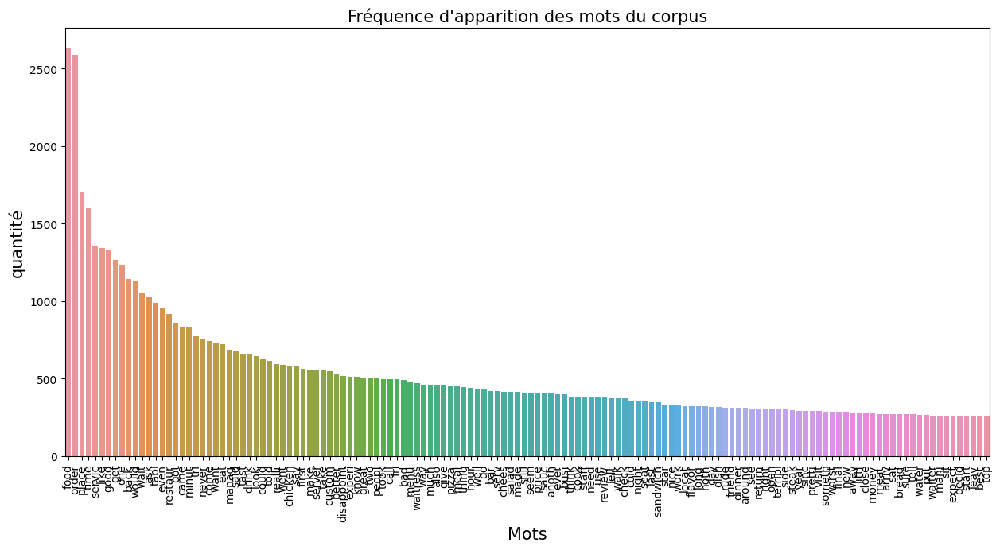

In [169]:
df_tmp2=tmp2.loc[tmp2['qte']>=254]
plt.figure(figsize=(15,7)) #taille de la fenetre pour le barplot
plt.xticks(rotation=90)#Rotation de 90°de l'axe des abscisses
sns.barplot(data=df_tmp2, x='mots', y='qte')#Création du barplot
plt.title("Fréquence d'apparition des mots du corpus",fontsize=15)
plt.ylabel("quantité", fontsize=15) #Titre de l'axe des ordonnées en taille 10
plt.xlabel("Mots", fontsize=15) #Titre de l'axe des abscisses en taille 10

Text(0.5, 0, 'Mots')

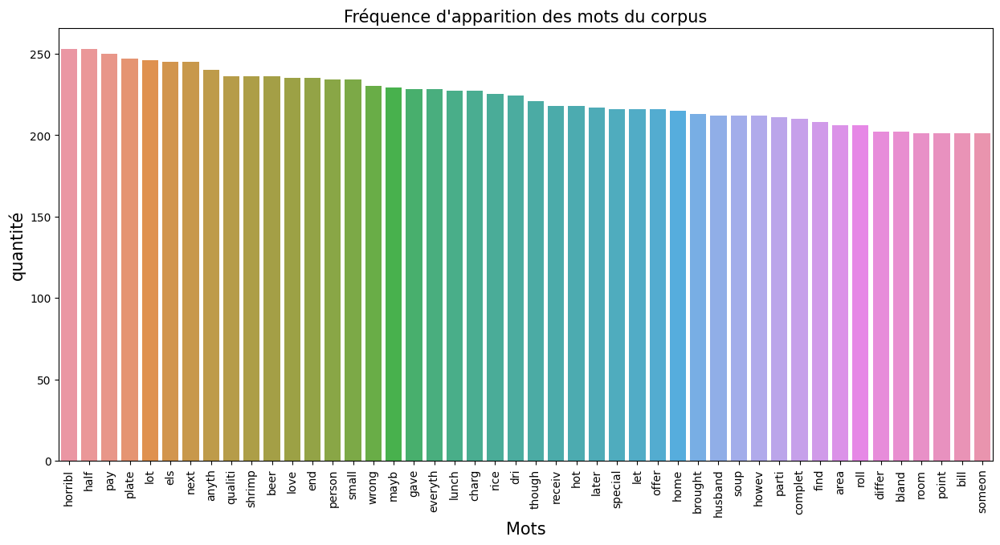

In [170]:
df_tmp2=tmp2.loc[tmp2['qte']<254]
df_tmp2=df_tmp2.loc[tmp2['qte']>200]
plt.figure(figsize=(15,7)) #taille de la fenetre pour le barplot
plt.xticks(rotation=90)#Rotation de 90°de l'axe des abscisses
sns.barplot(data=df_tmp2, x='mots', y='qte')#Création du barplot
plt.title("Fréquence d'apparition des mots du corpus",fontsize=15)
plt.ylabel("quantité", fontsize=15) #Titre de l'axe des ordonnées en taille 10
plt.xlabel("Mots", fontsize=15) #Titre de l'axe des abscisses en taille 10

In [171]:
# distribution des tokens
tmp.describe()


count    4196.000000
mean       38.757388
std       120.734377
min         2.000000
25%         3.000000
50%         7.000000
75%        23.000000
max      2632.000000
dtype: float64

<Axes: >

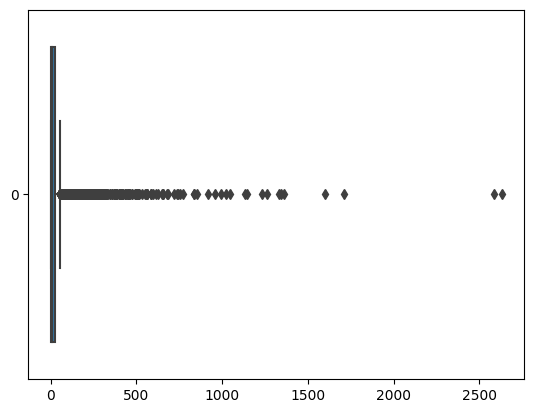

In [172]:
sns.boxplot(tmp, orient="h")

In [173]:
# nombre de fois que sont présent les différents tokens dans le corpus

tmp=pd.Series(corpus).value_counts(normalize=True)
tmp.head(30)

food       0.016184
order      0.015902
place      0.010503
time       0.009826
servic     0.008357
like       0.008252
good       0.008197
get        0.007772
one        0.007582
back       0.007035
would      0.006961
wait       0.006444
ask        0.006303
tabl       0.006094
even       0.005879
restaur    0.005626
got        0.005257
came       0.005134
minut      0.005128
tri        0.004741
never      0.004630
come       0.004581
want       0.004513
eat        0.004440
manag      0.004212
said       0.004188
tast       0.004028
drink      0.004021
look       0.003978
could      0.003849
dtype: float64

In [174]:
tmp2=pd.DataFrame(tmp)
tmp2.reset_index(inplace=True)
tmp2.columns = ['mots','%']
tmp2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4196 entries, 0 to 4195
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   mots    4196 non-null   object 
 1   %       4196 non-null   float64
dtypes: float64(1), object(1)
memory usage: 65.7+ KB


Text(0.5, 0, 'Mots')

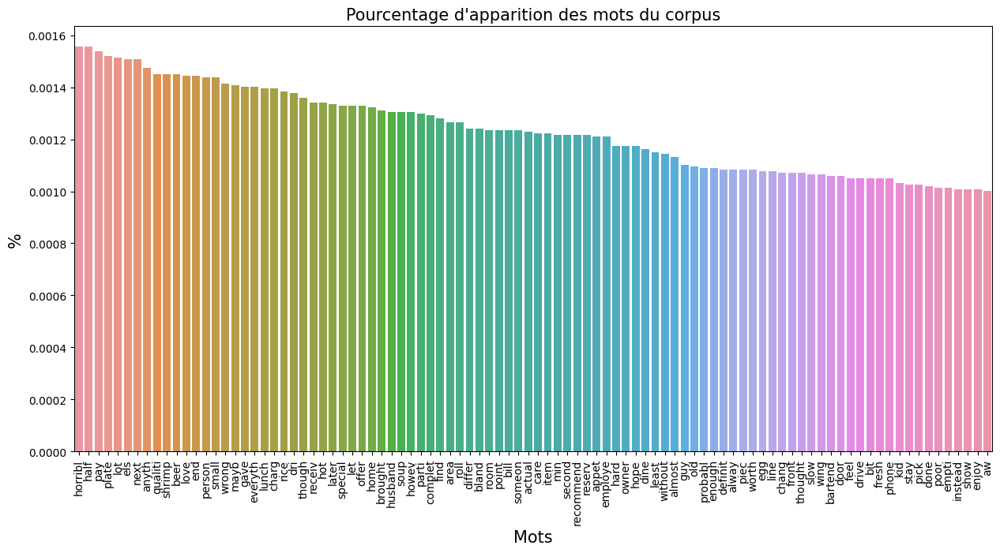

In [175]:
df_tmp2=tmp2.loc[tmp2['%']<0.00156]
df_tmp2=df_tmp2.loc[tmp2['%']>0.001]
plt.figure(figsize=(15,7)) #taille de la fenetre pour le barplot
plt.xticks(rotation=90)#Rotation de 90°de l'axe des abscisses
sns.barplot(data=df_tmp2, x='mots', y='%')#Création du barplot
plt.title("Pourcentage d'apparition des mots du corpus",fontsize=15)
plt.ylabel("%", fontsize=15) #Titre de l'axe des ordonnées en taille 10
plt.xlabel("Mots", fontsize=15) #Titre de l'axe des abscisses en taille 10

In [176]:
list_rare_words[:30]

['restraunt',
 'gravied',
 'mainliners',
 'effing',
 'tidbits',
 'unadulterated',
 'honorable',
 'compatriot',
 'charity',
 'patronized',
 'hats',
 'murfressboro',
 'artisanal',
 'goose',
 'sly',
 'initiated',
 'bam',
 'brucheta',
 'multigrain',
 'jacki',
 'closeness',
 'coasters',
 'branches',
 'energizing',
 'temperate',
 '5am',
 'slicked',
 'medley',
 'strangle',
 'aversion']

### <a name="C522"> 5.2.2 WordCloud</a> 

C:\Users\Utilisateur\anaconda3\envs\projet6\lib\site-packages\wordcloud\wordcloud.py:106: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  self.colormap = plt.cm.get_cmap(colormap)
C:\Users\Utilisateur\anaconda3\envs\projet6\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\Utilisateur\anaconda3\envs\projet6\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\Utilisateur\anaconda3\envs\projet6\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarnin

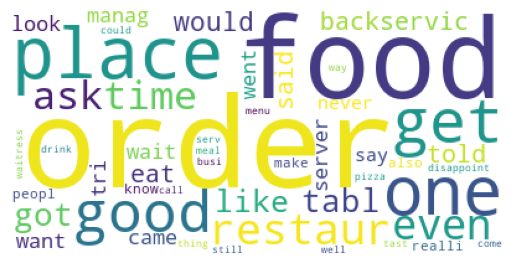

In [177]:
wordcloud= WordCloud(background_color='white',
                     stopwords=[],
                     max_words=50).generate(" ".join(corpus))
                     
plt.imshow(wordcloud)
plt.axis("off")
plt.show();

#### Suppression des mots trop récurrents :

In [178]:
# Création d'une liste de stopwords pour Suppresion de mots les plus représentés (pour le test)
df_tmp=pd.DataFrame(tmp)
df_tmp['index'] = df_tmp.index
df_tmp.reset_index(drop=True, inplace=True)
df_tmp.columns = ['qte','mot']

df_tmp.head()

,qte,mot
0,0.016184,food
1,0.015902,order
2,0.010503,place
3,0.009826,time
4,0.008357,servic


C:\Users\Utilisateur\anaconda3\envs\projet6\lib\site-packages\wordcloud\wordcloud.py:106: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  self.colormap = plt.cm.get_cmap(colormap)
C:\Users\Utilisateur\anaconda3\envs\projet6\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\Utilisateur\anaconda3\envs\projet6\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\Utilisateur\anaconda3\envs\projet6\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarnin

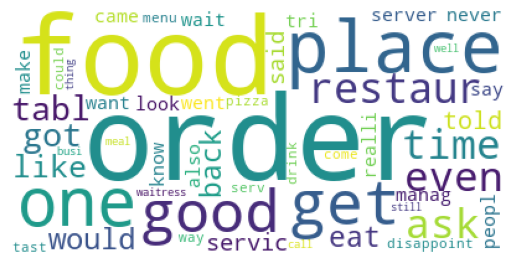

In [179]:
# Création de la liste de mots à retirer en fonction de leur nombre dans le corpus
df_stopmots=df_tmp.loc[df_tmp["qte"]>=254] 
list_stopmots=df_stopmots['mot'].tolist()

wordcloud= WordCloud(background_color='white',
                     stopwords=list_stopmots,
                     max_words=50).generate(" ".join(corpus))
                     
plt.imshow(wordcloud)
plt.axis("off")
plt.show();

In [180]:
# Morceau de code pour trouver quelques mots
a=df_tmp.loc[df_tmp['mot']=="horribl"]
a.head()

,qte,mot
138,0.001556,horribl


## <a name="C53">5.3 Traitement 2 : Latent Dirichlet Allocation (LDA)</a> 

### <a name="C531">5.3.1 Traitement des documents "bruts"</a> 

In [181]:
df_final_ech.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3000 entries, 0 to 2999
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   name     3000 non-null   object
 1   rating   3000 non-null   int64 
 2   comment  3000 non-null   object
dtypes: int64(1), object(2)
memory usage: 70.4+ KB


In [182]:
# Affichage des histogrammes des topics
def plot_top_words_lda(model, feature_names, n_top_words, title):
    fig, axes = plt.subplots(4, 5, figsize=(30, 15), sharex=True)
    axes = axes.flatten()
    for topic_idx, topic in enumerate(model.components_):
        top_features_ind = topic.argsort()[: -n_top_words - 1 : -1]
        top_features = [feature_names[i] for i in top_features_ind]
        weights = topic[top_features_ind]
        
        #print(top_features, weights)

        ax = axes[topic_idx]
        ax.barh(top_features, weights, height=0.7)
        ax.set_title(f"Topic {topic_idx}", fontdict={"fontsize": 30})
        ax.invert_yaxis()
        ax.tick_params(axis="both", which="major", labelsize=20)
        for i in "top right left".split():
            ax.spines[i].set_visible(False)
        fig.suptitle(title, fontsize=40)

    plt.subplots_adjust(top=0.90, bottom=0.05, wspace=0.90, hspace=0.3)
    plt.show()

Topic 0:
rice maybe think ordered thing best point open sushi special
Topic 1:
won completely going menu used place better best small finally
Topic 2:
water wait hour told minutes went 15 seated place people
Topic 3:
pizza half place ordered order worth like hour better cheese
Topic 4:
food service wait good place staff people restaurant long time
Topic 5:
chicken food like just ordered tasted taste rice shrimp sauce
Topic 6:
food ve times service terrible order time worst ordered wrong
Topic 7:
order called location phone manager rude waiting minutes customers orders
Topic 8:
came try decided manager table definitely did rude person said
Topic 9:
server place food know just menu didn lunch husband table
Topic 10:
places place bar don better flavor care food poor away
Topic 11:
minutes table came food waitress took time order waited sat
Topic 12:
sandwich bread cheese soup hot good cold make eat home
Topic 13:
steak got like wasn didn just ordered went good way
Topic 14:
people make di

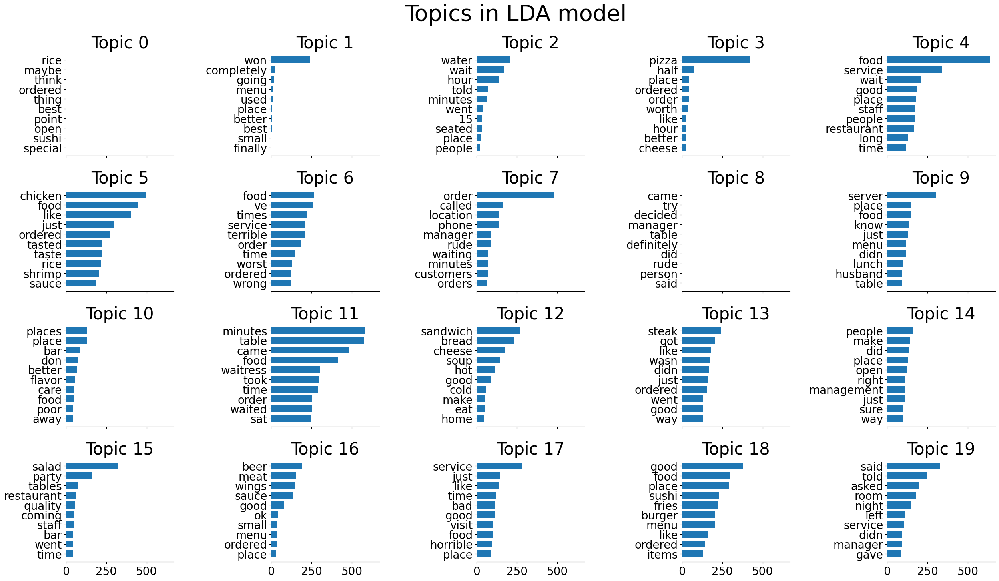

In [183]:
n_topics = 20 # Nombre de sujets (20 catégories)

#Calcul de la frequency
tf_vectorizer=CountVectorizer(max_df=0.95, min_df=2, max_features=200, stop_words='english') #200 mots gardés dans le vocabulaire
tf=tf_vectorizer.fit_transform(df_final_ech["comment"]) # comptage de la fréquence sur la liste de documents

# Créer le modèle LDA
lda = LatentDirichletAllocation(
        n_components=n_topics, 
        max_iter=5, 
        learning_method='online', 
        learning_offset=50.,
        random_state=0)

# Fitter sur les données
lda.fit(tf)


# Affichage des résultats
no_top_words = 10 #  10 mots les plus représentatifs de la catégories détectée
display_topics(lda, tf_vectorizer.get_feature_names_out(), no_top_words)
#features names sont les mots associés au comptage
plot_top_words_lda(lda, tf_vectorizer.get_feature_names_out(), no_top_words, "Topics in LDA model")

### <a name="C532">5.3.2 Traitement des documents "bruts" avec suppression des adverbes et des adjectifs</a>

In [184]:
n_topics = 20 # Nombre de sujets (20 catégories)

#Calcul de la frequency
tf_vectorizer=CountVectorizer(max_df=0.95, min_df=2, max_features=200, stop_words=list(stop_words)+adv_list+adj_list) #200 mots gardés dans le vocabulaire
tf=tf_vectorizer.fit_transform(df_final_ech["comment"]) # comptage de la fréquence sur la liste de documents

# Créer le modèle LDA
lda = LatentDirichletAllocation(
        n_components=n_topics, 
        max_iter=5, 
        learning_method='online', 
        learning_offset=50.,
        random_state=0)

# Fitter sur les données
lda.fit(tf)


# Affichage des résultats
no_top_words = 10 #  10 mots les plus représentatifs de la catégories détectée
display_topics(lda, tf_vectorizer.get_feature_names_out(), no_top_words)
#features names sont les mots associés au comptage

Topic 0:
minutes order get 20 waited 30 10 took 15 store
Topic 1:
table came waitress one asked minutes sat time told restaurant
Topic 2:
place go know went friend time one try service get
Topic 3:
waiter wine bill charge pay get card service appetizer night
Topic 4:
money waste time coming go make years taste pay everyone
Topic 5:
menu shrimp restaurant chips pork could flavor sauce beans taste
Topic 6:
service sauce ordered asked ice kids brought come gave came
Topic 7:
today employees times bring person someone tell one made management
Topic 8:
eat ordered taste beef one eating want star made give
Topic 9:
seemed working dining paid received one service made people guess
Topic 10:
sandwich see would nothing service going recommend needed thing know
Topic 11:
bar beer service time quality one return line prices dishes
Topic 12:
server quality place servers get plate know years got take
Topic 13:
fries burger location order times time get service want put
Topic 14:
would could place g

### <a name="C533">5.3.3 Traitement des documents traités (corpus)</a>

In [185]:
n_topics = 20 # Nombre de sujets (20 catégories)

#Calcul de la frequency
tf_vectorizer=CountVectorizer(max_df=0.95, min_df=2, max_features=200, stop_words='english') #200 mots gardés dans le vocabulaire
tf=tf_vectorizer.fit_transform(corpus) # comptage de la fréquence sur la liste de documents

# Créer le modèle LDA
lda = LatentDirichletAllocation(
        n_components=n_topics, 
        max_iter=5, 
        learning_method='online', 
        learning_offset=50.,
        random_state=0)



# Fitter sur les données
lda.fit(tf)


# Affichage des résultats
no_top_words = 10 #  10 mots les plus représentatifs de la catégories détectée
display_topics(lda, tf_vectorizer.get_feature_names_out(), no_top_words)
#features names sont les mots associés au comptage



Topic 0:
walk review long decid best recommend charg offer hope pick
Topic 1:
good locat sinc visit meat husband empti everi food told
Topic 2:
custom bad fri busi bread pretti pay everyth qualiti room
Topic 3:
look told say left start half actual point feel old
Topic 4:
order came manag tast anoth thing mani waitress love differ
Topic 5:
tri want took sauc staff away sit mayb dri alway
Topic 6:
servic way think waiter wrong receiv bit sauc coffe owner
Topic 7:
drink chicken know great check night rice beer home later
Topic 8:
time experi meal salad chees cook cold new steak area
Topic 9:
food tabl bar dish lunch cold actual owner chang right
Topic 10:
come server waitress serv arriv complet appet employe custom sinc
Topic 11:
went disappoint peopl need sat leav anyth small howev dine
Topic 12:
eat said menu seat flavor plate person min thought enjoy
Topic 13:
make price day terribl friend someth shrimp end care guy
Topic 14:
ask money expect special hot owner worth probabl door drive


In [186]:
''' Visualisation avec pyLDAvis'''

# Création du dictionnaire

dataset = [d.split() for d in corpus]
dictionary = Dictionary(dataset)

# Mise en forme du corpus
corpus_vis = [dictionary.doc2bow(doc) for doc in dataset]

lda = models.ldamodel.LdaModel(corpus=corpus_vis, id2word=dictionary, num_topics=20,passes=5,per_word_topics=True,iterations=5, random_state = 55)


# Visualisation

vis_data = gensimvis.prepare(lda, corpus_vis, dictionary)

pyLDAvis.display(vis_data)


C:\Users\Utilisateur\anaconda3\envs\projet6\lib\site-packages\pyLDAvis\_prepare.py:232: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  head(R).drop('saliency', 1)


## <a name="C54">5.4 Traitement 3 : Negative Matrix Factorisation (NMF)</a> 

### <a name="C541">5.4.1 Traitement des documents "bruts"</a> 

In [187]:
# Affichage des histogrammes des topics
def plot_top_words_nmf(model, feature_names, n_top_words, title):
    fig, axes = plt.subplots(4, 5, figsize=(30, 15), sharex=True)
    axes = axes.flatten()
    for topic_idx, topic in enumerate(model.components_):
        top_features_ind = topic.argsort()[: -n_top_words - 1 : -1]
        top_features = [feature_names[i] for i in top_features_ind]
        weights = topic[top_features_ind]

        ax = axes[topic_idx]
        ax.barh(top_features, weights, height=0.7)
        ax.set_title(f"Topic {topic_idx}", fontdict={"fontsize": 30})
        ax.invert_yaxis()
        ax.tick_params(axis="both", which="major", labelsize=20)
        for i in "top right left".split():
            ax.spines[i].set_visible(False)
        fig.suptitle(title, fontsize=40)

    plt.subplots_adjust(top=0.90, bottom=0.05, wspace=0.90, hspace=0.3)
    plt.show()

Topic 0:
just ok really say okay wasn better ll worth way
Topic 1:
minutes wait waited 30 20 hour 15 waiting 10 took
Topic 2:
pizza better cheese worth sauce new ordered hour great half
Topic 3:
food eat quality cold best nice bad great ok drinks
Topic 4:
ordered cheese meat sandwich sauce steak got cold shrimp taste
Topic 5:
order wrong phone called ordered come orders did got took
Topic 6:
service terrible customer slow horrible poor awful great bad rude
Topic 7:
chicken fried rice dry bland wings tasted sauce cooked ok
Topic 8:
place try great better money lot people nice new open
Topic 9:
ve times location worst better staff years experience tried coming
Topic 10:
restaurant staff nice did area menu say dinner eat meal
Topic 11:
like don know people really tasted taste think look looked
Topic 12:
good really bad pretty bread thing sauce small reviews maybe
Topic 13:
burger fries cheese cold want server bad cooked worth money
Topic 14:
time second went money really visit horrible su

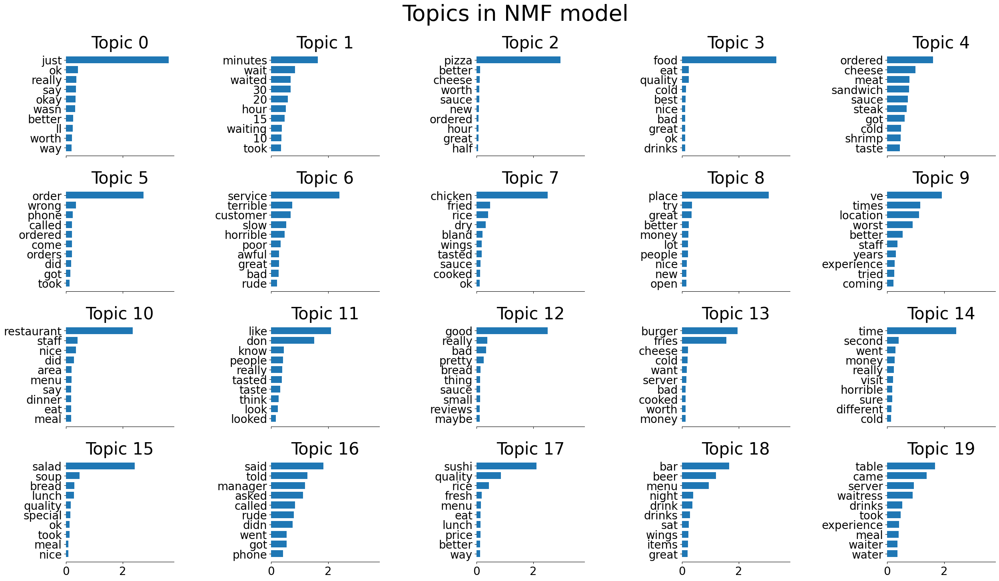

In [188]:
# NMF peut utiliser tf-idf
tfidf_vectorizer = TfidfVectorizer(max_df=0.95, 
    min_df=2, 
    max_features=200, 
    stop_words='english')
tfidf = tfidf_vectorizer.fit_transform(df_final_ech["comment"])
tfidf_feature_names = tfidf_vectorizer.get_feature_names_out()

no_topics = 20

# Run NMF
nmf = NMF(n_components=no_topics, random_state=1, l1_ratio=.5, init='nndsvd')
nmf.fit(tfidf)

no_top_words = 10
display_topics(nmf, tfidf_feature_names, no_top_words)
plot_top_words_nmf(nmf, tfidf_feature_names, no_top_words, "Topics in NMF model")

### <a name="C542">5.4.2 Traitement des documents "bruts" avec suppression des adverbes et des adjectifs</a>

In [189]:


# NMF peut utiliser tf-idf
tfidf_vectorizer = TfidfVectorizer(max_df=0.95, 
    min_df=2, 
    max_features=200, 
    stop_words=list(stop_words)+adv_list+adj_list)
tfidf = tfidf_vectorizer.fit_transform(df_final_ech["comment"])
tfidf_feature_names = tfidf_vectorizer.get_feature_names_out()

no_topics = 20

# Run NMF
nmf = NMF(n_components=no_topics, random_state=1, l1_ratio=.5, init='nndsvd')
nmf.fit(tfidf)

no_top_words = 10
display_topics(nmf, tfidf_feature_names, no_top_words)


Topic 0:
would give could recommend make stars try made think told
Topic 1:
ordered sauce taste flavor shrimp beef chips meal served price
Topic 2:
place try lot know nothing recommend people reviews say money
Topic 3:
order called delivery phone call take customer going orders told
Topic 4:
service customer management people care employees need customers drinks business
Topic 5:
chicken wings flavor beef sauce one looked thing meal beans
Topic 6:
table came server waitress asked one manager meal told drinks
Topic 7:
burger fries server wings money want taste price menu went
Topic 8:
time times waste money went tried visit years one getting
Topic 9:
restaurant area say nothing tables lot dining menu dinner try
Topic 10:
get took people say see tell drink want trying ask
Topic 11:
minutes waited 30 20 hour 15 10 waiting took told
Topic 12:
got went taste husband know thing beans asked think friend
Topic 13:
sandwich one made lunch try say thing going make pork
Topic 14:
bar menu beer ba

### <a name="C543">5.4.3 Traitement des documents traités (corpus)</a>

In [190]:
# NMF peut utiliser tf-idf
tfidf_vectorizer = TfidfVectorizer(max_df=0.95, 
    min_df=2, 
    max_features=200, 
    stop_words='english')
tfidf = tfidf_vectorizer.fit_transform(corpus)
tfidf_feature_names = tfidf_vectorizer.get_feature_names_out()

no_topics = 20

# Run NMF
nmf = NMF(n_components=no_topics, random_state=1, l1_ratio=.5, init='nndsvd')
nmf.fit(tfidf)

no_top_words = 10
display_topics(nmf, tfidf_feature_names, no_top_words)


Topic 0:
food drink look realli told went chicken say custom better
Topic 1:
order look told custom server know great experi bad fri
Topic 2:
place realli say went make better disappoint experi peopl great
Topic 3:
time custom better know fri great waitress hour bar thing
Topic 4:
servic drink told realli went say server better great waitress
Topic 5:
like drink realli make disappoint experi know peopl fri waitress
Topic 6:
good drink tast went make disappoint peopl fri waitress pizza
Topic 7:
wait look say went server better took disappoint way pizza
Topic 8:
ask drink look told make custom server great took menu
Topic 9:
tabl look drink went say server custom great took peopl
Topic 10:
restaur drink look say make custom disappoint peopl took know
Topic 11:
got look told experi took bad hour need use cook
Topic 12:
came drink need cook cold noth start worth guy fresh
Topic 13:
minut told chicken make custom server better great know fri
Topic 14:
tri look say went know took disappoint 

## <a name="C55">5.5 Conclusion</a> 

Voir notebook de présentation : <a href="Renard_Anthony_3_page_web_022023.ipynb#C55"> Renard_Anthony_3_page_web_022023.ipynb <a>

# <a name="C6">6. Traitement des images</a> 

In [191]:
df_images.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200098 entries, 0 to 200097
Data columns (total 2 columns):
 #   Column    Non-Null Count   Dtype 
---  ------    --------------   ----- 
 0   photo_id  200098 non-null  object
 1   label     200098 non-null  object
dtypes: object(2)
memory usage: 3.1+ MB


In [192]:
df_images.head()

,photo_id,label
0,--0h6FMC0V8aMtKQylojEg,inside
1,--3JQ4MlO-jHT9xbo7liug,food
2,--3P3fjPrScy06XVLi4vhg,inside
3,--4DfhW2sJvjeC90KEDX3g,inside
4,--5V3mRlhb3zqE5yF4Gpaw,inside


In [193]:
len(list_images)

200098

## <a name="C61"> 6.1 Sélection d'un échantillon </a> 

On va selection 200 images par catégories soit 5 x 200 = 1000 images

In [194]:
list_labels

['inside', 'food', 'outside', 'drink', 'menu']

In [195]:
df_inside=df_images.loc[df_images["label"]=="inside"]
df_inside=df_inside.sample(200, random_state=55)
df_inside.info()

df_food=df_images.loc[df_images["label"]=="food"]
df_food=df_food.sample(200, random_state=55)
df_food.info()

df_outside=df_images.loc[df_images["label"]=="outside"]
df_outside=df_outside.sample(200, random_state=55)
df_outside.info()

df_drink=df_images.loc[df_images["label"]=="drink"]
df_drink=df_drink.sample(200, random_state=55)
df_drink.info()

df_menu=df_images.loc[df_images["label"]=="menu"]
df_menu=df_menu.sample(200, random_state=55)
df_menu.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 200 entries, 10541 to 175154
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   photo_id  200 non-null    object
 1   label     200 non-null    object
dtypes: object(2)
memory usage: 4.7+ KB
<class 'pandas.core.frame.DataFrame'>
Int64Index: 200 entries, 137034 to 190576
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   photo_id  200 non-null    object
 1   label     200 non-null    object
dtypes: object(2)
memory usage: 4.7+ KB
<class 'pandas.core.frame.DataFrame'>
Int64Index: 200 entries, 174318 to 19473
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   photo_id  200 non-null    object
 1   label     200 non-null    object
dtypes: object(2)
memory usage: 4.7+ KB
<class 'pandas.core.frame.DataFrame'>
Int64Index: 200 entries, 65276 to 136600
Data column

In [196]:
# Rassemblement des 5 dataframes
df_images_ech=pd.concat([df_inside, df_food, df_outside, df_drink, df_menu], ignore_index=True)
df_images_ech.head()

,photo_id,label
0,2LYyVGMIEXtaxnGBgITkHA,inside
1,7i4idfMi-zWgKn6qNTzUNw,inside
2,Oeuu9tHpDM0yIayUTjhZLA,inside
3,34YEnMZQkUb8khdoS2VKbQ,inside
4,SGu6o79AOM3Y_QjqCERUZQ,inside


In [197]:
df_images_ech.head()

,photo_id,label
0,2LYyVGMIEXtaxnGBgITkHA,inside
1,7i4idfMi-zWgKn6qNTzUNw,inside
2,Oeuu9tHpDM0yIayUTjhZLA,inside
3,34YEnMZQkUb8khdoS2VKbQ,inside
4,SGu6o79AOM3Y_QjqCERUZQ,inside


In [198]:
df_images_ech.label.value_counts()

inside     200
food       200
outside    200
drink      200
menu       200
Name: label, dtype: int64

In [199]:
df_images_ech.label.value_counts(normalize=True)

inside     0.2
food       0.2
outside    0.2
drink      0.2
menu       0.2
Name: label, dtype: float64

<Axes: ylabel='label'>

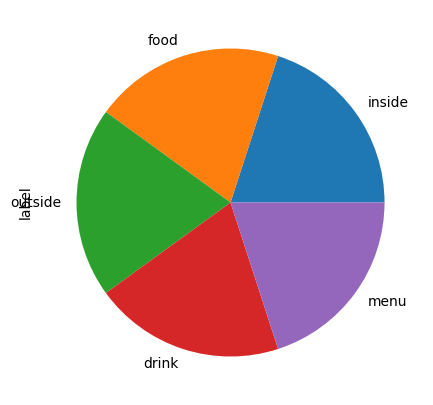

In [200]:
df_images_ech.label.value_counts().plot(kind="pie",figsize =(7, 5))

In [201]:
# Créationd'un nouvelle colonne (features engineering
df_images_ech["photo"]=df_images_ech["photo_id"]+".jpg"
df_images_ech.head()


,photo_id,label,photo
0,2LYyVGMIEXtaxnGBgITkHA,inside,2LYyVGMIEXtaxnGBgITkHA.jpg
1,7i4idfMi-zWgKn6qNTzUNw,inside,7i4idfMi-zWgKn6qNTzUNw.jpg
2,Oeuu9tHpDM0yIayUTjhZLA,inside,Oeuu9tHpDM0yIayUTjhZLA.jpg
3,34YEnMZQkUb8khdoS2VKbQ,inside,34YEnMZQkUb8khdoS2VKbQ.jpg
4,SGu6o79AOM3Y_QjqCERUZQ,inside,SGu6o79AOM3Y_QjqCERUZQ.jpg


In [202]:
# Création de liste_images echantillonnée associée à cette nouvelle colonne
list_images_ech=df_images_ech["photo"].tolist()
list_images_ech[:5]

['2LYyVGMIEXtaxnGBgITkHA.jpg',
 '7i4idfMi-zWgKn6qNTzUNw.jpg',
 'Oeuu9tHpDM0yIayUTjhZLA.jpg',
 '34YEnMZQkUb8khdoS2VKbQ.jpg',
 'SGu6o79AOM3Y_QjqCERUZQ.jpg']

## <a name="C62"> 6.2 Scale Invariant Feature Transform (SIFT) </a> 

### <a name="C621"> 6.2.1 Quelques testes de transformations d'images</a> 

#### <a name="C6211"> 6.2.1.1 Chargement d'une image en couleurs et niveau de gris</a> 

In [203]:
# Charger l'image en couleurs (information prise dans analyse multivariée)
image_color = Image.open(filename) 

# Conversion en noir et blanc
image_gris = image_color.convert('L')

# Afficher l'image
image_gris.show()
image_color.show()


In [204]:
# Récupérer et afficher la taille de l'image (en pixels)
w, h = image_color.size
print("Largeur : {} px, hauteur : {} px".format(w, h))

# Récupérer les valeurs de tous les pixels sous forme d'une matrice
mat_col = np.array(image_color)
print(mat_col)

# Afficher la taille de la matrice de pixels
print("Taille de la matrice de pixels : {}".format(mat_col.shape))



Largeur : 600 px, hauteur : 388 px
[[[184 144 136]
  [ 55  15   7]
  [ 76  32  23]
  ...
  [194 193 189]
  [192 191 187]
  [190 189 185]]

 [[183 143 135]
  [ 55  15   7]
  [ 75  32  23]
  ...
  [193 192 188]
  [192 191 187]
  [190 189 185]]

 [[183 143 135]
  [ 55  15   7]
  [ 75  32  23]
  ...
  [193 192 188]
  [192 191 187]
  [191 190 186]]

 ...

 [[138 140 139]
  [  0   2   1]
  [  9  11  10]
  ...
  [111  91  92]
  [109  89  90]
  [108  88  89]]

 [[138 140 139]
  [  0   2   1]
  [ 10  12  11]
  ...
  [107  87  88]
  [105  85  86]
  [104  84  85]]

 [[138 140 139]
  [  0   2   1]
  [ 10  12  11]
  ...
  [101  81  82]
  [ 99  79  80]
  [ 98  78  79]]]
Taille de la matrice de pixels : (388, 600, 3)


In [205]:
# Récupérer et afficher la taille de l'image (en pixels)
w, h = image_gris.size
print("Largeur : {} px, hauteur : {} px".format(w, h))

# Récupérer les valeurs de tous les pixels sous forme d'une matrice
mat_gris = np.array(image_gris)
print(mat_gris)

# Afficher la taille de la matrice de pixels
print("Taille de la matrice de pixels : {}".format(mat_gris.shape))



Largeur : 600 px, hauteur : 388 px
[[155  26  44 ... 193 191 189]
 [154  26  44 ... 192 191 189]
 [154  26  44 ... 192 191 190]
 ...
 [139   1  10 ...  97  95  94]
 [139   1  11 ...  93  91  90]
 [139   1  11 ...  87  85  84]]
Taille de la matrice de pixels : (388, 600)


#### <a name="C6212"> 6.2.1.2 Affichage des histogrammes</a> 

##### <a name="C62121"> 6.2.1.2.1 Image couleur</a> 

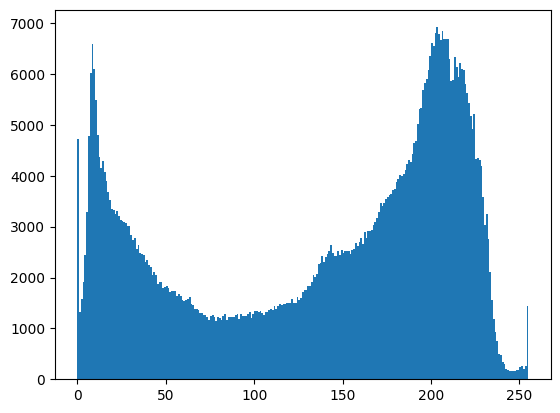

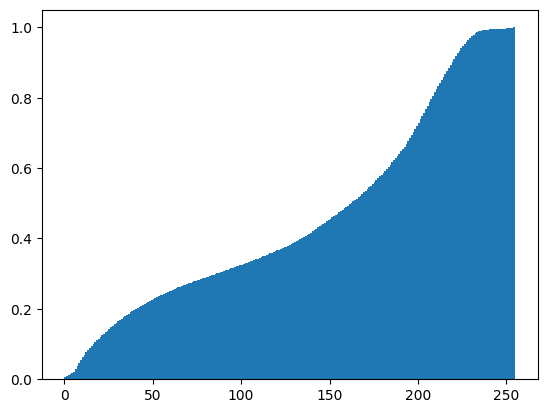

In [206]:


# Charger l'image comme matrice de pixels
img_col = np.array(image_color)

# Générer et afficher l'histogramme
# Pour le normaliser : argument density=True dans plt.hist
# Pour avoir l'histogramme cumulé : argument cumulative=True
n, bins, patches = plt.hist(img_col.flatten(), bins=range(256))
plt.show()
n, bins, patches = plt.hist(img_col.flatten(),density = True, cumulative=True, bins=range(256))
plt.show()

##### <a name="C62121"> 6.2.1.2.1 Image grise</a> 

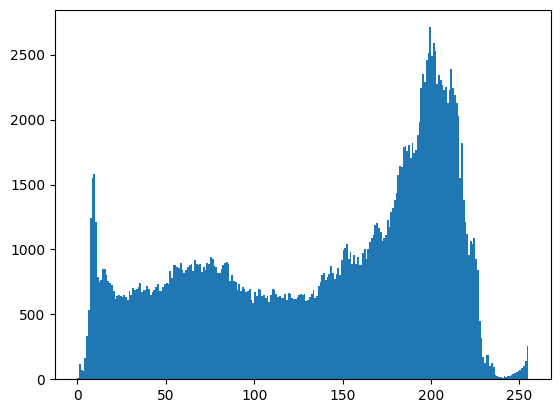

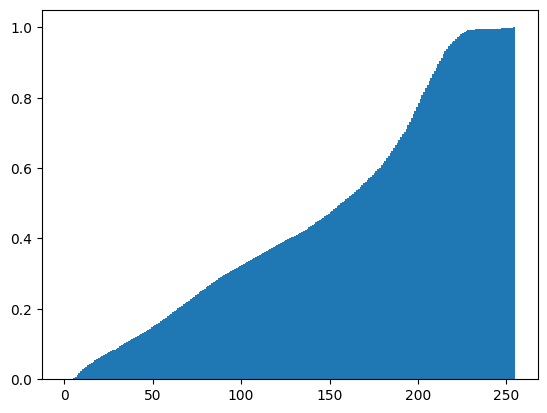

In [207]:
# Charger l'image comme matrice de pixels
img_gris = np.array(image_gris)


# Générer et afficher l'histogramme
# Pour le normaliser : argument density=True dans plt.hist
# Pour avoir l'histogramme cumulé : argument cumulative=True
n, bins, patches = plt.hist(img_gris.flatten(), bins=range(256))
plt.show()
n, bins, patches = plt.hist(img_gris.flatten(),density = True, cumulative=True, bins=range(256))

#### <a name="C6213"> 6.2.1.3 Egalisation des histogrammes</a> 

##### <a name="C62132"> 6.2.1.3.1 Image couleur</a> 

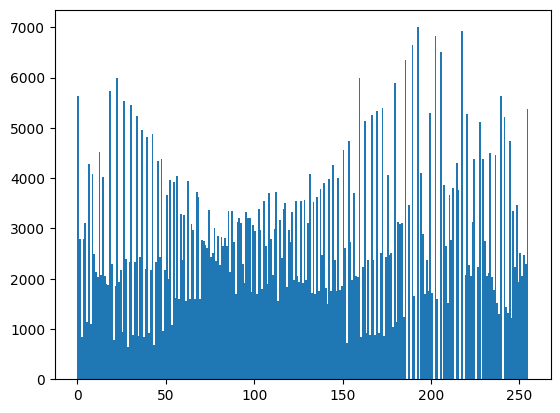

In [208]:
# égalisation nde l'histogramme

image_color_eq = ImageOps.equalize(image_color, mask = None)
image_color_eq_ = np.array(image_color_eq)

n, bins, patches = plt.hist(image_color_eq_.flatten(), bins=range(256))


image_color_eq.show()

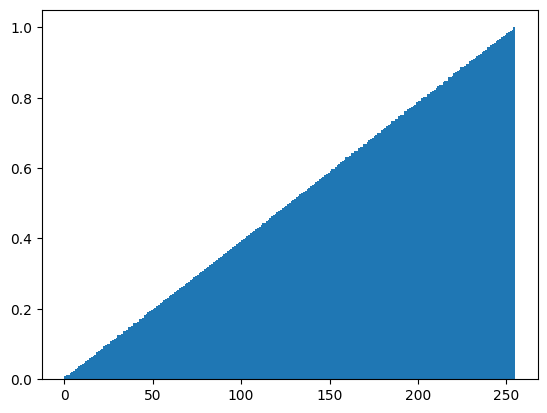

In [209]:
# Affichage de l'histogramme cumulée normalisé après égalisation
n, bins, patches = plt.hist(image_color_eq_.flatten(),density = True, cumulative=True, bins=range(256))

##### <a name="C62132"> 6.2.1.3.2 Image grise</a> 

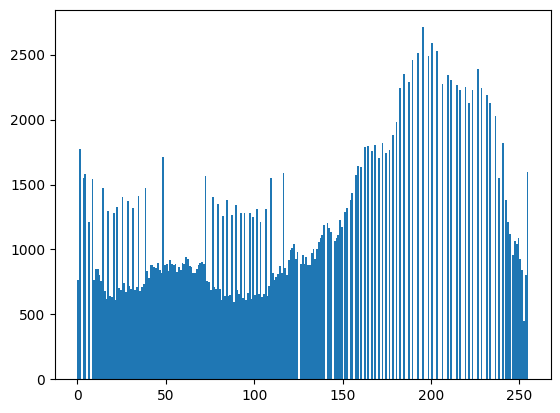

In [210]:
# égalisation nde l'histogramme

image_gris_eq = ImageOps.equalize(image_gris, mask = None)
image_gris_eq_ = np.array(image_gris_eq)

n, bins, patches = plt.hist(image_gris_eq_.flatten(), bins=range(256))


image_gris_eq.show()



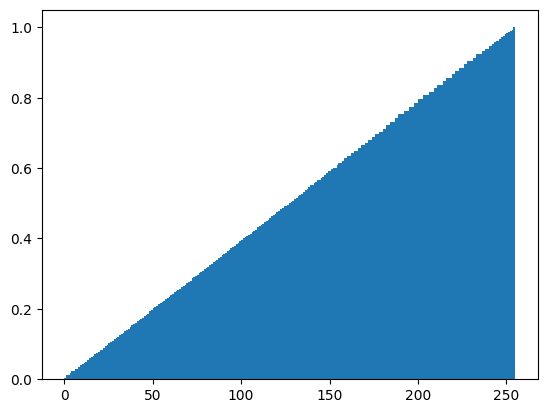

In [211]:
# Affichage de l'histogramme cumulée normalisé après égalisation
n, bins, patches = plt.hist(image_gris_eq_.flatten(),density = True, cumulative=True, bins=range(256))


#### <a name="C6214"> 6.2.1.4 Suppression du bruit</a> 

In [212]:
# Sur image grise

In [213]:
# Charger l'image sous forme d'une matrice de pixels = img_gris (déjà chargé ci-dessous)
#img = np.array(Image.open(img_gris))

# Générer le bruit gaussien de moyenne nulle et d'écart-type 7 (variance 49)
noise = np.random.normal(0, 7, img_gris.shape)

# Créer l'image bruitée et l'afficher
noisy_img = Image.fromarray(img_gris + noise).convert('L')
noisy_img.show()

In [214]:
# Appliquer le lissage par moyennage (fenêtre de taille 9) et afficher le résultat
noisy_img.filter(ImageFilter.BoxBlur(1)).show()

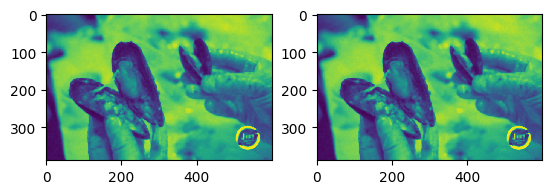

In [215]:
med=median(noisy_img, disk(3), mode='constant', cval=0.0) # Application d'un filtre médian 
fig,ax = plt.subplots(1, 2)
ax = ax.flatten()
for a in ax:
    a.imshow(med, interpolation='none')
plt.show()

### <a name="C622"> 6.2.2 Détermination et affichage des descripteurs</a> 

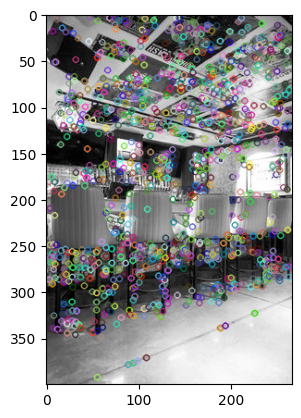

Descripteurs :  (1106, 128)

[[119.  39.   7. ...   0.   0.   0.]
 [ 61.  23.  32. ...   0.   0.   0.]
 [ 94.   2.   0. ...   0.   7.   2.]
 ...
 [  1.  11.  12. ...   0.   1.  20.]
 [  1.   0.   0. ...   0.   3.   6.]
 [ 82. 115.  68. ...   0.   0.   0.]]


In [216]:
from skimage.filters import median
from skimage.morphology import disk

#sift = cv2.xfeatures2d.SIFT_create()
sift = cv2.SIFT_create()
image = cv2.imread(path+list_images_ech[1],0) # conversion en gris
image = cv2.equalizeHist(image)   # egalisation de l'histogramme de l'image
#image=median(image, disk(3), mode='constant', cval=0.0) # Application d'un filtre médian : optionnel
#image=cv2.medianBlur(image, 3)

kp, des = sift.detectAndCompute(image, None)
img=cv2.drawKeypoints(image,kp,image)
plt.imshow(img)
plt.show()
print("Descripteurs : ", des.shape)
print()
print(des)

* L'image contient 1106 descripteurs
* Chaque descripteur est un vecteur de longueur 128

### <a name="C623"> 6.2.3 Traitement des images </a> 

#### <a name="C6231"> 6.2.3.1 Créations des descripteurs de chaque image </a> 

* Pour chaque image passage en gris et equalisation
* création d'une liste de descripteurs par image ("sift_keypoints_by_img") qui sera utilisée pour réaliser les histogrammes par image
* création d'une liste de descripteurs pour l'ensemble des images ("sift_keypoints_all") qui sera utilisé pour créer les clusters de descripteurs

In [217]:
# identification des point clés et les descripteurs associés 

sift_keypoints = []
temps1=time.time()
sift = cv2.SIFT_create()

for image_num in range(len(list_images_ech)) :
    if image_num%100 == 0 : print(image_num)
    image = cv2.imread(path+list_images_ech[image_num],0) # conversion en gris
    #image=median(image, disk(3), mode='constant', cval=0.0) # Application d'un filtre médian avant égalisation : suppression du filtre pour notre analyse car il donne un moins bon résultat de classification
    res = cv2.equalizeHist(image)   # egalisation de l'histogramme de l'image
    #res=median(res, disk(3), mode='constant', cval=0.0) # Application d'un filtre médian : suppression du filtre pour notre analyse car il donne un moins bon résultat de classification
    kp, des = sift.detectAndCompute(res, None)
    sift_keypoints.append(des)

#sift_keypoints_by_img = np.asarray(sift_keypoints)
sift_keypoints_by_img = sift_keypoints
sift_keypoints_all    = np.concatenate(sift_keypoints_by_img, axis=0)

print()
print("Nombre de descripteurs : ", sift_keypoints_all.shape)

duration1=time.time()-temps1
print("temps de traitement SIFT descriptor : ", "%15.2f" % duration1, "secondes")

0
100
200
300
400
500
600
700
800
900

Nombre de descripteurs :  (1386563, 128)
temps de traitement SIFT descriptor :            62.79 secondes


#### <a name="C6232"> 6.2.3.2  Création des clusters de descripteurs </a> 

In [218]:
# Determination number of clusters
temps1=time.time()

k = int(round(np.sqrt(len(sift_keypoints_all)),0))
print("Nombre de clusters estimés : ", k)
print("Création de",k, "clusters de descripteurs ...")

# Clustering
kmeans = cluster.MiniBatchKMeans(n_clusters=k, init_size=3*k, random_state=0)
kmeans.fit(sift_keypoints_all)

duration1=time.time()-temps1
print("temps de traitement kmeans : ", "%15.2f" % duration1, "secondes")

Nombre de clusters estimés :  1178
Création de 1178 clusters de descripteurs ...


C:\Users\Utilisateur\anaconda3\envs\projet6\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


temps de traitement kmeans :            41.74 secondes


#### <a name="C6233"> 6.2.3.3 Création des histogrammes/features des images </a> 

* Pour chaque image : 
   - prédiction des numéros de cluster de chaque descripteur
   - création d'un histogramme = comptage pour chaque numéro de cluster du nombre de descripteurs de l'image

Features d'une image = Histogramme d'une image = Comptage pour une image du nombre de descripteurs par cluster

In [219]:
# Creation of histograms (features)
temps1=time.time()

def build_histogram(kmeans, des, image_num):
    res = kmeans.predict(des)
    hist = np.zeros(len(kmeans.cluster_centers_))
    nb_des=len(des)
    if nb_des==0 : print("problème histogramme image  : ", image_num)
    for i in res:
        hist[i] += 1.0/nb_des
    return hist


# Creation of a matrix of histograms
hist_vectors=[]

for i, image_desc in enumerate(sift_keypoints_by_img) :
    if i%100 == 0 : print(i)  
    hist = build_histogram(kmeans, image_desc, i) #calculates the histogram
    hist_vectors.append(hist) #histogram is the feature vector

im_features = np.asarray(hist_vectors)

duration1=time.time()-temps1
print("temps de création histogrammes : ", "%15.2f" % duration1, "secondes")


0
100
200
300
400
500
600
700
800
900
temps de création histogrammes :             7.27 secondes


#### <a name="C6234"> 6.2.3.4  Réductions de dimension </a> 

* La réduction PCA permet de créer des features décorrélées entre elles, et de diminuer leur dimension, tout en gardant un niveau de variance expliquée élevé (99%)
* L'impact est une meilleure séparation des données via le T-SNE et une réduction du temps de traitement du T-SNE

##### <a name="C62341"> 6.2.3.4.1  PCA </a> 

In [220]:
print("Dimensions dataset avant réduction PCA : ", im_features.shape)
pca = decomposition.PCA(n_components=0.99)
feat_pca= pca.fit_transform(im_features)
print("Dimensions dataset après réduction PCA : ", feat_pca.shape)

Dimensions dataset avant réduction PCA :  (1000, 1178)
Dimensions dataset après réduction PCA :  (1000, 698)


##### <a name="C62342"> 6.2.3.4.2  T-SNE </a> 

* Réduction de dimension en 2 composantes T-SNE pour affichage en 2D des images

In [221]:
tsne = manifold.TSNE(n_components=2, perplexity=30, 
                     n_iter=2000, init='random', random_state=6)
X_tsne = tsne.fit_transform(feat_pca)

df_tsne = pd.DataFrame(X_tsne[:,0:2], columns=['tsne1', 'tsne2'])
df_tsne["class"] = df_images_ech["label"]
print(df_tsne.shape)


(1000, 3)


In [222]:
df_tsne.head()

,tsne1,tsne2,class
0,0.165760,-3.333378,inside
1,-6.797833,-2.030740,inside
2,-4.963530,-3.071267,inside
3,-0.815102,0.274140,inside
4,3.161419,-1.302067,inside


#### <a name="C6235"> 6.2.3.5  Analyse visuelle : Affichage T-SNE selon catégories d'images </a> 

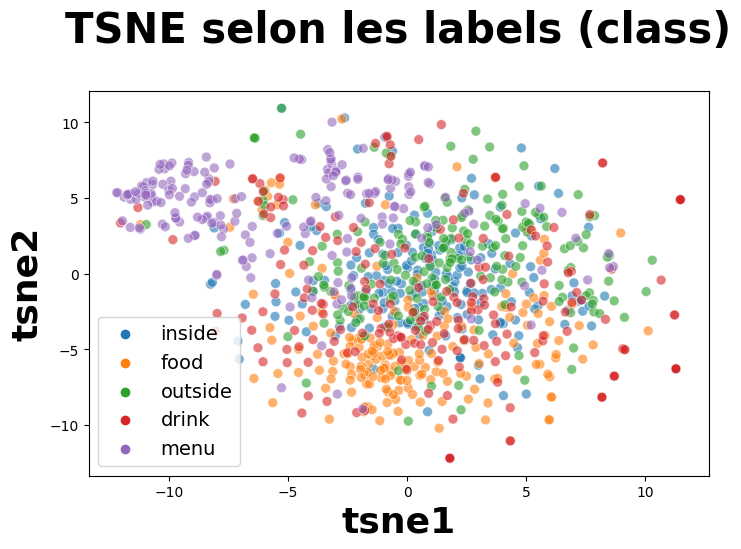

In [223]:
plt.figure(figsize=(8,5))
sns.scatterplot(
    x="tsne1", y="tsne2", hue="class", data=df_tsne, legend="brief",
    palette=sns.color_palette('tab10', n_colors=5), s=50, alpha=0.6)

plt.title('TSNE selon les labels (class)', fontsize = 30, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 26, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 26, fontweight = 'bold')
plt.legend(prop={'size': 14}) 

plt.show()

#### <a name="C6236"> 6.2.3.6 Analyse mesures : similarité entre catégories et clusters </a> 

##### <a name="C62361"> 6.2.3.6.1 Création de clusters à partir du T-SNE </a> 

In [224]:
from sklearn import cluster, metrics

cls = cluster.KMeans(n_clusters=5, random_state=6)
cls.fit(X_tsne)

df_tsne["cluster"] = cls.labels_
print(df_tsne.shape)


(1000, 4)


C:\Users\Utilisateur\anaconda3\envs\projet6\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [225]:
df_tsne.head()

,tsne1,tsne2,class,cluster
0,0.165760,-3.333378,inside,0
1,-6.797833,-2.030740,inside,0
2,-4.963530,-3.071267,inside,0
3,-0.815102,0.274140,inside,0
4,3.161419,-1.302067,inside,1


##### <a name="C62362"> 6.2.3.6.2  Affichage des images selon clusters et calcul ARI de similarité catégories images / clusters </a> 

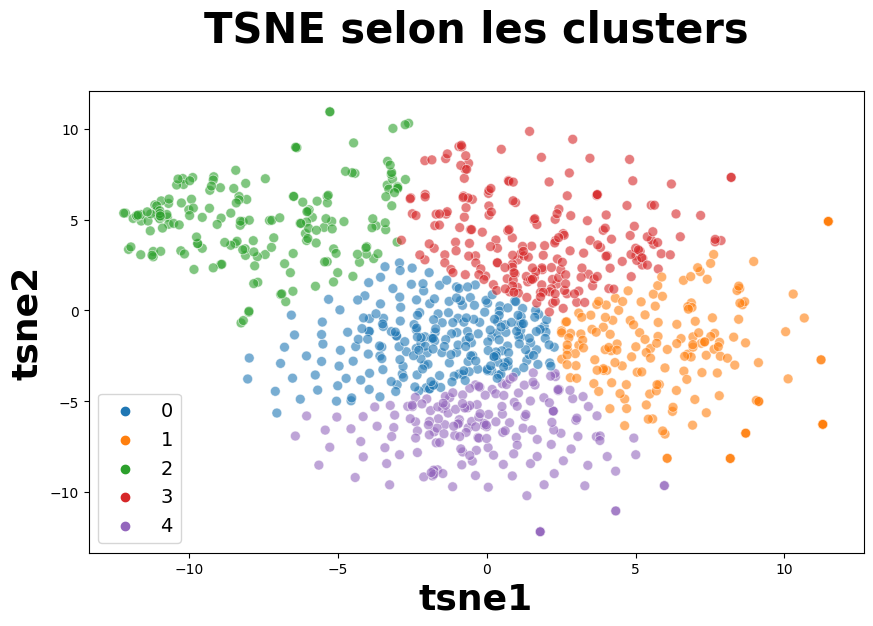

ARI :  0.15357235830055654


In [226]:
plt.figure(figsize=(10,6))
sns.scatterplot(
    x="tsne1", y="tsne2",
    hue="cluster",
    palette=sns.color_palette('tab10', n_colors=5), s=50, alpha=0.6,
    data=df_tsne,
    legend="brief")

plt.title('TSNE selon les clusters', fontsize = 30, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 26, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 26, fontweight = 'bold')
plt.legend(prop={'size': 14}) 

plt.show()

labels = df_images_ech["label"]
print("ARI : ", metrics.adjusted_rand_score(labels, cls.labels_))

##### <a name="C62363"> 6.2.3.6.3 Analyse par classe </a> 

In [227]:
df_tsne.groupby("cluster").count()["class"]

cluster
0    245
1    176
2    183
3    216
4    180
Name: class, dtype: int64

In [228]:
df_tsne.head()

,tsne1,tsne2,class,cluster
0,0.165760,-3.333378,inside,0
1,-6.797833,-2.030740,inside,0
2,-4.963530,-3.071267,inside,0
3,-0.815102,0.274140,inside,0
4,3.161419,-1.302067,inside,1


In [229]:
#Transformation des labels en class numérique pour utiliser la fonction confusion matrice ci-dessous

df_tsne["class_num"]=np.nan

df_tmp=df_tsne.loc[df_tsne["class"]=="inside"]
for index in df_tmp.index:
    df_tsne.loc[index,"class_num" ]=0
    
df_tmp=df_tsne.loc[df_tsne["class"]=="outside"]
for index in df_tmp.index:
    df_tsne.loc[index,"class_num" ]=1
    
df_tmp=df_tsne.loc[df_tsne["class"]=="food"]
for index in df_tmp.index:
    df_tsne.loc[index,"class_num" ]=2
    
df_tmp=df_tsne.loc[df_tsne["class"]=="drink"]
for index in df_tmp.index:
    df_tsne.loc[index,"class_num" ]=3
    
df_tmp=df_tsne.loc[df_tsne["class"]=="menu"]
for index in df_tmp.index:
    df_tsne.loc[index,"class_num" ]=4
    
df_tsne.tail(10)

,tsne1,tsne2,class,cluster,class_num
990,1.614666,5.046190,menu,3,4.0
991,-9.754378,4.037589,menu,2,4.0
992,-3.073022,-1.196417,menu,0,4.0
993,-10.375157,7.229784,menu,2,4.0
994,-9.987049,5.219481,menu,2,4.0
995,-8.200777,3.332962,menu,2,4.0
996,-10.972145,5.201932,menu,2,4.0
997,-11.410068,5.422381,menu,2,4.0
998,-1.865634,-8.937051,menu,4,4.0
999,-9.251957,6.844343,menu,2,4.0


In [230]:
conf_mat = metrics.confusion_matrix(df_tsne["class_num"], cls.labels_)
print(conf_mat)

[[ 87  36  12  51  14]
 [ 58  39  13  82   8]
 [ 32  36  14   6 112]
 [ 53  56  19  29  43]
 [ 15   9 125  48   3]]


In [231]:
def conf_mat_transform(y_true,y_pred) :
    conf_mat = metrics.confusion_matrix(y_true,y_pred)
    
    corresp = np.argmax(conf_mat, axis=0)
    #corresp = [0,3,4,1,2]
    print ("Correspondance des clusters : ", corresp)
    # y_pred_transform = np.apply_along_axis(correspond_fct, 1, y_pred)
    labels = pd.Series(y_true, name="y_true").to_frame()
    labels['y_pred'] = y_pred
    labels['y_pred_transform'] = labels['y_pred'].apply(lambda x : corresp[x]) 
    
    return labels['y_pred_transform']

cls_labels_transform = conf_mat_transform(df_tsne["class_num"], cls.labels_)
conf_mat = metrics.confusion_matrix(df_tsne["class_num"], cls_labels_transform)
print(conf_mat)
print()
print(metrics.classification_report(df_tsne["class_num"], cls_labels_transform))

Correspondance des clusters :  [0 3 4 1 2]
[[ 87  51  14  36  12]
 [ 58  82   8  39  13]
 [ 32   6 112  36  14]
 [ 53  29  43  56  19]
 [ 15  48   3   9 125]]

              precision    recall  f1-score   support

         0.0       0.36      0.43      0.39       200
         1.0       0.38      0.41      0.39       200
         2.0       0.62      0.56      0.59       200
         3.0       0.32      0.28      0.30       200
         4.0       0.68      0.62      0.65       200

    accuracy                           0.46      1000
   macro avg       0.47      0.46      0.47      1000
weighted avg       0.47      0.46      0.47      1000



<Axes: >

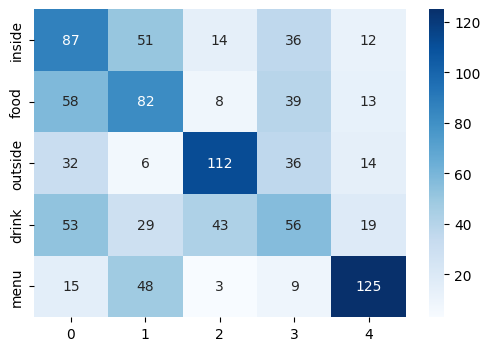

In [232]:
df_cm = pd.DataFrame(conf_mat, index = [label for label in list_labels],
                  columns = [i for i in "01234"])
plt.figure(figsize = (6,4))
sns.heatmap(df_cm, annot=True,fmt=".0f", cmap="Blues")

## <a name="C63"> 6.3 Convolutional neural network (CNN) </a> 

### <a name="C631"> 6.3.1 VGG16 : exploration </a> 

In [233]:
model = VGG16() # Création du modèle VGG-16 implementé par Keras

In [234]:
model.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

1/1 [==============================] - 1s 569ms/step
NOUVELLE IMAGE :


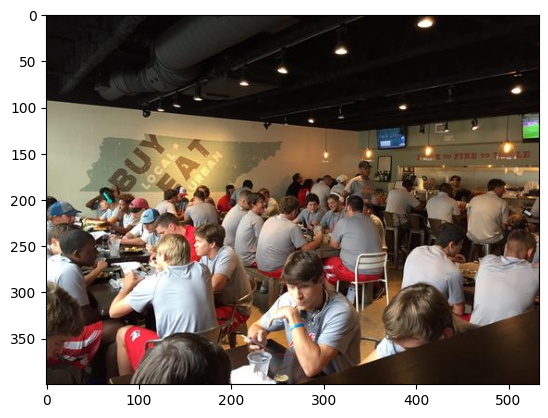

Top 3 : [('n04296562', 'stage', 0.6931821), ('n02088094', 'Afghan_hound', 0.1352281), ('n10148035', 'groom', 0.018453907)]
---------------------------------
1/1 [==============================] - 0s 151ms/step
NOUVELLE IMAGE :


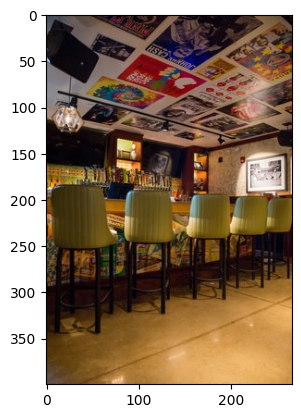

Top 3 : [('n04081281', 'restaurant', 0.49307048), ('n03452741', 'grand_piano', 0.24159615), ('n03461385', 'grocery_store', 0.07812385)]
---------------------------------
1/1 [==============================] - 0s 150ms/step
NOUVELLE IMAGE :


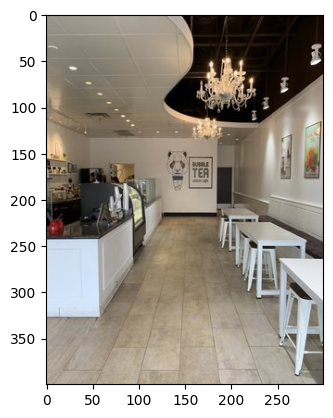

Top 3 : [('n04081281', 'restaurant', 0.29101697), ('n03956157', 'planetarium', 0.15196814), ('n02917067', 'bullet_train', 0.12073475)]
---------------------------------
1/1 [==============================] - 0s 151ms/step
NOUVELLE IMAGE :


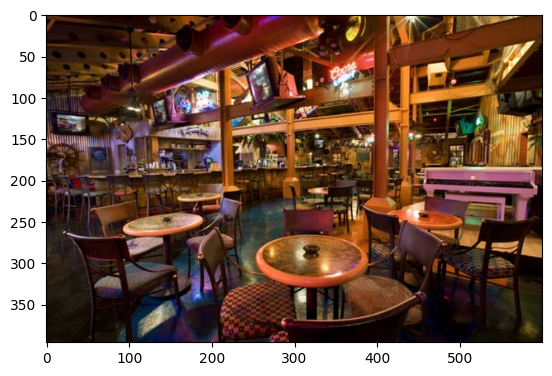

Top 3 : [('n04081281', 'restaurant', 0.8197977), ('n03089624', 'confectionery', 0.058153346), ('n03461385', 'grocery_store', 0.03010199)]
---------------------------------
1/1 [==============================] - 0s 164ms/step
NOUVELLE IMAGE :


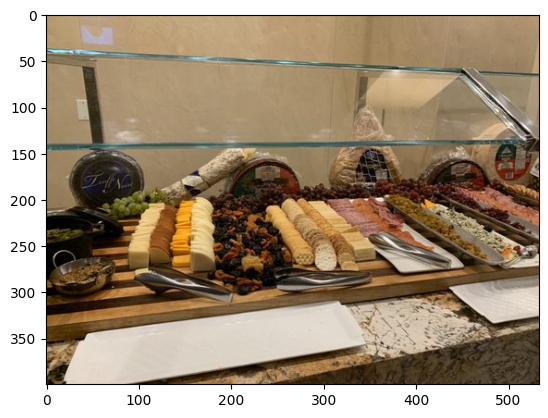

Top 3 : [('n13133613', 'ear', 0.21822758), ('n12144580', 'corn', 0.21786617), ('n03041632', 'cleaver', 0.20177518)]
---------------------------------


In [235]:


#for image_num in range(len(list_images_ech)) :
for image_num in range(5) :
    image=Image.open(path+list_images_ech[image_num]) 
    img = load_img(path+list_images_ech[image_num], target_size=(224, 224))  # Charger l'image
    img = img_to_array(img)  # Convertir en tableau numpy
    img = img.reshape((1, img.shape[0], img.shape[1], img.shape[2]))  # Créer la collection d'images (un seul échantillon)
    img = preprocess_input(img)  # Prétraiter l'image comme le veut VGG-16
    y = model.predict(img)  # Prédir la classe de l'image (parmi les 1000 classes d'ImageNet)
    # Afficher les 3 classes les plus probables
    print("NOUVELLE IMAGE :")
    plt.imshow(image)
    plt.show()
    print('Top 3 :', decode_predictions(y, top=3)[0])
    print("---------------------------------")
    

### <a name="C632"> 6.3.2 VGG16 : suppression de la dernière couche - apprentissage non-supervisé</a> 

#### <a name="C6321"> 6.3.2.1 Préparation du CNN et lecture des images </a> 

In [236]:


# J'enlève la dernière couche du VGG16 en mettant "include_top=False"
my_model = VGG16(weights="imagenet", include_top=False, input_shape=(224, 224, 3))

# Récupérer la sortie de ce réseau
my_model.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [237]:
features_list=[]
for image_num in range(len(list_images_ech)) :
    img = load_img(path+list_images_ech[image_num], target_size=(224, 224))  # Charger l'image
    img = img_to_array(img)  # Convertir en tableau numpy
    img = img.reshape((1, img.shape[0], img.shape[1], img.shape[2]))  # Créer la collection d'images (un seul échantillon)
    img = preprocess_input(img)  # Prétraiter l'image comme le veut VGG-16
    features = my_model.predict(img)
    features_list.append(features)
    

1/1 [==============================] - 0s 120ms/step


In [238]:
len(features_list)

1000

In [239]:
# Tranformation de la liste en array
features_list_array = np.asarray(features_list)
features_list_array.shape[0]

1000

In [240]:
# Reshape pour passer en 2 dimensions
features_list_array=features_list_array.reshape(features_list_array.shape[0],-1)
features_list_array

array([[ 0.       ,  0.       ,  0.       , ..., 10.03451  ,  5.816734 ,
        19.169    ],
       [ 7.16549  ,  0.       ,  0.       , ...,  0.       ,  7.1668673,
         0.       ],
       [ 4.3755217,  0.       ,  0.       , ...,  0.       ,  8.546946 ,
         0.       ],
       ...,
       [ 0.       ,  0.       ,  0.       , ...,  0.       , 12.029896 ,
         4.186974 ],
       [22.939507 ,  0.       , 72.74348  , ...,  0.       ,  2.062839 ,
         0.       ],
       [ 0.       ,  0.       ,  0.       , ...,  0.       ,  0.       ,
         0.       ]], dtype=float32)

#### <a name="C6322"> 6.3.2.2  Réductions de dimensions </a> 

##### <a name="C63221"> 6.3.2.2.1 PCA </a> 

In [241]:
print("Dimensions dataset avant réduction PCA : ", features_list_array.shape)
pca = decomposition.PCA(n_components=0.99)
feat_pca= pca.fit_transform(features_list_array)
print("Dimensions dataset après réduction PCA : ", feat_pca.shape)

Dimensions dataset avant réduction PCA :  (1000, 25088)
Dimensions dataset après réduction PCA :  (1000, 917)


##### <a name="C63222"> 6.3.2.2.2  T-SNE</a> 

In [242]:
tsne = manifold.TSNE(n_components=2, perplexity=30, 
                     n_iter=2000, init='random', random_state=6)
X_tsne = tsne.fit_transform(feat_pca)

df_tsne = pd.DataFrame(X_tsne[:,0:2], columns=['tsne1', 'tsne2'])
df_tsne["class"] = df_images_ech["label"]
print(df_tsne.shape)

(1000, 3)


#### <a name="C6323"> 6.3.2.3 Analyse visuelle : affichage T-SNE selon catégories d'images </a> 

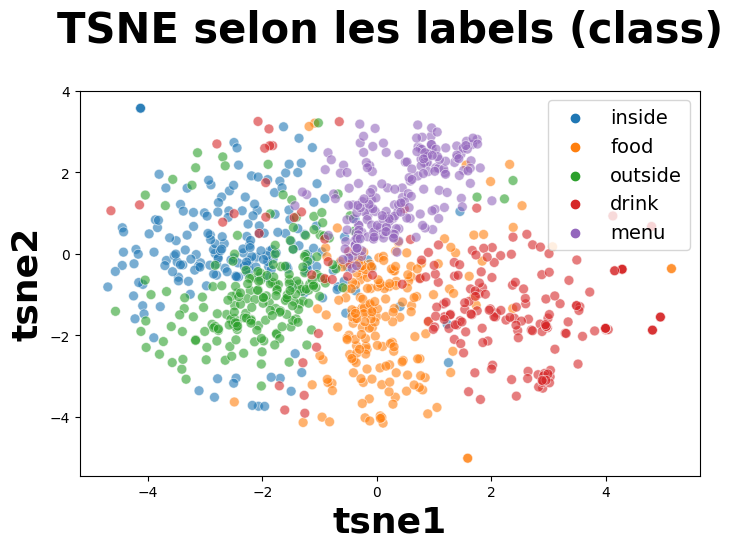

In [243]:
plt.figure(figsize=(8,5))
sns.scatterplot(
    x="tsne1", y="tsne2", hue="class", data=df_tsne, legend="brief",
    palette=sns.color_palette('tab10', n_colors=5), s=50, alpha=0.6)

plt.title('TSNE selon les labels (class)', fontsize = 30, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 26, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 26, fontweight = 'bold')
plt.legend(prop={'size': 14}) 

plt.show()

#### <a name="C6324"> 6.3.2.4 Analyse mesures : similarité entre catégories et clusters </a> 

##### <a name="C63241"> 6.3.2.4.1 Création de clusters à partir du T-SNE </a> 

In [244]:
cls = cluster.KMeans(n_clusters=5, random_state=6)
cls.fit(X_tsne)

df_tsne["cluster"] = cls.labels_
print(df_tsne.shape)

(1000, 4)


C:\Users\Utilisateur\anaconda3\envs\projet6\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [245]:
df_tsne.head()

,tsne1,tsne2,class,cluster
0,-2.326095,0.023413,inside,3
1,-4.085779,-0.747500,inside,3
2,-3.976541,0.491216,inside,3
3,-3.891035,0.043146,inside,3
4,-2.188155,1.915003,inside,3


##### <a name="C63242"> 6.3.2.4.2  Affichage des images selon clusters et calcul ARI de similarité catégories images / clusters </a> 

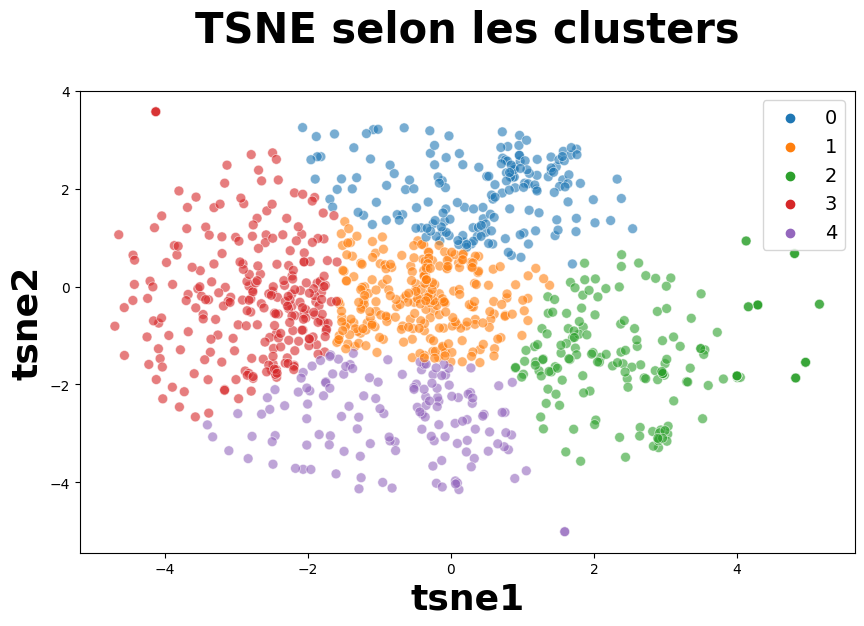

ARI :  0.35591633973492015


In [246]:
plt.figure(figsize=(10,6))
sns.scatterplot(
    x="tsne1", y="tsne2",
    hue="cluster",
    palette=sns.color_palette('tab10', n_colors=5), s=50, alpha=0.6,
    data=df_tsne,
    legend="brief")

plt.title('TSNE selon les clusters', fontsize = 30, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 26, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 26, fontweight = 'bold')
plt.legend(prop={'size': 14}) 

plt.show()

labels = df_images_ech["label"]
print("ARI : ", metrics.adjusted_rand_score(labels, cls.labels_))

##### <a name="C63243"> 6.3.2.4.3 Analyse par classe </a> 

In [247]:
df_tsne.groupby("cluster").count()["class"]

cluster
0    179
1    258
2    173
3    250
4    140
Name: class, dtype: int64

In [248]:
df_tsne.head()

,tsne1,tsne2,class,cluster
0,-2.326095,0.023413,inside,3
1,-4.085779,-0.747500,inside,3
2,-3.976541,0.491216,inside,3
3,-3.891035,0.043146,inside,3
4,-2.188155,1.915003,inside,3


In [249]:
#Transformation des labels en class numérique pour utiliser la fonction confusion matrice ci-dessous

df_tsne["class_num"]=np.nan

df_tmp=df_tsne.loc[df_tsne["class"]=="inside"]
for index in df_tmp.index:
    df_tsne.loc[index,"class_num" ]=0
    
df_tmp=df_tsne.loc[df_tsne["class"]=="outside"]
for index in df_tmp.index:
    df_tsne.loc[index,"class_num" ]=1
    
df_tmp=df_tsne.loc[df_tsne["class"]=="food"]
for index in df_tmp.index:
    df_tsne.loc[index,"class_num" ]=2
    
df_tmp=df_tsne.loc[df_tsne["class"]=="drink"]
for index in df_tmp.index:
    df_tsne.loc[index,"class_num" ]=3
    
df_tmp=df_tsne.loc[df_tsne["class"]=="menu"]
for index in df_tmp.index:
    df_tsne.loc[index,"class_num" ]=4
    
df_tsne.tail(10)

,tsne1,tsne2,class,cluster,class_num
990,-1.297934,1.517175,menu,0,4.0
991,0.969674,2.415975,menu,0,4.0
992,-0.591577,-0.139215,menu,1,4.0
993,0.821126,1.588194,menu,0,4.0
994,0.815171,1.972536,menu,0,4.0
995,0.801377,0.699490,menu,0,4.0
996,0.526380,0.880046,menu,0,4.0
997,0.163614,0.549508,menu,1,4.0
998,-0.343535,0.137988,menu,1,4.0
999,0.420516,1.026905,menu,0,4.0


In [250]:
conf_mat = metrics.confusion_matrix(df_tsne["class_num"], cls.labels_)
print(conf_mat)

[[ 13  36   2 136  13]
 [  6  54   0 106  34]
 [  7  92  15   0  86]
 [  8  21 156   8   7]
 [145  55   0   0   0]]


In [251]:
def conf_mat_transform(y_true,y_pred) :
    conf_mat = metrics.confusion_matrix(y_true,y_pred)
    
    #corresp = np.argmax(conf_mat, axis=0)
    corresp = [4,1,3,0,2]
    print ("Correspondance des clusters : ", corresp)
    # y_pred_transform = np.apply_along_axis(correspond_fct, 1, y_pred)
    labels = pd.Series(y_true, name="y_true").to_frame()
    labels['y_pred'] = y_pred
    labels['y_pred_transform'] = labels['y_pred'].apply(lambda x : corresp[x]) 
    
    return labels['y_pred_transform']

cls_labels_transform = conf_mat_transform(df_tsne["class_num"], cls.labels_)
conf_mat = metrics.confusion_matrix(df_tsne["class_num"], cls_labels_transform)
print(conf_mat)
print()
print(metrics.classification_report(df_tsne["class_num"], cls_labels_transform))

Correspondance des clusters :  [4, 1, 3, 0, 2]
[[136  36  13   2  13]
 [106  54  34   0   6]
 [  0  92  86  15   7]
 [  8  21   7 156   8]
 [  0  55   0   0 145]]

              precision    recall  f1-score   support

         0.0       0.54      0.68      0.60       200
         1.0       0.21      0.27      0.24       200
         2.0       0.61      0.43      0.51       200
         3.0       0.90      0.78      0.84       200
         4.0       0.81      0.72      0.77       200

    accuracy                           0.58      1000
   macro avg       0.62      0.58      0.59      1000
weighted avg       0.62      0.58      0.59      1000



<Axes: >

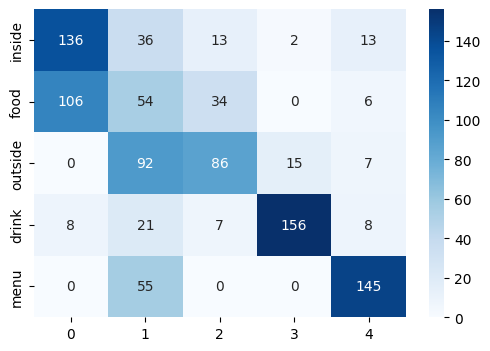

In [252]:
df_cm = pd.DataFrame(conf_mat, index = [label for label in list_labels],
                  columns = [i for i in "01234"])
plt.figure(figsize = (6,4))
sns.heatmap(df_cm, annot=True,fmt=".0f", cmap="Blues")

###### Validons la meilleure combinaison possible sur la correspondance des clusters (mesure sur macro_avg) :

In [253]:

def conf_mat_transform2(y_true,y_pred,test_list) :
    conf_mat = metrics.confusion_matrix(y_true,y_pred)
    
    #corresp = np.argmax(conf_mat, axis=0)
    corresp = test_list
    print ("Correspondance des clusters : ", corresp)
    # y_pred_transform = np.apply_along_axis(correspond_fct, 1, y_pred)
    labels = pd.Series(y_true, name="y_true").to_frame()
    labels['y_pred'] = y_pred
    labels['y_pred_transform'] = labels['y_pred'].apply(lambda x : corresp[x]) 
    
    return labels['y_pred_transform']

In [254]:

test_list = [0, 1, 2, 3, 4]
 
# Printing original list
print ("Ma liste initiale est: " + str(test_list))

Ma liste initiale est: [0, 1, 2, 3, 4]


In [255]:

# using random.shuffle()
# to shuffle a list
random.shuffle(test_list)
 
# Printing shuffled list
print ("Ma liste mélangée est : " +  str(test_list))

Ma liste mélangée est : [2, 4, 3, 1, 0]


In [256]:

cls_labels_transform = conf_mat_transform2(df_tsne["class_num"], cls.labels_,test_list)
conf_mat = metrics.confusion_matrix(df_tsne["class_num"], cls_labels_transform)
print(conf_mat)
print()
print(metrics.classification_report(df_tsne["class_num"], cls_labels_transform))

Correspondance des clusters :  [2, 4, 3, 1, 0]
[[ 13 136  13   2  36]
 [ 34 106   6   0  54]
 [ 86   0   7  15  92]
 [  7   8   8 156  21]
 [  0   0 145   0  55]]

              precision    recall  f1-score   support

         0.0       0.09      0.07      0.08       200
         1.0       0.42      0.53      0.47       200
         2.0       0.04      0.04      0.04       200
         3.0       0.90      0.78      0.84       200
         4.0       0.21      0.28      0.24       200

    accuracy                           0.34      1000
   macro avg       0.33      0.34      0.33      1000
weighted avg       0.33      0.34      0.33      1000



###### Meilleure liste = 4 1 3 0 2 

### <a name="C633"> 6.3.3 VGG16 : apprentissage supervisé - transfert learning </a> 

#### <a name="C6331"> 6.3.3.1 Configuration des paramètres principaux du modèle </a> 

In [257]:
# ---------------------------------------------------------------------------
# Configuration des paramètres
# ---------------------------------------------------------------------------
model_savepath    = 'cnn_vgg16_model_trained_2.h5'     

TRAINING_DIR      = 'data/images/photos'
TESTING_DIR       = 'data/images/photos'

IMGSIZE       = 224    # Taille de l'image en input
EPOCH         = 10#22     # nombre d'epoch 
BATCH_SIZE    = 16     # traitement par batch d'images avant la descente de gradient
FREEZE_LAYERS = 15     # pour un VGG16 freeze de réapprentissage de certaines couches
TRAIN         = True   # Entrainement ou utilisation d'un réseau déjà entrainé

#### <a name="C6332"> 6.3.3.2 Création des jeux de test, entrainement et validation </a> 

In [258]:
# Création de la liste des index de df_images utilisé pour df_image_ech
list_index_use=[]

list_index_use.append(df_inside.index)
list_index_use.append(df_food.index)
list_index_use.append(df_menu.index)
list_index_use.append(df_outside.index)
list_index_use.append(df_drink.index)


In [259]:
# Création d'une liste unique au lieu d'une liste de liste
list_index_use=np.asarray(list_index_use)

list_index_use=list_index_use.tolist()
list_index_use=sum(list_index_use, [])
len(list_index_use)

1000

In [260]:
# Création d'un dataframe sans les images utilisés par df_images_ech
df_images_cnn=df_images[~df_images.index.isin(list_index_use)]

In [261]:
df_images_cnn.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 199098 entries, 0 to 200097
Data columns (total 2 columns):
 #   Column    Non-Null Count   Dtype 
---  ------    --------------   ----- 
 0   photo_id  199098 non-null  object
 1   label     199098 non-null  object
dtypes: object(2)
memory usage: 4.6+ MB


In [262]:
#pd.options.mode.chained_assignment = None  # default='warn'
df_images_cnn["id"]=df_images_cnn["photo_id"] +".jpg"
df_images_cnn.reset_index(inplace= True)
df_images_cnn.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 199098 entries, 0 to 199097
Data columns (total 4 columns):
 #   Column    Non-Null Count   Dtype 
---  ------    --------------   ----- 
 0   index     199098 non-null  int64 
 1   photo_id  199098 non-null  object
 2   label     199098 non-null  object
 3   id        199098 non-null  object
dtypes: int64(1), object(3)
memory usage: 6.1+ MB


C:\Users\Utilisateur\AppData\Local\Temp\ipykernel_5988\975968956.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_images_cnn["id"]=df_images_cnn["photo_id"] +".jpg"


In [263]:
df_images_cnn=df_images_cnn[['label','id']].copy()
df_images_cnn.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 199098 entries, 0 to 199097
Data columns (total 2 columns):
 #   Column  Non-Null Count   Dtype 
---  ------  --------------   ----- 
 0   label   199098 non-null  object
 1   id      199098 non-null  object
dtypes: object(2)
memory usage: 3.0+ MB


In [264]:
# Création de la liste de photo qui peut poser problème lors du chargement

import PIL
from pathlib import Path
from PIL import UnidentifiedImageError
import os
from os.path import basename

list_pb=[]

path = Path("data/images/photos/").rglob("*.jpg")
i=0
for img_p in path:
    try:
        img = PIL.Image.open(img_p)
    except PIL.UnidentifiedImageError:
            #print(img_p)
            list_pb.append(basename(img_p))
            i=i+1
            
print("Il y a",len(list_pb),"photos qui posent un souci de chargement")

Il y a 106 photos qui posent un souci de chargement


In [265]:
# Création d'un dataframe sans les images utilisés par df_images_ech
df_images_cnn=df_images_cnn[~df_images_cnn["id"].isin(list_pb)]
df_images_cnn.reset_index(inplace= True)
df_images_cnn.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 198992 entries, 0 to 198991
Data columns (total 3 columns):
 #   Column  Non-Null Count   Dtype 
---  ------  --------------   ----- 
 0   index   198992 non-null  int64 
 1   label   198992 non-null  object
 2   id      198992 non-null  object
dtypes: int64(1), object(2)
memory usage: 4.6+ MB


In [266]:
df_images_cnn["label"].value_counts()

food       107847
inside      55828
outside     18369
drink       15470
menu         1478
Name: label, dtype: int64

In [267]:
#from sklearn.model_selection import train_test_split
#df_train, df_test = train_test_split(df_images_cnn, train_size=0.8, random_state=55)


In [268]:
# Je vais limiter le nombre d'échantillon dans df_test et df_train
'''CAS 1'''


# Pour le train, prise en compte de nouvelles images
df_train=df_images_cnn.sample(5000, random_state=55)
df_train.info()


# Pour le test, prise en compte de notre échantillon de 1000 images vues précédemment
df_test=df_images_ech.copy()
df_test.rename(columns = {'photo': 'id'}, inplace=True)
df_test.info()

# Pour le test, prise en compte de nouvelles images issue du train_test_plit ci-dessus
#df_test=df_test.sample(100, random_state=55)
#df_test.info()


'''CAS 2'''
# 1. on creer un df_train équilibré en terme de catégorie pour éviter l'influence de certaines classes
#echant=1000 # Nombre d"échantillons par catégorie

#df_inside_cnn=df_images_cnn.loc[df_images_cnn["label"]=="inside"]
#df_inside_cnn=df_inside_cnn.sample(echant, random_state=55)
#df_inside_cnn.info()

#df_outside_cnn=df_images_cnn.loc[df_images_cnn["label"]=="outside"]
#df_outside_cnn=df_outside_cnn.sample(echant, random_state=55)
#df_outside_cnn.info()

#df_menu_cnn=df_images_cnn.loc[df_images_cnn["label"]=="menu"]
#df_menu_cnn=df_menu_cnn.sample(echant, random_state=55)
#df_menu_cnn.info()

#df_drink_cnn=df_images_cnn.loc[df_images_cnn["label"]=="drink"]
#df_drink_cnn=df_drink_cnn.sample(echant, random_state=55)
#df_drink_cnn.info()

#df_food_cnn=df_images_cnn.loc[df_images_cnn["label"]=="food"]
#df_food_cnn=df_food_cnn.sample(echant, random_state=55)
#df_food_cnn.info()

# 2. Rassemblement des 5 dataframes
#df_images_cnn_ech=pd.concat([df_inside_cnn, df_food_cnn, df_outside_cnn, df_drink_cnn, df_menu_cnn], ignore_index=True)

#df_train=df_images_cnn_ech.copy()
#df_train.info()




<class 'pandas.core.frame.DataFrame'>
Int64Index: 5000 entries, 128174 to 105307
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   index   5000 non-null   int64 
 1   label   5000 non-null   object
 2   id      5000 non-null   object
dtypes: int64(1), object(2)
memory usage: 156.2+ KB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   photo_id  1000 non-null   object
 1   label     1000 non-null   object
 2   id        1000 non-null   object
dtypes: object(3)
memory usage: 23.6+ KB


'CAS 2'

In [269]:
df_train["label"].value_counts()

food       2690
inside     1417
outside     488
drink       372
menu         33
Name: label, dtype: int64

In [270]:
df_train.head()

,index,label,id
128174,128246,inside,dB0XewZSasWkhptk91o0OQ.jpg
18991,19001,food,54dIPqWWGx1lBJyx0uzmDw.jpg
31470,31484,outside,9756u4X3nrDwcKsfksHKPQ.jpg
171848,171941,drink,rF6cLx1E1qCGhaxQmbK3gg.jpg
192356,192456,inside,xsFPNtOjjhlPgA5bY2TIMg.jpg


In [271]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   photo_id  1000 non-null   object
 1   label     1000 non-null   object
 2   id        1000 non-null   object
dtypes: object(3)
memory usage: 23.6+ KB


In [272]:
df_test["label"].value_counts()

inside     200
food       200
outside    200
drink      200
menu       200
Name: label, dtype: int64

In [273]:
df_test.head()

,photo_id,label,id
0,2LYyVGMIEXtaxnGBgITkHA,inside,2LYyVGMIEXtaxnGBgITkHA.jpg
1,7i4idfMi-zWgKn6qNTzUNw,inside,7i4idfMi-zWgKn6qNTzUNw.jpg
2,Oeuu9tHpDM0yIayUTjhZLA,inside,Oeuu9tHpDM0yIayUTjhZLA.jpg
3,34YEnMZQkUb8khdoS2VKbQ,inside,34YEnMZQkUb8khdoS2VKbQ.jpg
4,SGu6o79AOM3Y_QjqCERUZQ,inside,SGu6o79AOM3Y_QjqCERUZQ.jpg


In [274]:
# Image generator: attention il est préférable de ne pas utiliser d'augmentation de données
# Nous utilisons également un processing spécifique au VGG16 et non pas un rescale 1./255
train_datagen =  \
        ImageDataGenerator(
            preprocessing_function=preprocess_input,
            validation_split=0.20)

train_generator = \
        train_datagen.flow_from_dataframe(
            df_train,
            TRAINING_DIR,
            x_col='id',
            y_col='label',
            #has_ext=True,
            shuffle=True,
            target_size=(IMGSIZE, IMGSIZE),
            batch_size=BATCH_SIZE,
            subset='training',
            class_mode='categorical')

train_labels = to_categorical(train_generator.classes)

Found 4000 validated image filenames belonging to 5 classes.


In [275]:
# -------
#  Jeu de validation
# -------

valid_generator = \
        train_datagen.flow_from_dataframe(
            df_train,
            TRAINING_DIR,
            x_col='id',
            y_col='label',
            #has_ext=True,
            shuffle=True,
            target_size=(IMGSIZE, IMGSIZE),
            batch_size=BATCH_SIZE,
            subset='validation',
            class_mode='categorical')

Found 1000 validated image filenames belonging to 5 classes.


In [276]:
# -------
# Jeu de test
# -------

test_files = os.listdir(TESTING_DIR)
#df_test = pd.DataFrame({"id": test_files, 'label': 'nan'})

test_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)    
test_generator = \
    test_datagen.flow_from_dataframe(
        df_test, 
        TESTING_DIR, 
        x_col='id',
        y_col=None, 
        #has_ext=True, 
        target_size=(IMGSIZE, IMGSIZE), 
        class_mode=None, 
        seed=42,
        batch_size=1, 
        shuffle=False
    )

Found 1000 validated image filenames.


#### <a name="C6333"> 6.3.3.3 Préparation du CNN et entrainement </a> 

In [277]:
# -----------
# VGG16 pre-entrainé sans le classifier final
# https://github.com/keras-team/keras/issues/4465
# -----------

# Déclaration du modèle VGG16 (sans le top qui est le classifier)
base_model = VGG16(include_top=False, weights=None, input_tensor=None,
            input_shape=(IMGSIZE, IMGSIZE, 3))

# Chargement des points préentrainés du modèle
# Dataset = Full Keras Pretrained No Top
base_model.load_weights('vgg16_weights_tf_dim_ordering_tf_kernels_notop.h5')

In [278]:
# Classifier
x = base_model.output
x = Flatten()(x)
x = Dropout(0.5)(x)
#x = Dense(128, activation='relu', name='top-fc1')(x)
#x = Dense(128, activation='relu', name='top-fc2')(x)
#x = Dropout(0.3)(x)

# output layer: nombre de neurones de sortie = nombre de classe a prédire
output_layer = Dense(5, activation='softmax', name='softmax')(x)

In [279]:
# Assemblage du modèle final
net_final = Model(inputs=base_model.input, outputs=output_layer)

# freeze de certains layers (spécifique au modèle utilisé)
for layer in net_final.layers[:FREEZE_LAYERS]:
    layer.trainable = False
    
# Entrainement des derniers layers de classification
for layer in net_final.layers[FREEZE_LAYERS:]:
    layer.trainable = True

# compilation du modele
net_final.compile(optimizer=Adam(learning_rate=1e-5), loss='categorical_crossentropy', metrics=['accuracy'])
print(net_final.summary())

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [280]:
# Génération des STEPS_SIZE (comme nous utilisons des générateurs infinis)
# Ceci est nécessaire pour déterminer à quel moment nous avons parcouru entiérement nos jeu de données
STEP_SIZE_TRAIN = train_generator.n // train_generator.batch_size
STEP_SIZE_VALID = valid_generator.n // valid_generator.batch_size
STEP_SIZE_TEST  = test_generator.n  // test_generator.batch_size

In [281]:
if (TRAIN):
    
    # Création des Callbacks à appeler aprés chaque epoch
    #   pour sauvegarde des résultats
    checkpoint = ModelCheckpoint("model_1.h5", monitor='val_loss', verbose=1, save_best_only=True, save_weights_only=False, mode='auto', save_freq='epoch')
    #   pour arrêt prématuré
    early = EarlyStopping(monitor='val_loss', min_delta=0, patience=5, verbose=1, mode='auto')
    
    # Entrainement du modèle
    '''history = net_final.fit_generator(
                    generator=train_generator,
                    steps_per_epoch = STEP_SIZE_TRAIN,
                    validation_data = valid_generator,
                    validation_steps = STEP_SIZE_VALID,
                    callbacks = [checkpoint, early],
                    epochs = EPOCH)'''
    
    history = net_final.fit(train_generator, epochs=EPOCH, validation_data=valid_generator) 
    
    # Sauvegarde du réseau après entrainement
    net_final.save(model_savepath)    
    
else:
    net_final.load_weights(model_savepath) 

Epoch 1/10
250/250 [==============================] - 617s 2s/step - loss: 6.0514 - accuracy: 0.5735 - val_loss: 1.2643 - val_accuracy: 0.7630
Epoch 2/10
250/250 [==============================] - 615s 2s/step - loss: 1.3494 - accuracy: 0.7365 - val_loss: 0.7149 - val_accuracy: 0.8110
Epoch 3/10
250/250 [==============================] - 611s 2s/step - loss: 0.8094 - accuracy: 0.7993 - val_loss: 0.5880 - val_accuracy: 0.8430
Epoch 4/10
250/250 [==============================] - 609s 2s/step - loss: 0.5239 - accuracy: 0.8482 - val_loss: 0.5328 - val_accuracy: 0.8650
Epoch 5/10
250/250 [==============================] - 614s 2s/step - loss: 0.4273 - accuracy: 0.8700 - val_loss: 0.4951 - val_accuracy: 0.8690
Epoch 6/10
250/250 [==============================] - 611s 2s/step - loss: 0.3359 - accuracy: 0.9010 - val_loss: 0.4684 - val_accuracy: 0.8740
Epoch 7/10
250/250 [==============================] - 608s 2s/step - loss: 0.2530 - accuracy: 0.9175 - val_loss: 0.4709 - val_accuracy: 0.8850

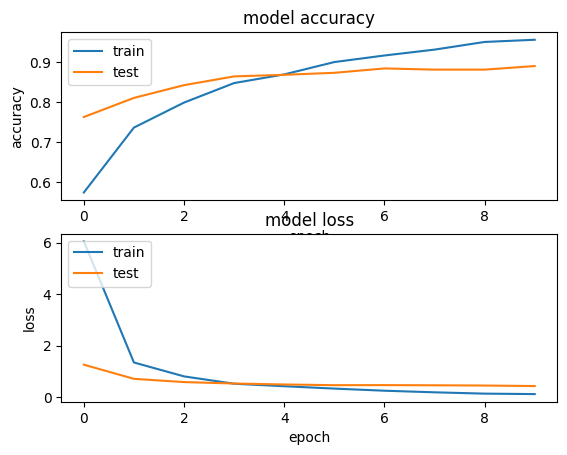

In [282]:
# --------------------------------------
# Affichage des courbes accuracy et Loss
# --------------------------------------
if (TRAIN):
    plt.figure(1)
    plt.subplot(211)
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])
    plt.title('model accuracy')
    plt.ylabel('accuracy')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'], loc='upper left')

    plt.subplot(212)
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'], loc='upper left')
    plt.show() 

In [283]:
# Evaluation du modèle
(eval_loss, eval_accuracy) = net_final.evaluate_generator(generator=valid_generator, steps=STEP_SIZE_TEST)
print("[INFO] accuracy: {:.2f}%".format(eval_accuracy * 100))
print("[INFO] Loss: {}".format(eval_loss))

C:\Users\Utilisateur\AppData\Local\Temp\ipykernel_5988\2227910394.py:2: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  (eval_loss, eval_accuracy) = net_final.evaluate_generator(generator=valid_generator, steps=STEP_SIZE_TEST)


[INFO] accuracy: 89.10%
[INFO] Loss: 0.4345335364341736


#### <a name="C6334"> 6.3.3.4 Prédictions </a> 

In [284]:
# Affichage des classes du jeu d'entrainement
train_generator.class_indices

{'drink': 0, 'food': 1, 'inside': 2, 'menu': 3, 'outside': 4}

In [285]:
# Génération des prédictions
test_generator.reset()
#pred = net_final.predict_generator(test_generator, steps=STEP_SIZE_TEST, verbose=1)
pred = net_final.predict(test_generator, steps=STEP_SIZE_TEST, verbose=1)

1000/1000 [==============================] - 124s 124ms/step


In [286]:
len(pred[:,1])

1000

In [287]:
# Enregistrement fichier soumission
soumission=pd.DataFrame({"id":test_generator.filenames,"drink":pred[:,0],"food":pred[:,1],"inside":pred[:,2],"menu":pred[:,3],"outside":pred[:,4]})
soumission["max"]=soumission[["drink","food","inside","menu","outside"]].max(axis=1)
#soumission['id'] = soumission['id'].str[:-4].astype('int')
soumission = soumission.sort_values(by=['id'])
soumission.reset_index(inplace=True, drop=True)
soumission.to_csv('soumission.csv', index=False)
soumission.head()

,id,drink,food,inside,menu,outside,max
0,--9zKbcEd-DXH4ZUiEI4UA.jpg,0.312449,0.003922,0.025935,3.438013e-01,0.313893,0.343801
1,-3vf95U5pvznoAbfMq0yMw.jpg,0.013705,0.985415,0.000015,6.662515e-04,0.000199,0.985415
2,-686kDLIAahJUx26VrHcxw.jpg,0.085597,0.044701,0.143098,1.073874e-04,0.726497,0.726497
3,-6vTQzK9BSSRadnkKTBIow.jpg,0.837021,0.162398,0.000341,4.377673e-07,0.000239,0.837021
4,-C5SHGsPPuVqEZPnWQYrFw.jpg,0.000914,0.001168,0.020084,3.948307e-04,0.977439,0.977439


In [288]:
soumission.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 7 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   id       1000 non-null   object 
 1   drink    1000 non-null   float32
 2   food     1000 non-null   float32
 3   inside   1000 non-null   float32
 4   menu     1000 non-null   float32
 5   outside  1000 non-null   float32
 6   max      1000 non-null   float32
dtypes: float32(6), object(1)
memory usage: 31.4+ KB


In [289]:
# Recherche du nom de la colonne qui a un max

soumission["max_name"]=np.nan
soumission = soumission.astype({'max_name': object})

for index in soumission.index:
    if soumission.loc[index, "drink"]==soumission.loc[index,"max"]:
            soumission.loc[index, "max_name"]="drink"

for index in soumission.index:
    if soumission.loc[index, "food"]==soumission.loc[index,"max"]:
            soumission.loc[index, "max_name"]="food"
            
for index in soumission.index:
    if soumission.loc[index, "inside"]==soumission.loc[index,"max"]:
            soumission.loc[index, "max_name"]="inside"
            
for index in soumission.index:
    if soumission.loc[index, "menu"]==soumission.loc[index,"max"]:
            soumission.loc[index, "max_name"]="menu"
            
for index in soumission.index:
    if soumission.loc[index, "outside"]==soumission.loc[index,"max"]:
            soumission.loc[index, "max_name"]="outside"
            
soumission.head()

    
    

,id,drink,food,inside,menu,outside,max,max_name
0,--9zKbcEd-DXH4ZUiEI4UA.jpg,0.312449,0.003922,0.025935,3.438013e-01,0.313893,0.343801,menu
1,-3vf95U5pvznoAbfMq0yMw.jpg,0.013705,0.985415,0.000015,6.662515e-04,0.000199,0.985415,food
2,-686kDLIAahJUx26VrHcxw.jpg,0.085597,0.044701,0.143098,1.073874e-04,0.726497,0.726497,outside
3,-6vTQzK9BSSRadnkKTBIow.jpg,0.837021,0.162398,0.000341,4.377673e-07,0.000239,0.837021,drink
4,-C5SHGsPPuVqEZPnWQYrFw.jpg,0.000914,0.001168,0.020084,3.948307e-04,0.977439,0.977439,outside


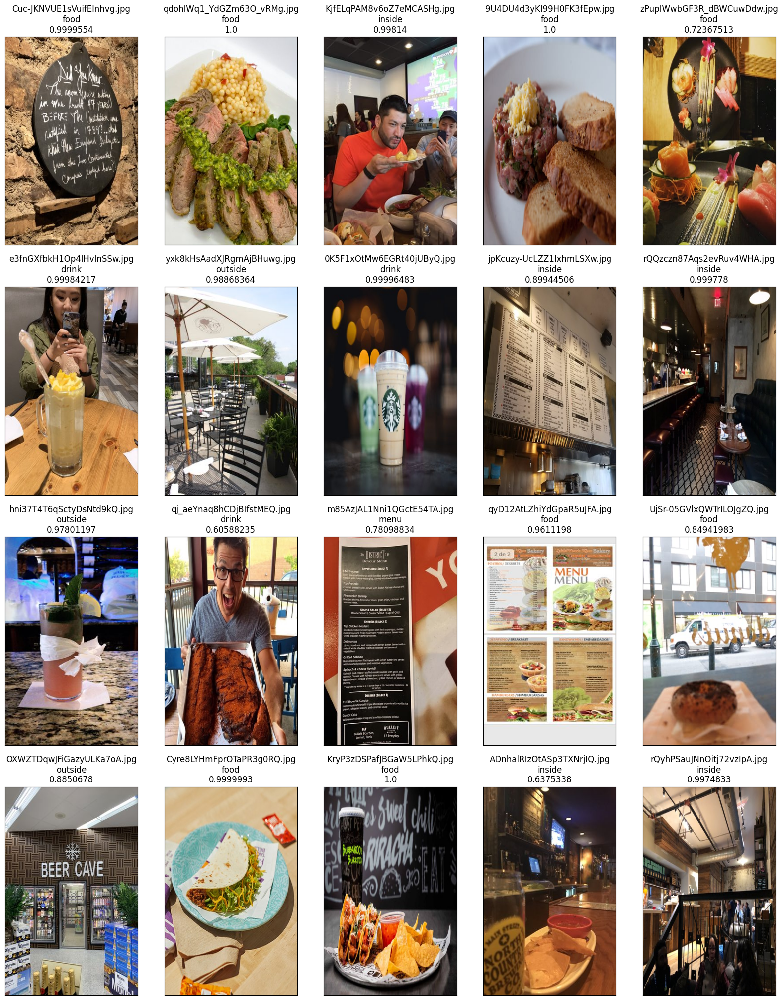

In [297]:
# ---------------------------------------------------------
# Affichage aléatoires images prédites
# ---------------------------------------------------------


n = soumission.shape[0]
f = list(np.arange(1,n))

c = 20
r =random.sample(f, c)
nrows = 4
ncols = 5
fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(nrows*5, ncols*5))    
for i in range(c):
    file = str(soumission['id'][r[i]])
    path = TESTING_DIR + "/" + file
    img = plt.imread(path)
    plt.subplot(4, 5, i+1)
    plt.imshow(img, aspect='auto')
    plt.xticks([])
    plt.yticks([])
    plt.title(str(soumission['id'][r[i]])+"\n"+str(soumission['max_name'][r[i]])+"\n"+str(soumission['max'][r[i]]))
plt.show()

In [291]:
soumission.head()

,id,drink,food,inside,menu,outside,max,max_name
0,--9zKbcEd-DXH4ZUiEI4UA.jpg,0.312449,0.003922,0.025935,3.438013e-01,0.313893,0.343801,menu
1,-3vf95U5pvznoAbfMq0yMw.jpg,0.013705,0.985415,0.000015,6.662515e-04,0.000199,0.985415,food
2,-686kDLIAahJUx26VrHcxw.jpg,0.085597,0.044701,0.143098,1.073874e-04,0.726497,0.726497,outside
3,-6vTQzK9BSSRadnkKTBIow.jpg,0.837021,0.162398,0.000341,4.377673e-07,0.000239,0.837021,drink
4,-C5SHGsPPuVqEZPnWQYrFw.jpg,0.000914,0.001168,0.020084,3.948307e-04,0.977439,0.977439,outside


In [292]:
df_test = df_test.sort_values(by=['id'])
df_test.reset_index(inplace=True, drop=True)
df_test.head()

,photo_id,label,id
0,--9zKbcEd-DXH4ZUiEI4UA,inside,--9zKbcEd-DXH4ZUiEI4UA.jpg
1,-3vf95U5pvznoAbfMq0yMw,menu,-3vf95U5pvznoAbfMq0yMw.jpg
2,-686kDLIAahJUx26VrHcxw,inside,-686kDLIAahJUx26VrHcxw.jpg
3,-6vTQzK9BSSRadnkKTBIow,drink,-6vTQzK9BSSRadnkKTBIow.jpg
4,-C5SHGsPPuVqEZPnWQYrFw,outside,-C5SHGsPPuVqEZPnWQYrFw.jpg


In [293]:
print(metrics.classification_report(df_test["label"], soumission["max_name"]))

              precision    recall  f1-score   support

       drink       0.84      0.68      0.75       200
        food       0.70      0.96      0.81       200
      inside       0.59      0.89      0.71       200
        menu       0.95      0.47      0.63       200
     outside       0.82      0.66      0.73       200

    accuracy                           0.73      1000
   macro avg       0.78      0.73      0.73      1000
weighted avg       0.78      0.73      0.73      1000



In [294]:
soumission["max_name"].nunique()

5

In [295]:
print("ARI : ", metrics.adjusted_rand_score(df_test["label"], soumission["max_name"]))

ARI :  0.4551908042180973


# 7. Synthèse

Voir "Renard_Anthony_3_page_web_022023.ipynb"

# FIN 